In [1]:
# The first thing we should do is to apply hardware acceleration via GPU. So, we have to go to Editar - Configuracion del Cuaderno - Acelerador por Hardware GPU

# Now we SET UP Fastai
!pip install -Uqq fastbook
!pip install nbdev
import fastbook
fastbook.setup_book()
import fastai
import fastcore
print(f'fastcore version {fastcore.__version__} installed')
print(f'fastai version {fastai.__version__} installed')
from nbdev.showdoc import *
from fastai.vision.all import *

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 487.4/487.4 kB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 41.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 31.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# Function to display evaluation metrics
# Developed by Ignacio Oguiza: https://forums.fast.ai/t/plotting-metrics-after-learning/69937

@patch
@delegates(subplots)
def plot_metrics(self: Recorder, nrows=None, ncols=None, figsize=None, **kwargs):
    metrics = np.stack(self.values)
    names = self.metric_names[1:-1]
    n = len(names) - 1
    if nrows is None and ncols is None:
        nrows = int(math.sqrt(n))
        ncols = int(np.ceil(n / nrows))
    elif nrows is None: nrows = int(np.ceil(n / ncols))
    elif ncols is None: ncols = int(np.ceil(n / nrows))
    figsize = figsize or (ncols * 6, nrows * 4)
    fig, axs = subplots(nrows, ncols, figsize=figsize, **kwargs)
    axs = [ax if i < n else ax.set_axis_off() for i, ax in enumerate(axs.flatten())][:n]
    for i, (name, ax) in enumerate(zip(names, [axs[0]] + axs)):
        ax.plot(metrics[:, i], color='#1f77b4' if i == 0 else '#ff7f0e', label='valid' if i > 0 else 'train')
        ax.set_title(name if i > 1 else 'losses')
        ax.legend(loc='best')
    plt.show()

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

def plot_label_counts(dls):
    # Extraer y convertir las etiquetas a enteros:
    train_labels = [int(dls.train_ds[i][1]) for i in range(len(dls.train_ds))]
    valid_labels = [int(dls.valid_ds[i][1]) for i in range(len(dls.valid_ds))]

    # Contar el número de elementos por etiqueta:
    train_counts = Counter(train_labels)
    valid_counts = Counter(valid_labels)

    # Obtenemos el vocabulario (lista de nombres de clases) y el número de clases:
    vocab = dls.vocab
    n_classes = len(vocab)

    # Crear listas de conteos usando los índices (0, 1, ..., n_classes-1)
    train_data = [train_counts[i] for i in range(n_classes)]
    valid_data = [valid_counts[i] for i in range(n_classes)]

    # Configurar el gráfico de barras agrupadas:
    x = np.arange(n_classes)
    width = 0.35

    fig, ax = plt.subplots(figsize=(10,6))
    ax.bar(x - width/2, train_data, width, label='Train', color='blue')
    ax.bar(x + width/2, valid_data, width, label='Valid', color='yellow')

    ax.set_ylabel('Número de elementos')
    ax.set_xticks(x)
    ax.set_xticklabels(vocab)
    ax.legend()

    plt.show()


# Apartado 1

In [4]:
os.environ["FASTAI_HOME"] = str(Path('/content/dataset'))

try:
  path = untar_data(URLs.CIFAR)
except Exception as e:
  print(f"Error al descargar el dataset: {e}")


In [5]:
# Definir rutas para la organización
base_path = Path('/content/dataset')
original_path = base_path / "original"

original_path.mkdir(parents=True, exist_ok=True)

dest_original = original_path / path.name
if not dest_original.exists():
    shutil.move(str(path), str(dest_original))
    print(f"Dataset movido a: {dest_original}")
else:
    print("El dataset ya se encuentra en la carpeta original.")

Dataset movido a: /content/dataset/original/cifar10


In [6]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## Lenet

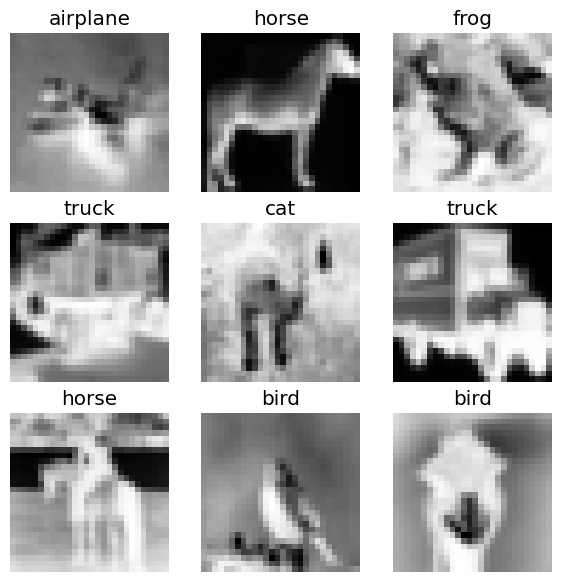

In [7]:
# Crear los DataLoaders
blocks = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    item_tfms=Resize(28)
)

# Crear los DataLoaders
dls = blocks.dataloaders(original_path/'cifar10'/'train', bs=64)

# Mostrar una muestra de las imágenes para verificar la correcta organización
dls.show_batch(max_n=9, figsize=(7,7))


Número total de imágenes en entrenamiento: 40000
Número total de imágenes en validación: 10000

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


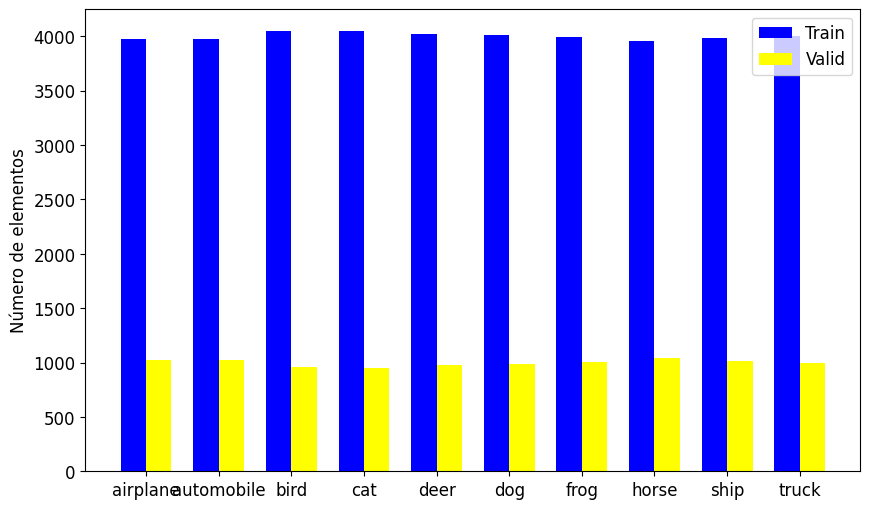

In [8]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class LeNet(nn.Module):
  def __init__(self, num_classes=10):
    super(LeNet, self).__init__()
    self.conv1 = nn.Conv2d(1, 6, kernel_size=5)
    self.conv2 = nn.Conv2d(6, 16, kernel_size=5)
    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.fc1 = nn.Linear(16 * 4 * 4, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, num_classes)

  def forward(self, x):
    x = F.relu(self.conv1(x))
    x = self.pool(x)
    x = F.relu(self.conv2(x))
    x = self.pool(x)
    x = x.view(x.size(0), -1)  # Aplanar la salida
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = self.fc3(x)
    return x

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

learn.summary()

LeNet (Input shape: 64 x 1 x 28 x 28)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 6 x 24 x 24    
Conv2d                                    156        True      
____________________________________________________________________________
                     64 x 16 x 8 x 8     
Conv2d                                    2416       True      
____________________________________________________________________________
                     64 x 16 x 4 x 4     
MaxPool2d                                                      
____________________________________________________________________________
                     64 x 120            
Linear                                    30840      True      
____________________________________________________________________________
                     64 x 84             
Linear                                    10164      True      
____________________________________________________________

In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.228228,2.205205,0.181800,0.184543,0.138305,01:03
1,2.041262,2.005547,0.282500,0.283940,0.275873,01:18
2,1.826973,1.807369,0.342700,0.343849,0.328343,01:15
3,1.722906,1.703664,0.379100,0.381274,0.370269,01:19
4,1.645619,1.687688,0.385700,0.387500,0.375721,01:00
5,1.558953,1.591059,0.430900,0.433137,0.423742,01:00
6,1.484773,1.539041,0.446800,0.447416,0.436892,01:01
7,1.451758,1.525388,0.464400,0.465662,0.457085,00:59
8,1.406875,1.451187,0.476300,0.478823,0.471705,00:59
9,1.385579,1.426195,0.488000,0.489789,0.483902,01:00



Tiempo de entrenamiento: 1261.63 segundos


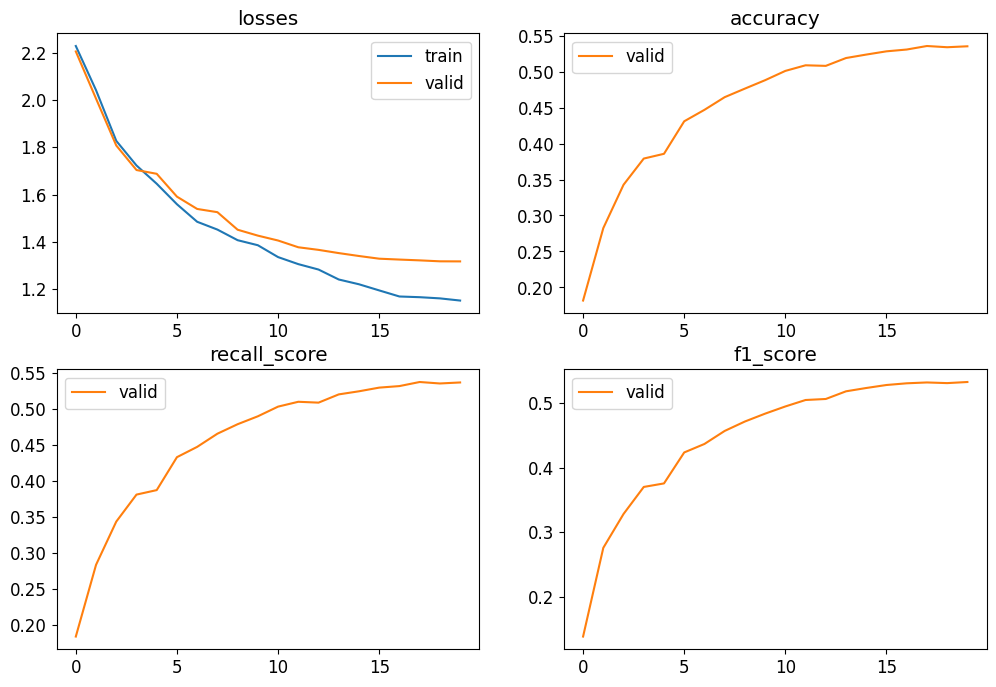

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 1.3172
Accuracy: 0.5351
Recall: 0.5367
F1-Score: 0.5330


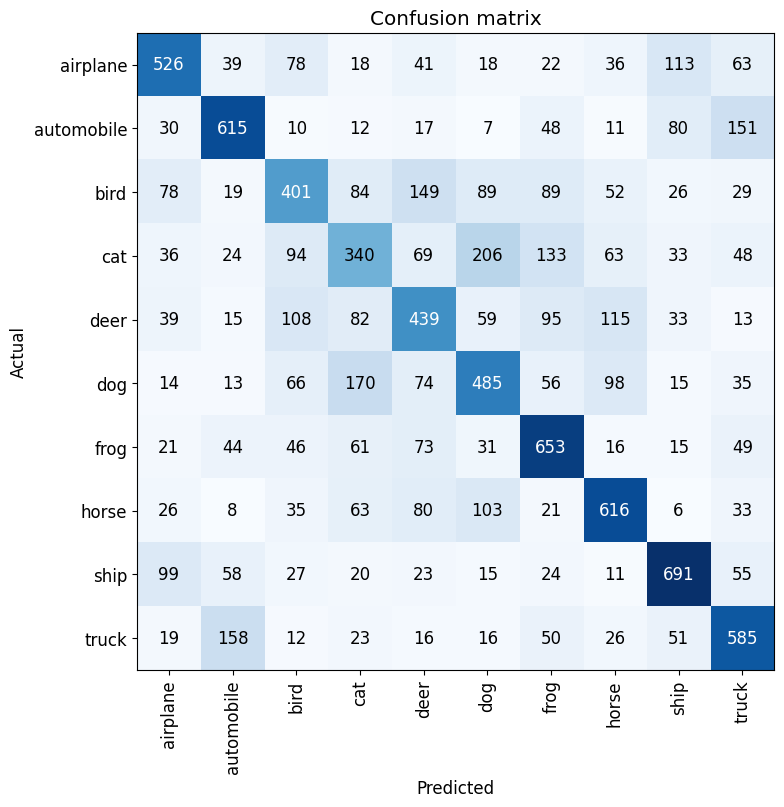

In [ ]:
#Creamos la interpretación de nuestro learner
interp = ClassificationInterpretation.from_learner(learn)

#Visualizamos la matriz de confusión
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_original_v2.pkl')

## Resnet18

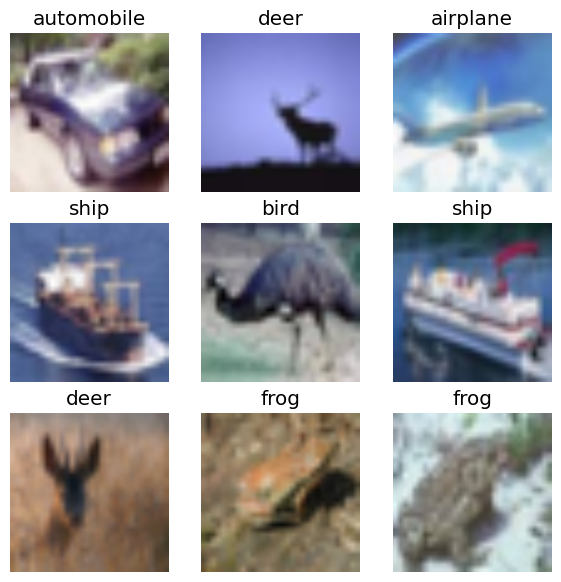

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

dls = dblock.dataloaders(original_path/'cifar10'/'train', bs=64)

dls.show_batch(max_n=9, figsize=(7,7))


In [ ]:
# Crear el learner con resnet18
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])
learn.summary()

Sequential (Input shape: 64 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 64 x 112 x 112 
Conv2d                                    9408       True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     64 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                      

In [ ]:
# Entrenar el modelo
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.090381,2.122317,0.323900,0.325420,0.284721,03:01
1,1.613373,2.803111,0.315700,0.317923,0.287236,02:47
2,1.167108,1.218266,0.582400,0.583148,0.589631,02:47
3,0.847544,0.877221,0.694600,0.696690,0.689745,02:46
4,0.708340,0.735071,0.752300,0.751598,0.753957,02:46
5,0.566715,0.571304,0.805200,0.805323,0.805512,02:45
6,0.471611,0.535082,0.818600,0.819446,0.818475,02:46
7,0.394259,0.596442,0.807900,0.808854,0.808261,02:47
8,0.294328,0.515420,0.836700,0.836666,0.837540,02:46
9,0.215291,0.533767,0.842500,0.843161,0.842854,02:46


No improvement since epoch 8: early stopping

Tiempo de entrenamiento: 2015.55 segundos


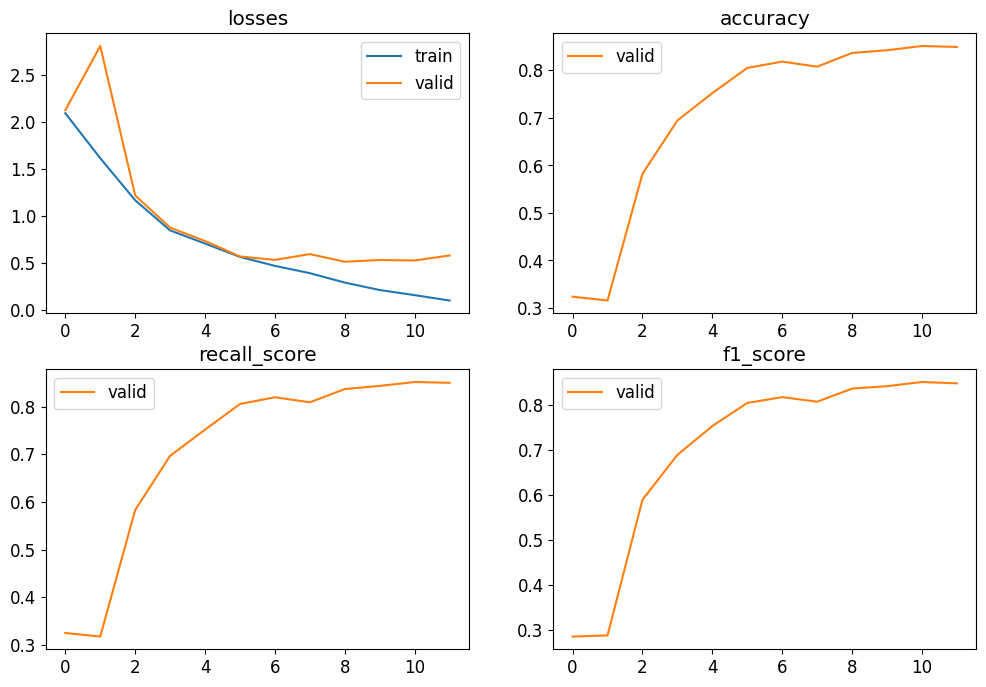

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 0.5817
Accuracy: 0.8494
Recall: 0.8497
F1-Score: 0.8492


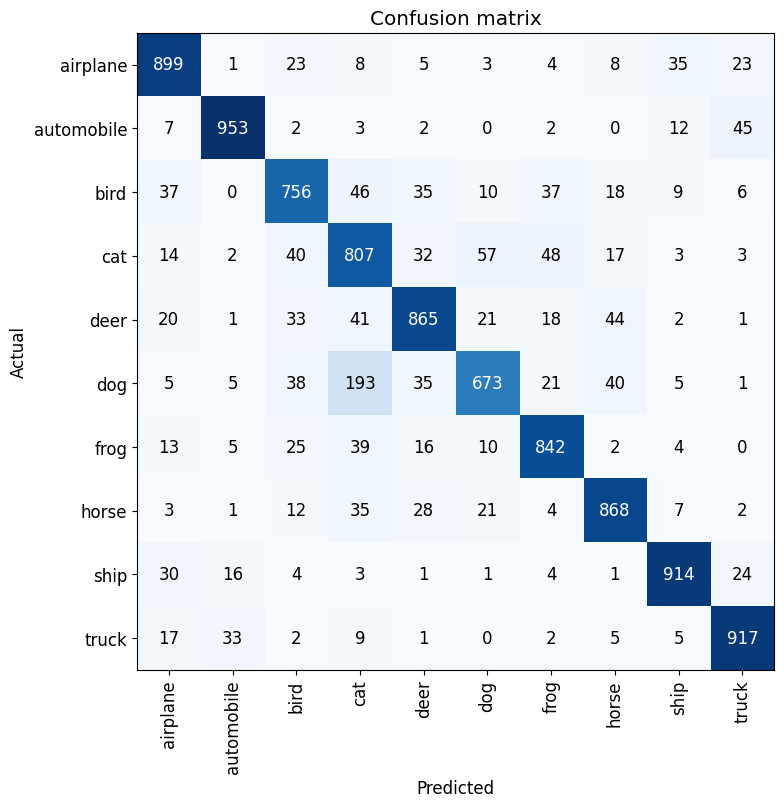

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_original_v2.pkl')

# Apartado 2

## Data destilacion

In [ ]:
import random
import shutil
from pathlib import Path
import numpy as np
from PIL import Image

def media_arit(image_paths):
    avg_image = None
    count = 0
    for img_path in image_paths:
        with Image.open(img_path) as img:
            np_img = np.array(img, dtype=np.float32)
            if avg_image is None:
                avg_image = np_img
            else:
                avg_image += np_img
            count += 1
    avg_image /= count
    avg_image = np.clip(avg_image, 0, 255).astype(np.uint8)
    return Image.fromarray(avg_image)  # PIL infiere el modo según la forma

In [ ]:
def create_distilled(src_path, dst_path, valid_ratio=0.2, fraction=0.2, mix_function=media_arit):
    """
    Genera un nuevo dataset a partir de la carpeta src_path.
    - Se crea una división: valid_ratio de las imágenes se destinan a validación (se copian sin modificar)
      y el resto (1 - valid_ratio) se destilan (agrupando imágenes según 'fraction').
    - Se espera que src_path tenga subcarpetas para cada clase.
    """
    src_path = Path(src_path)
    dst_path = Path(dst_path)

    # Si ya existe la carpeta destino, se elimina
    if dst_path.exists():
        shutil.rmtree(dst_path)
    dst_path.mkdir(parents=True, exist_ok=True)

    # Crear subcarpetas para training y validación
    train_dst = dst_path / "training"
    valid_dst = dst_path / "valid"
    train_dst.mkdir(parents=True, exist_ok=True)
    valid_dst.mkdir(parents=True, exist_ok=True)

    # Procesar cada carpeta de clase en src_path
    for class_dir in src_path.iterdir():
        if not class_dir.is_dir():
            continue

        images = list(class_dir.glob('*.*'))
        if len(images) == 0:
            continue

        # Barajar para una división aleatoria
        random.shuffle(images)
        n_total = len(images)
        n_valid = int(n_total * valid_ratio)
        n_train = n_total - n_valid

        train_images = images[:n_train]
        valid_images = images[n_train:]

        # Crear directorios para la clase en training y valid
        new_train_class_dir = train_dst / class_dir.name
        new_train_class_dir.mkdir(parents=True, exist_ok=True)
        new_valid_class_dir = valid_dst / class_dir.name
        new_valid_class_dir.mkdir(parents=True, exist_ok=True)

        # Para el training: destilamos usando el parámetro fraction
        if fraction == 0:  # Copiamos las imágenes originales
            for img_path in train_images:
                shutil.copy(img_path, new_train_class_dir)
        elif fraction == 1:  # Mezclamos todas las imágenes en una sola
            distilled_image = mix_function(train_images)
            distilled_filename = new_train_class_dir / "distilled.jpg"
            distilled_image.save(distilled_filename)
        else:
            group_size = max(1, int(len(train_images) * fraction))
            group_count = 0
            for i in range(0, len(train_images), group_size):
                group = train_images[i:i + group_size]
                distilled_image = mix_function(group)
                distilled_filename = new_train_class_dir / f"distilled_{group_count}.jpg"
                distilled_image.save(distilled_filename)
                group_count += 1

        # Para la validación: se copian las imágenes sin modificación
        for img_path in valid_images:
            shutil.copy(img_path, new_valid_class_dir)

In [ ]:
cifar_001_path = base_path / "distilled_001"
cifar_001_path.mkdir(parents=True, exist_ok=True)

create_distilled(original_path/'cifar10'/'train', cifar_001_path, valid_ratio=0.01, fraction=0.01, mix_function=media_arit)

In [ ]:
cifar_005_path = base_path / "distilled_005"
cifar_005_path.mkdir(parents=True, exist_ok=True)

create_distilled(original_path/'cifar10'/'train', cifar_005_path, valid_ratio=0.005, fraction=0.05, mix_function=media_arit)

In [ ]:
cifar_0001_path = base_path / "distilled_0001"
cifar_0001_path.mkdir(parents=True, exist_ok=True)

create_distilled(original_path/'cifar10'/'train', cifar_0001_path, valid_ratio=0.1, fraction=0.001, mix_function=media_arit)

## LENET 001

In [ ]:
dst = base_path / "distilled_001"

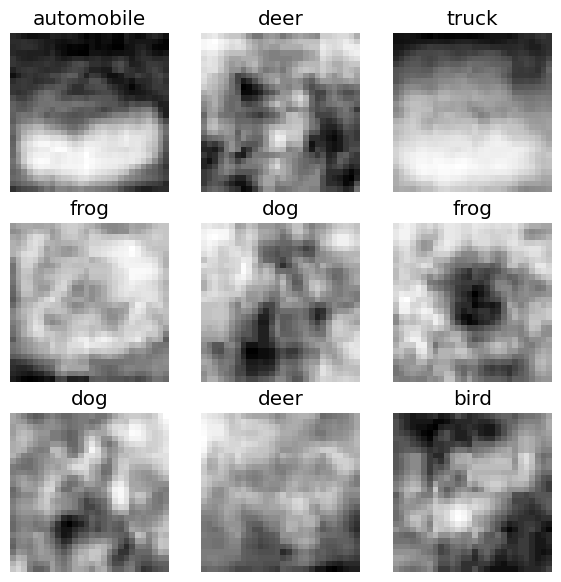

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 1020
Número total de imágenes en validación: 500

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


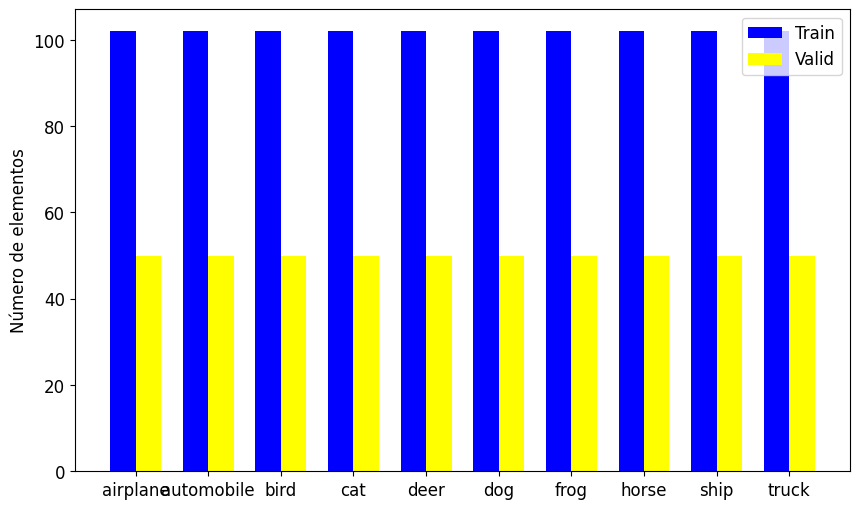

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.305020,2.304360,0.100000,0.100000,0.018182,00:02
1,2.304221,2.303849,0.100000,0.100000,0.018182,00:01
2,2.303959,2.302583,0.100000,0.100000,0.018282,00:02
3,2.302132,2.295976,0.126000,0.126000,0.065894,00:01
4,2.292336,2.247743,0.154000,0.154000,0.098343,00:02
5,2.242796,2.243270,0.172000,0.172000,0.104024,00:04
6,2.118374,2.743402,0.170000,0.170000,0.133255,00:01
7,1.950382,3.750006,0.168000,0.168000,0.124072,00:01
8,1.787588,4.587062,0.168000,0.168000,0.147700,00:01
9,1.638016,5.202056,0.164000,0.164000,0.145260,00:01


No improvement since epoch 5: early stopping

Tiempo de entrenamiento: 25.53 segundos


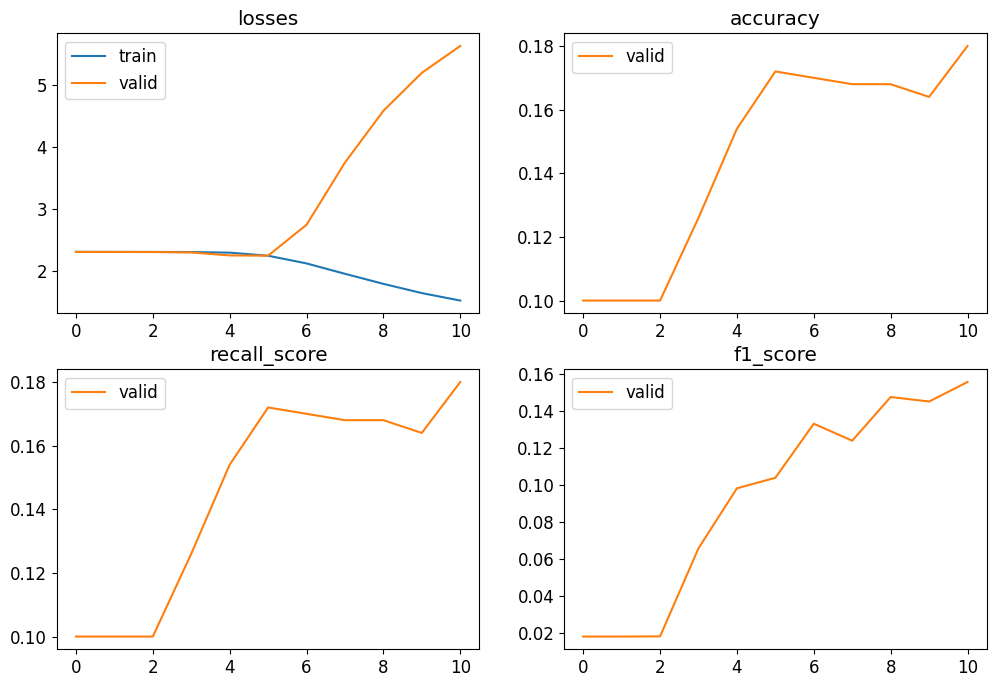

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 5.6363
Accuracy: 0.1800
Recall: 0.1800
F1-Score: 0.1558


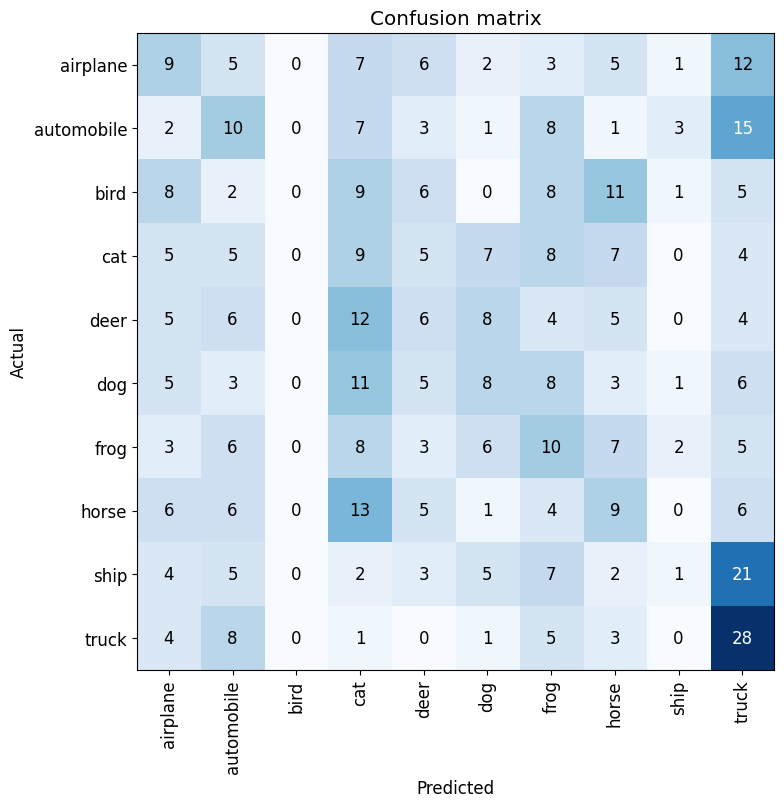

In [ ]:
#Creamos la interpretación de nuestro learner
interp = ClassificationInterpretation.from_learner(learn)

#Visualizamos la matriz de confusión
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_v2.pkl')

## Lenet 005

In [ ]:
dst = base_path / "distilled_005"

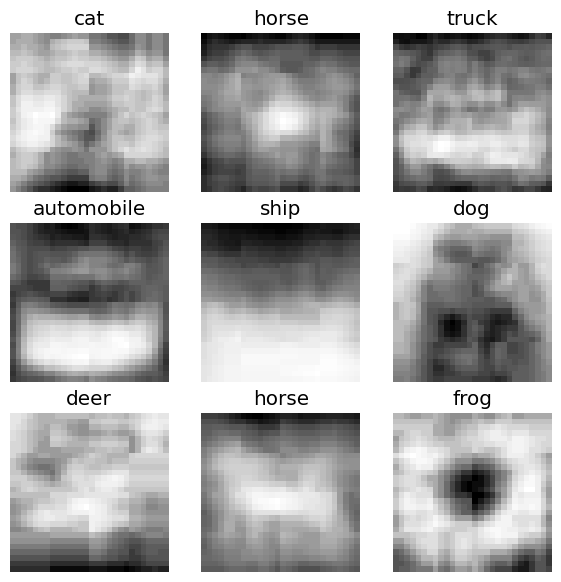

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 210
Número total de imágenes en validación: 250

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


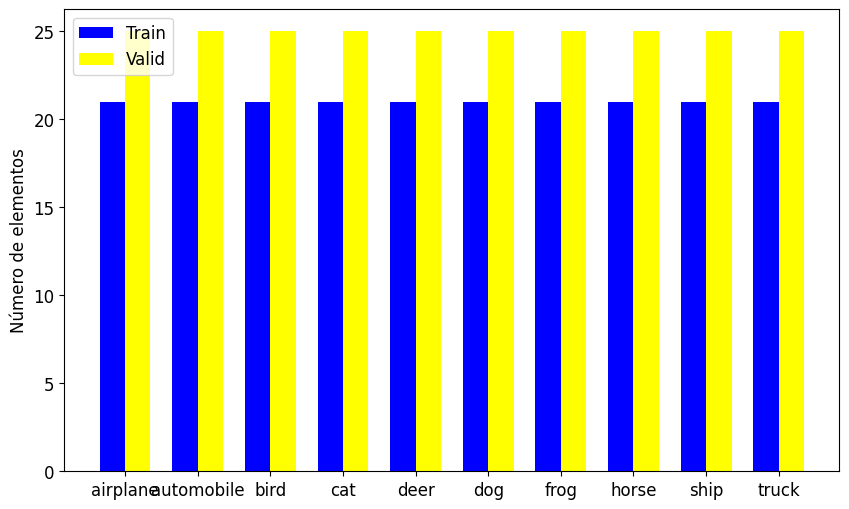

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(60)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.305502,2.305431,0.096000,0.096000,0.022896,00:00
1,2.306275,2.305301,0.100000,0.100000,0.023827,00:00
2,2.305685,2.305118,0.100000,0.100000,0.023927,00:01
3,2.305635,2.304877,0.100000,0.100000,0.023927,00:01
4,2.305376,2.304527,0.084000,0.084000,0.027138,00:00
5,2.304784,2.304136,0.088000,0.088000,0.028649,00:00
6,2.304552,2.303729,0.092000,0.092000,0.031579,00:00
7,2.304395,2.303232,0.088000,0.088000,0.028937,00:00
8,2.303924,2.302789,0.084000,0.084000,0.027866,00:00
9,2.303760,2.302083,0.076000,0.076000,0.025249,00:00


No improvement since epoch 19: early stopping

Tiempo de entrenamiento: 24.73 segundos


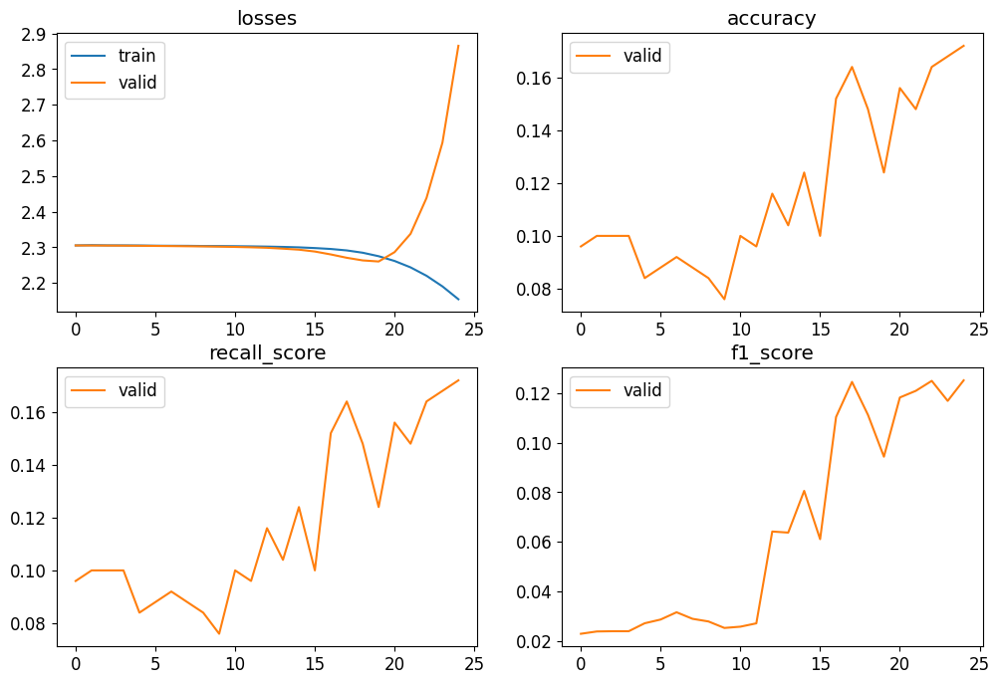

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.8655
Accuracy: 0.1720
Recall: 0.1720
F1-Score: 0.1252


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_v2.pkl')

## Lenet 0001

In [ ]:
dst = base_path / "distilled_0001"

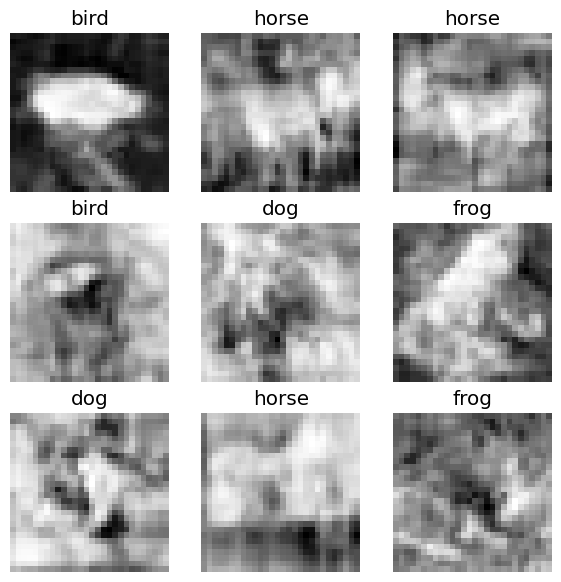

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 11250
Número total de imágenes en validación: 5000

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


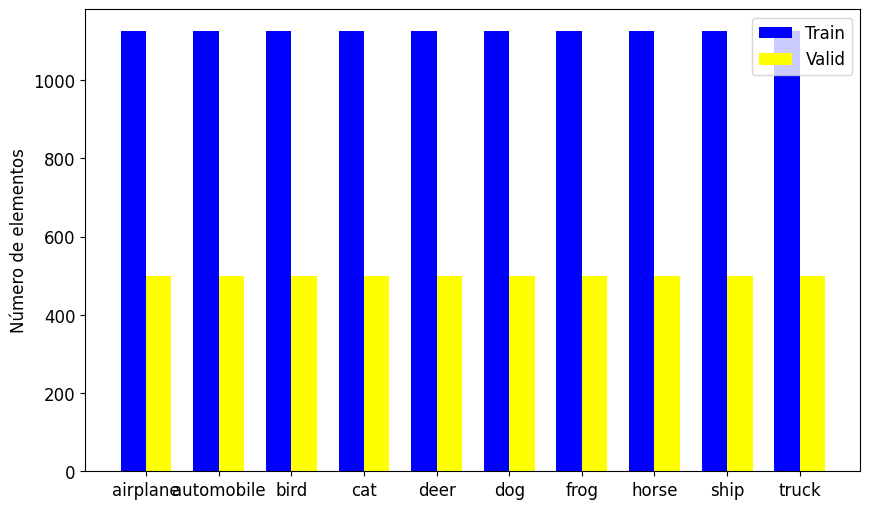

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.300752,2.298137,0.155400,0.155400,0.073188,00:24
1,2.134499,2.307617,0.172800,0.172800,0.128472,00:23
2,1.875996,2.488658,0.200200,0.200200,0.160496,00:27
3,1.750880,2.411346,0.235800,0.235800,0.216635,00:23
4,1.643452,2.505025,0.259200,0.259200,0.240985,00:25
5,1.579831,2.532586,0.275400,0.275400,0.258796,00:24


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 148.72 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.5326
Accuracy: 0.2754
Recall: 0.2754
F1-Score: 0.2588


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_v2.pkl')

## Resnet 001

In [ ]:
dst = base_path / "distilled_001"

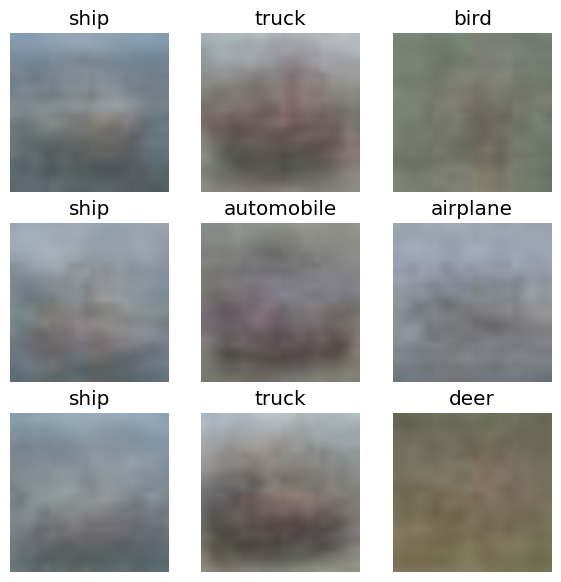

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.587402,3.039253,0.120000,0.120000,0.040682,00:05
1,0.963116,6.521501,0.102000,0.102000,0.039016,00:04
2,0.686808,6.535410,0.144000,0.144000,0.086448,00:05
3,0.537718,6.380910,0.198000,0.198000,0.180439,00:05
4,0.477266,6.053583,0.180000,0.180000,0.123169,00:05
5,0.413142,6.199115,0.174000,0.174000,0.154287,00:05


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 32.39 segundos


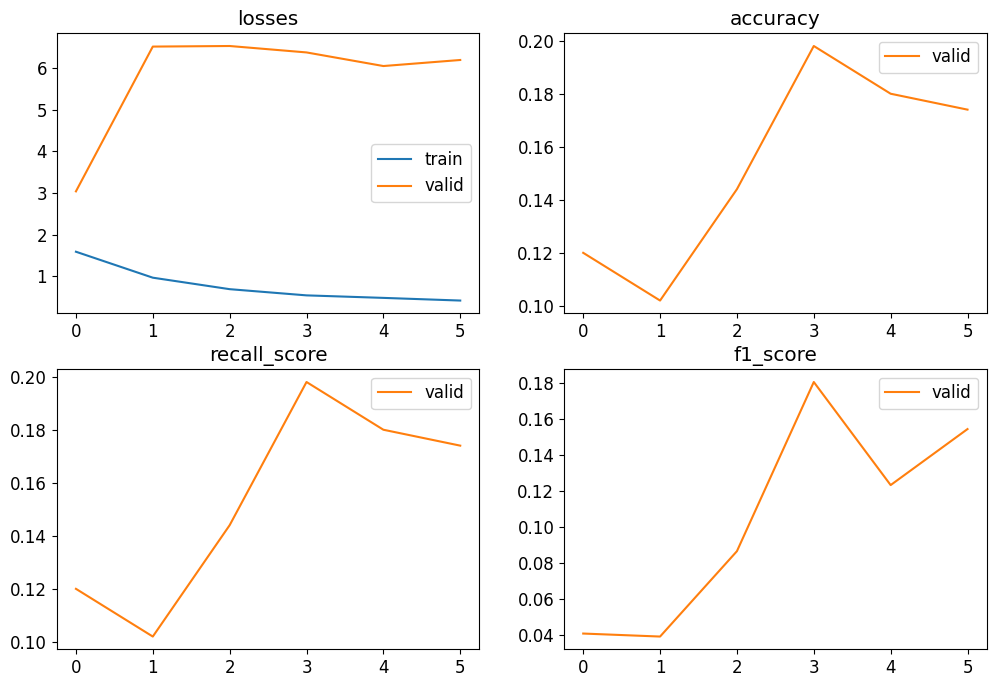

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 6.1991
Accuracy: 0.1740
Recall: 0.1740
F1-Score: 0.1543


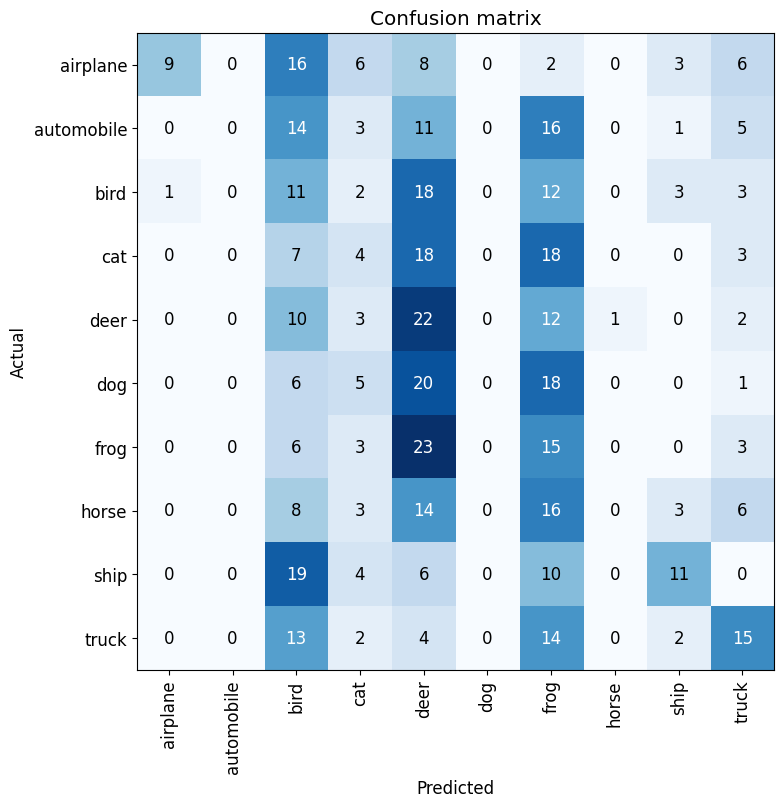

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_v2.pkl')

## Resnet18 005

In [ ]:
dst = base_path / "distilled_005"

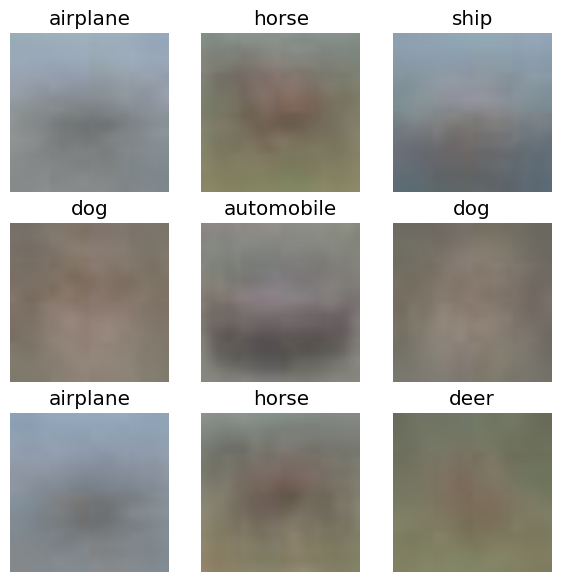

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,3.490304,2.466297,0.100000,0.100000,0.077094,00:02
1,2.235926,2.384385,0.100000,0.100000,0.087857,00:01
2,1.536672,2.541436,0.104000,0.104000,0.083559,00:01
3,1.165768,2.880755,0.120000,0.120000,0.094350,00:01
4,0.930627,3.503592,0.120000,0.120000,0.106282,00:01
5,0.787505,6.086048,0.108000,0.108000,0.074598,00:01
6,0.694958,6.657590,0.136000,0.136000,0.102183,00:01


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 13.13 segundos


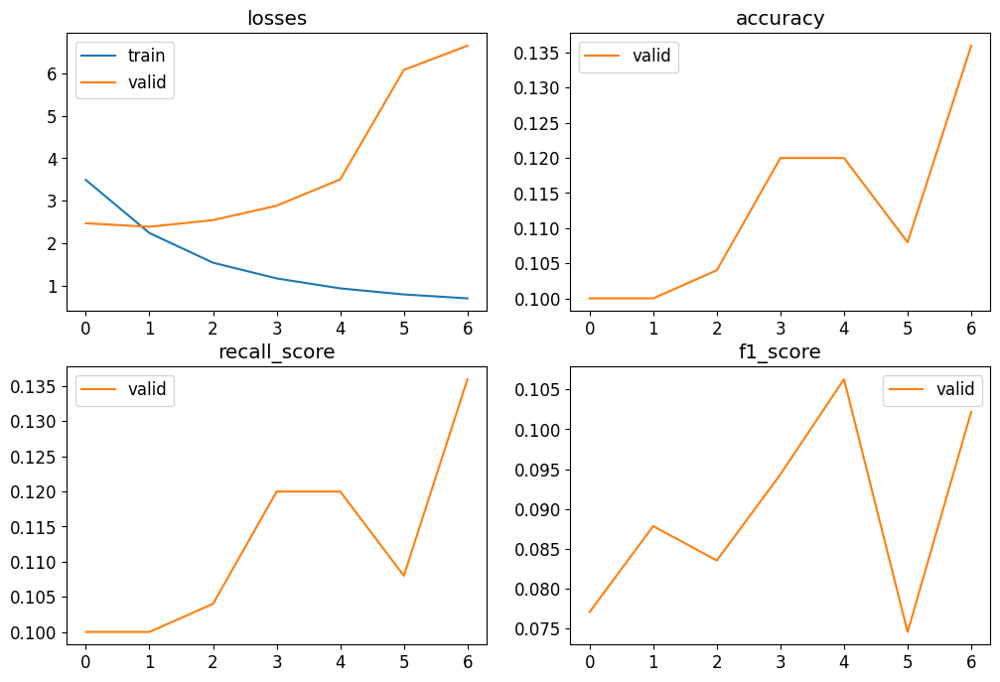

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 6.6576
Accuracy: 0.1360
Recall: 0.1360
F1-Score: 0.1022


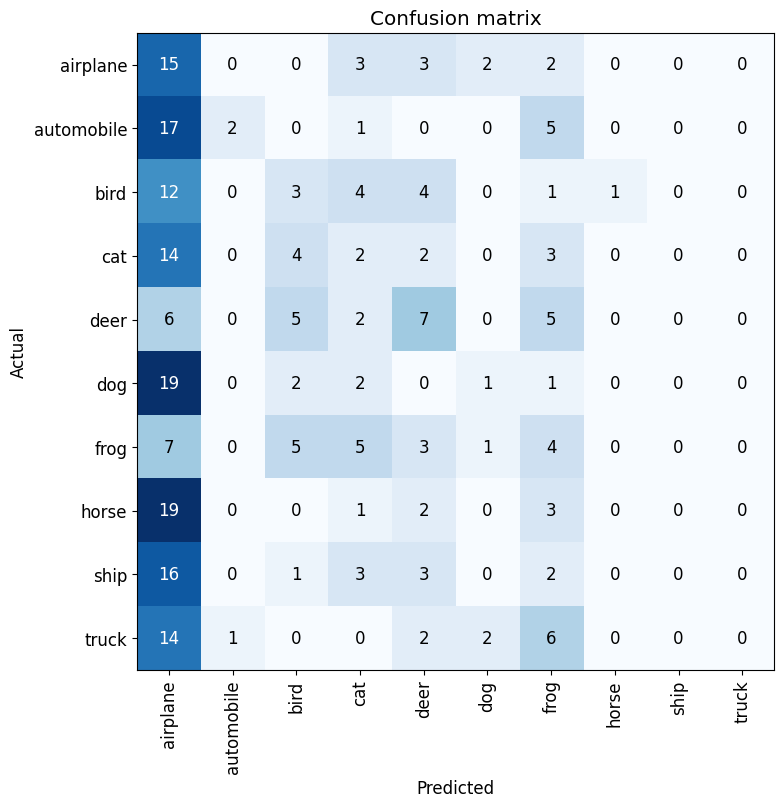

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_002_v3.pkl')

## Resnet 0001

In [ ]:
dst = base_path / "distilled_0001"

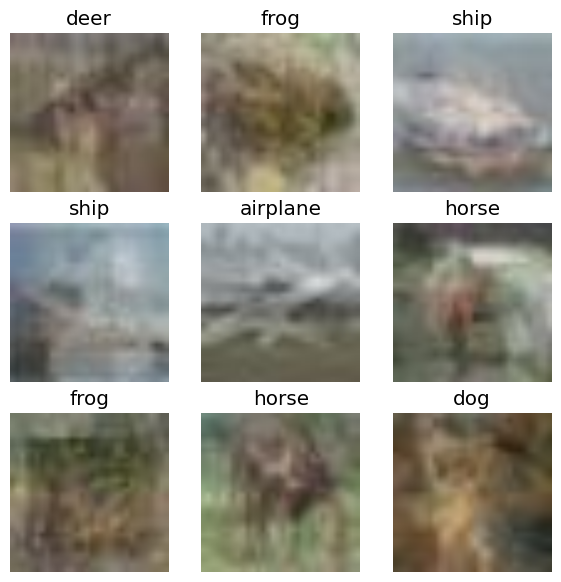

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.835517,8.645565,0.178600,0.178600,0.118370,00:58
1,1.459056,6.069077,0.197000,0.197000,0.136323,00:57
2,1.220028,7.579933,0.225400,0.225400,0.177130,00:52
3,1.057752,3.705557,0.326800,0.326800,0.278835,00:52
4,0.897193,6.198321,0.280000,0.280000,0.228475,00:51
5,0.736238,4.520234,0.367800,0.367800,0.317537,00:52
6,0.636660,3.212060,0.402800,0.402800,0.384816,00:52
7,0.508745,2.731492,0.491800,0.491800,0.476889,00:52
8,0.423582,5.882634,0.356000,0.356000,0.319777,00:51
9,0.341876,3.402784,0.488600,0.488600,0.454481,00:51


No improvement since epoch 7: early stopping

Tiempo de entrenamiento: 689.66 segundos


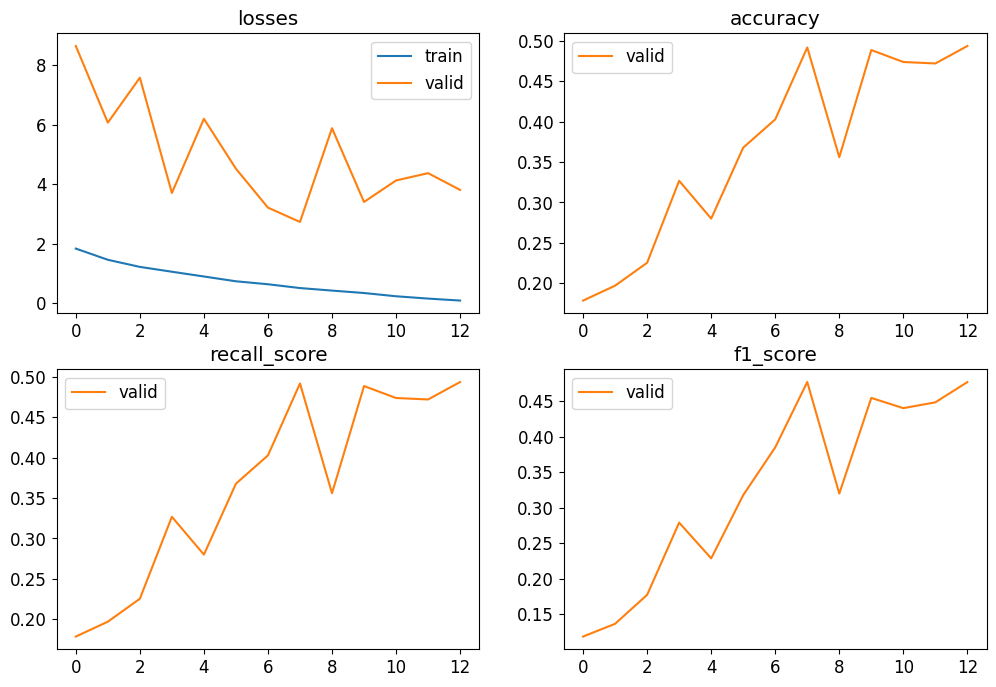

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.8081
Accuracy: 0.4936
Recall: 0.4936
F1-Score: 0.4768


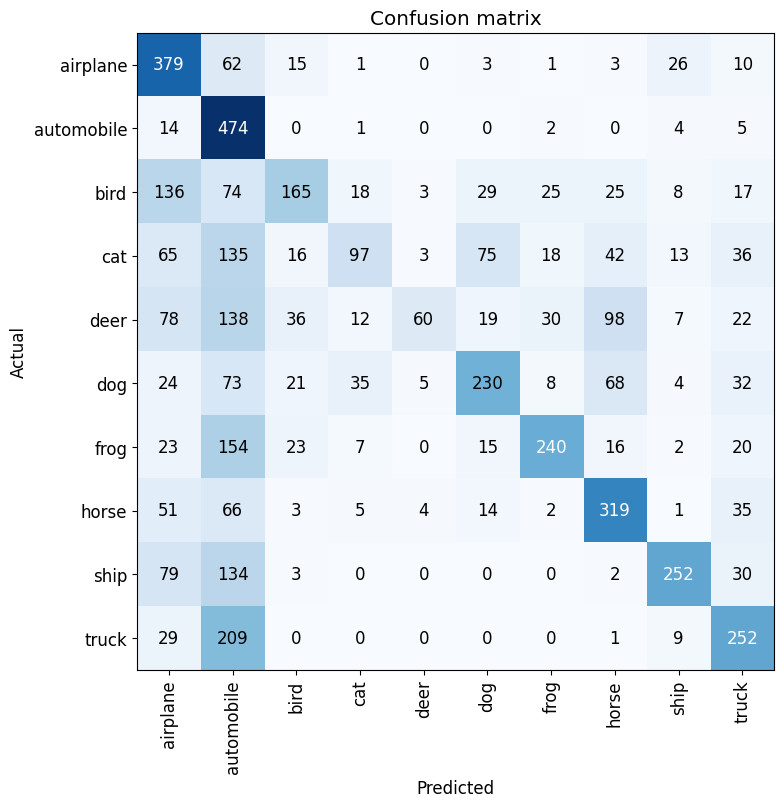

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_v2.pkl')

# Apartado 3

## Seleccion de examples

In [10]:
import random

def get_items_fraction(path, train_fraction=0.8):
    all_items = get_image_files(path)
    selected = []
    for item in all_items:
        if item.parts[-3].lower() == 'training':
            if random.random() < train_fraction:
                selected.append(item)
        else:
            selected.append(item)
    return selected

In [13]:
import random

def get_items_fraction2(path, train_fraction=0.8):
    all_items = get_image_files(path)
    selected = []
    for item in all_items:
        if item.parts[-3].lower() == 'train':
            if random.random() < train_fraction:
                selected.append(item)
        else:
            selected.append(item)
    return selected

## Base - Lenet

Example 1

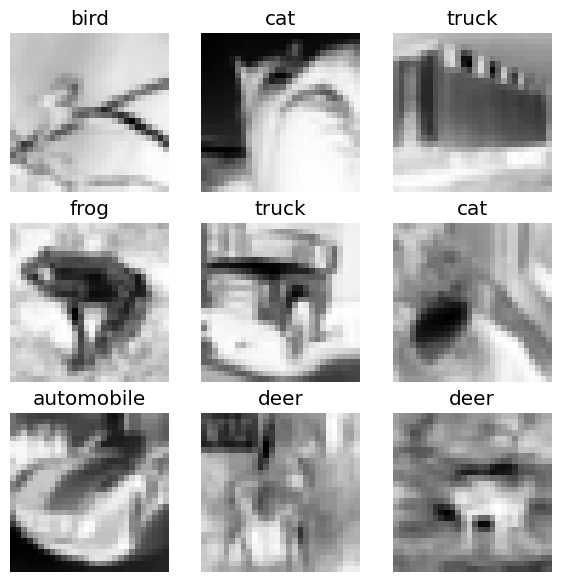

In [14]:
# Crear los DataLoaders
blocks = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction2(p, train_fraction=0.8),
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.2),
    item_tfms=Resize(28)
)

# Crear los DataLoaders
dls = blocks.dataloaders(original_path/'cifar10'/'train', bs=64)

# Mostrar una muestra de las imágenes para verificar la correcta organización
dls.show_batch(max_n=9, figsize=(7,7))


Número total de imágenes en entrenamiento: 32049
Número total de imágenes en validación: 8012

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


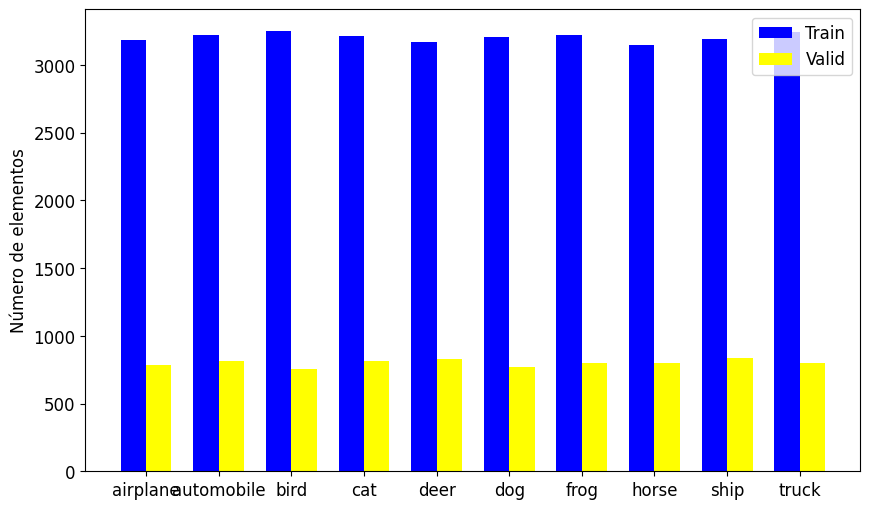

In [15]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.163507,2.128598,0.232917,0.232722,0.206307,01:56
1,1.908050,1.897580,0.314000,0.314914,0.289940,01:21
2,1.745340,1.713699,0.378167,0.377327,0.368867,01:09
3,1.651753,1.653032,0.400917,0.401062,0.393226,01:11
4,1.587778,1.637280,0.414750,0.415493,0.399072,01:09
5,1.527988,1.536265,0.459000,0.458977,0.457436,01:09
6,1.466749,1.453943,0.489833,0.487887,0.481532,01:09
7,1.388015,1.425012,0.501833,0.501214,0.502909,01:09
8,1.355676,1.386921,0.511250,0.510096,0.498536,01:09
9,1.311641,1.396515,0.513667,0.511904,0.498748,01:09



Tiempo de entrenamiento: 1444.66 segundos


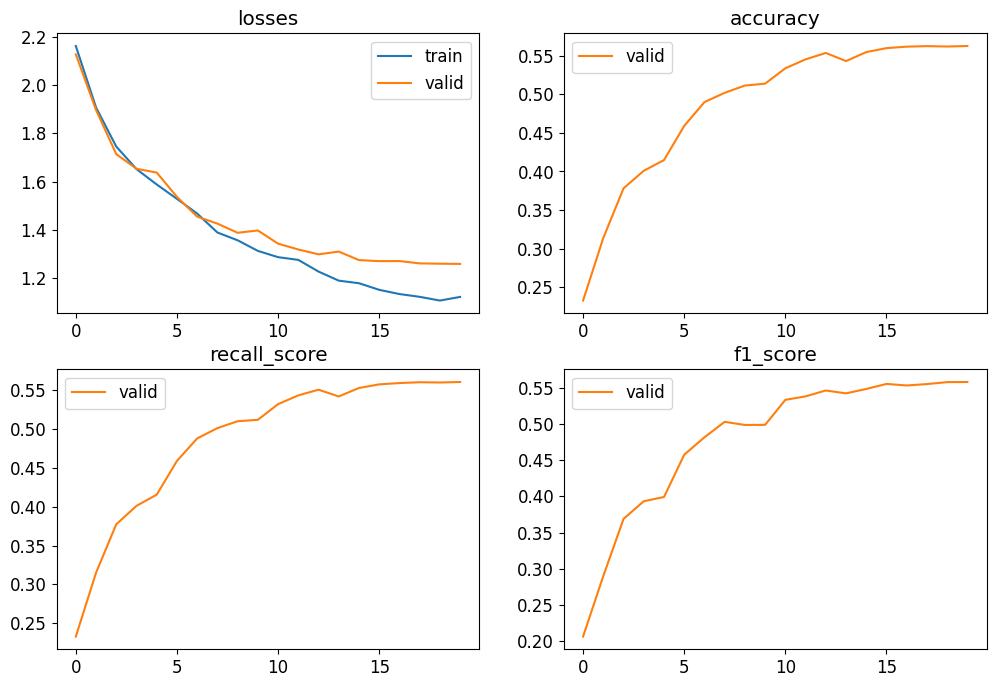

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 1.2575
Accuracy: 0.5624
Recall: 0.5606
F1-Score: 0.5579


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_5cluster01_v3.pkl')

## Lenet 001

In [ ]:
dst = base_path / "distilled_001"

Example 1

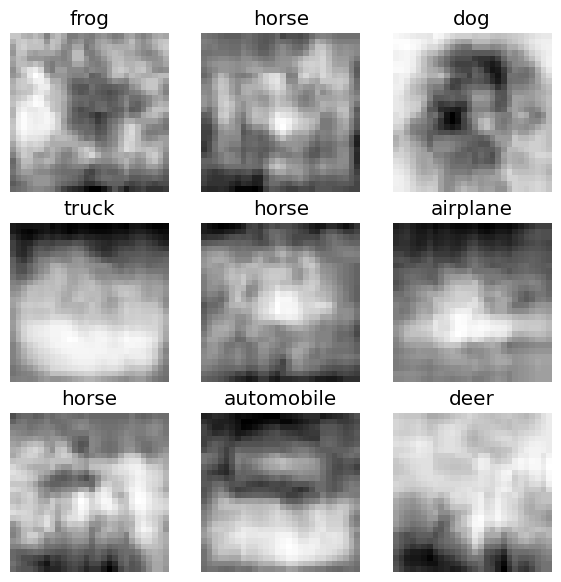

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 824
Número total de imágenes en validación: 500

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


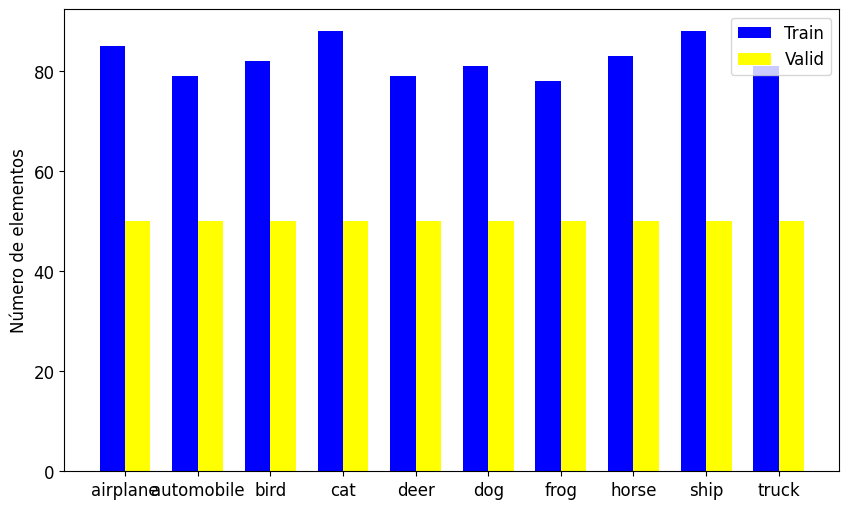

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(30)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.304244,2.303332,0.100000,0.100000,0.018182,00:05
1,2.304173,2.303069,0.100000,0.100000,0.018182,00:03
2,2.303696,2.302392,0.108000,0.108000,0.031346,00:01
3,2.303099,2.300888,0.126000,0.126000,0.048107,00:01
4,2.301642,2.296425,0.154000,0.154000,0.064001,00:04
5,2.297819,2.281160,0.176000,0.176000,0.107331,00:02
6,2.284476,2.225301,0.220000,0.220000,0.167674,00:01
7,2.229879,2.171999,0.184000,0.184000,0.142066,00:01
8,2.100199,2.523386,0.226000,0.226000,0.195366,00:01
9,1.923684,2.938142,0.238000,0.238000,0.212945,00:01


No improvement since epoch 7: early stopping

Tiempo de entrenamiento: 28.19 segundos


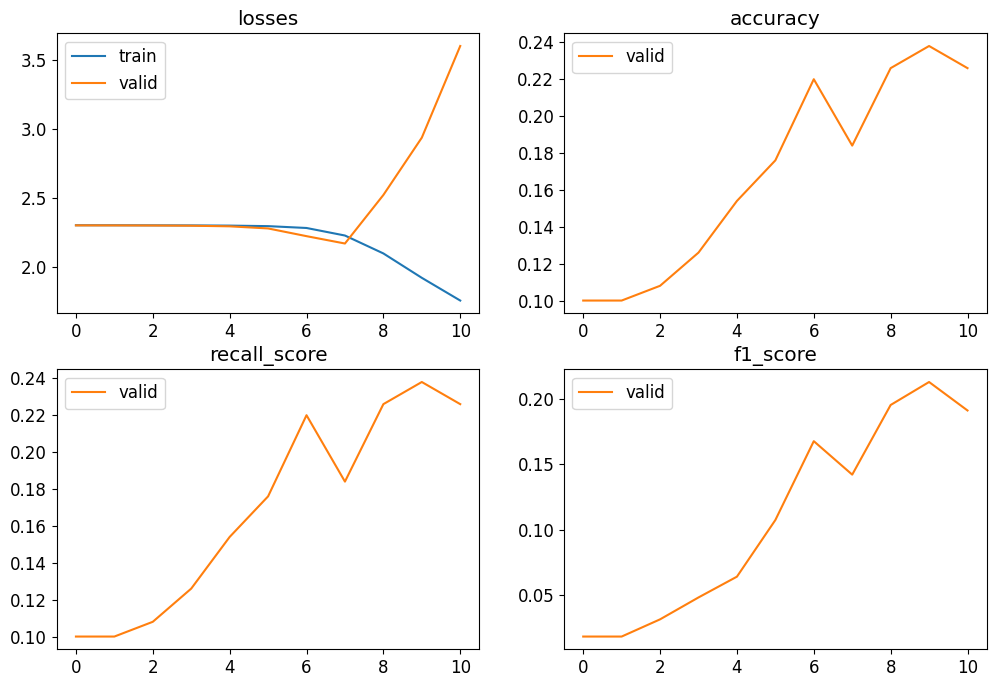

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.6016
Accuracy: 0.2260
Recall: 0.2260
F1-Score: 0.1912


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster01_v3.pkl')

Example 2

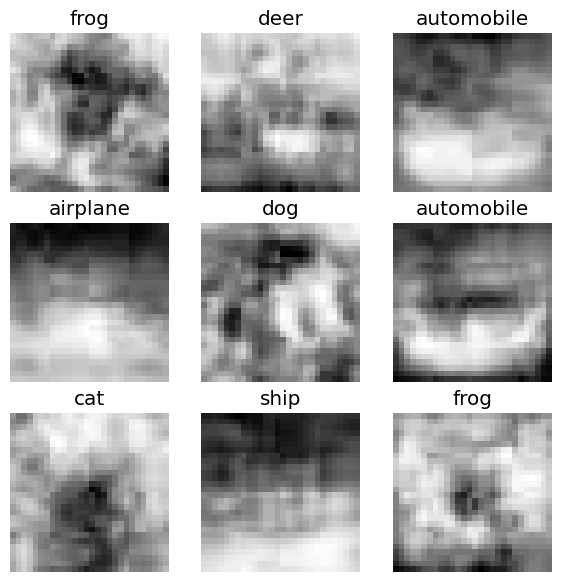

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.305866,2.304055,0.100000,0.100000,0.018182,00:02
1,2.304973,2.303337,0.100000,0.100000,0.018182,00:02
2,2.304295,2.301728,0.100000,0.100000,0.018182,00:02
3,2.302354,2.297122,0.126000,0.126000,0.055656,00:01
4,2.296871,2.284689,0.120000,0.120000,0.051168,00:02
5,2.281154,2.310715,0.146000,0.146000,0.075705,00:02
6,2.237100,2.333220,0.154000,0.154000,0.103363,00:02
7,2.135657,2.554404,0.196000,0.196000,0.151052,00:03


No improvement since epoch 4: early stopping

Tiempo de entrenamiento: 19.58 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.5544
Accuracy: 0.1960
Recall: 0.1960
F1-Score: 0.1511


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster02_v3.pkl')

Example 3

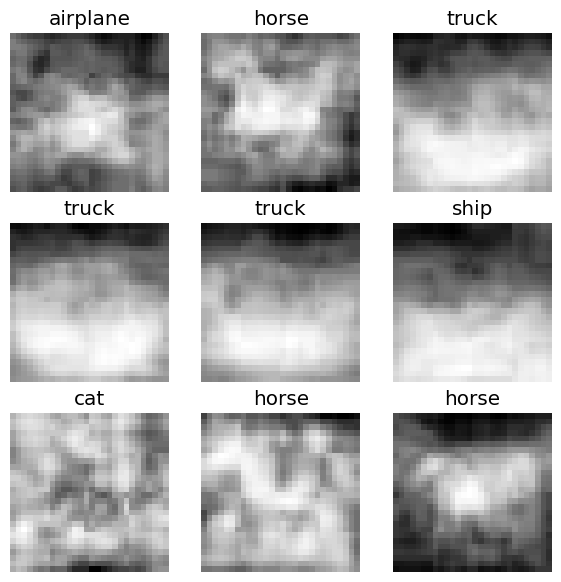

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.304284,2.304518,0.100000,0.100000,0.018182,00:01
1,2.303251,2.303116,0.100000,0.100000,0.018182,00:01
2,2.301916,2.301368,0.100000,0.100000,0.018182,00:02
3,2.300385,2.294203,0.112000,0.112000,0.037680,00:01
4,2.294680,2.269216,0.142000,0.142000,0.066546,00:02
5,2.274317,2.221423,0.166000,0.166000,0.102783,00:02
6,2.209610,2.435766,0.178000,0.178000,0.117665,00:01
7,2.095033,3.121814,0.176000,0.176000,0.127872,00:01
8,1.965757,3.915794,0.188000,0.188000,0.137022,00:02


No improvement since epoch 5: early stopping

Tiempo de entrenamiento: 18.36 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.9158
Accuracy: 0.1880
Recall: 0.1880
F1-Score: 0.1370


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster03_v3.pkl')

Example 4

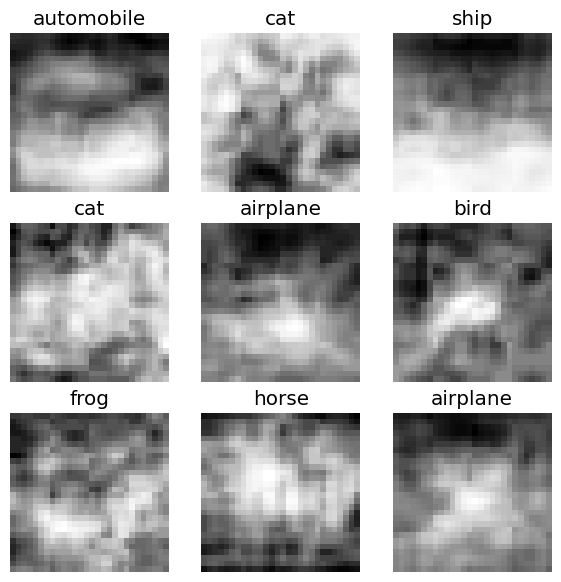

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.307037,2.304555,0.100000,0.100000,0.018182,00:01
1,2.306635,2.303595,0.100000,0.100000,0.018182,00:02
2,2.305623,2.301919,0.100000,0.100000,0.018182,00:02
3,2.304470,2.299338,0.134000,0.134000,0.046669,00:01
4,2.300798,2.285445,0.142000,0.142000,0.068195,00:01
5,2.290580,2.241587,0.190000,0.190000,0.121505,00:02
6,2.254363,2.220389,0.208000,0.208000,0.170608,00:03
7,2.161834,2.637331,0.214000,0.214000,0.154753,00:02
8,2.041514,3.112877,0.178000,0.178000,0.152533,00:03
9,1.918770,3.674475,0.168000,0.168000,0.151496,00:01


No improvement since epoch 6: early stopping

Tiempo de entrenamiento: 22.40 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.6745
Accuracy: 0.1680
Recall: 0.1680
F1-Score: 0.1515


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster04_v3.pkl')

Exammple 5

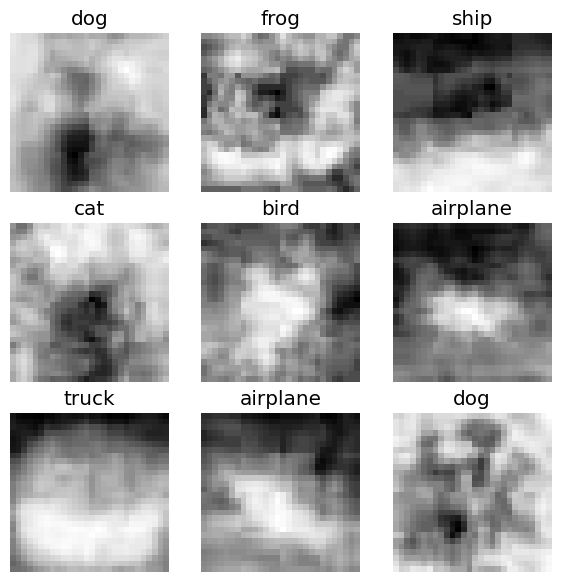

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.305094,2.304549,0.100000,0.100000,0.018382,00:01
1,2.304235,2.303429,0.100000,0.100000,0.018182,00:01
2,2.303107,2.301009,0.100000,0.100000,0.018182,00:02
3,2.300437,2.290944,0.116000,0.116000,0.036194,00:03
4,2.288884,2.274629,0.132000,0.132000,0.070939,00:04
5,2.244138,2.254237,0.194000,0.194000,0.145129,00:02
6,2.128472,2.613480,0.210000,0.210000,0.174412,00:02
7,1.977806,3.374206,0.190000,0.190000,0.165655,00:04
8,1.829770,3.919624,0.198000,0.198000,0.182473,00:02


No improvement since epoch 5: early stopping

Tiempo de entrenamiento: 25.33 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.9196
Accuracy: 0.1980
Recall: 0.1980
F1-Score: 0.1825


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster05_v3.pkl')

## Lenet 005

In [ ]:
dst = base_path / "distilled_005"

Example 1

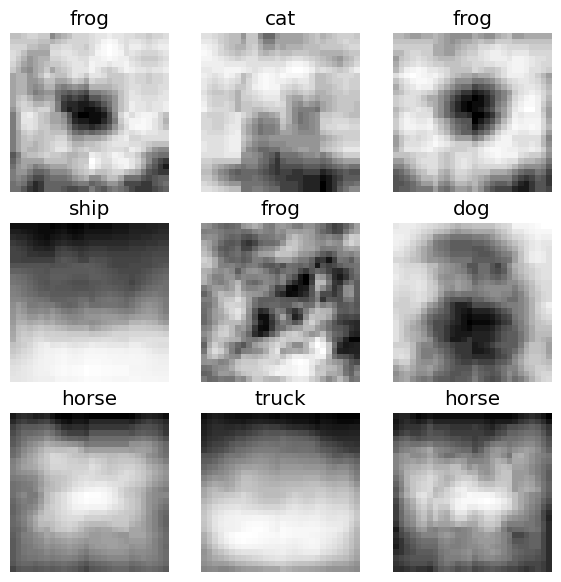

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 174
Número total de imágenes en validación: 250

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


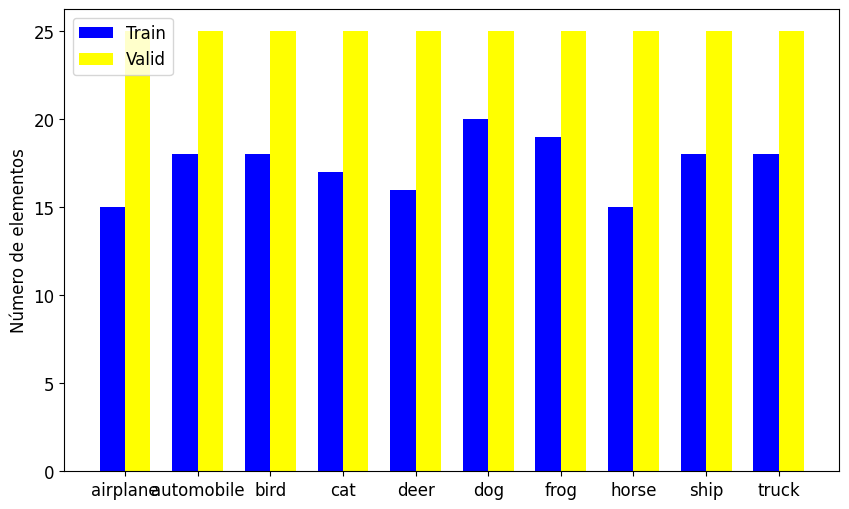

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.300468,2.304571,0.104000,0.104000,0.025790,00:00
1,2.301407,2.304512,0.100000,0.100000,0.018315,00:00
2,2.302501,2.304374,0.100000,0.100000,0.018182,00:00
3,2.302302,2.304201,0.100000,0.100000,0.018182,00:00
4,2.301769,2.304114,0.100000,0.100000,0.018182,00:00
5,2.301733,2.303962,0.100000,0.100000,0.018182,00:00
6,2.301522,2.303782,0.100000,0.100000,0.018182,00:00
7,2.301146,2.303535,0.100000,0.100000,0.018182,00:00
8,2.300971,2.303276,0.100000,0.100000,0.018182,00:00
9,2.300390,2.302997,0.100000,0.100000,0.018182,00:00



Tiempo de entrenamiento: 15.54 segundos


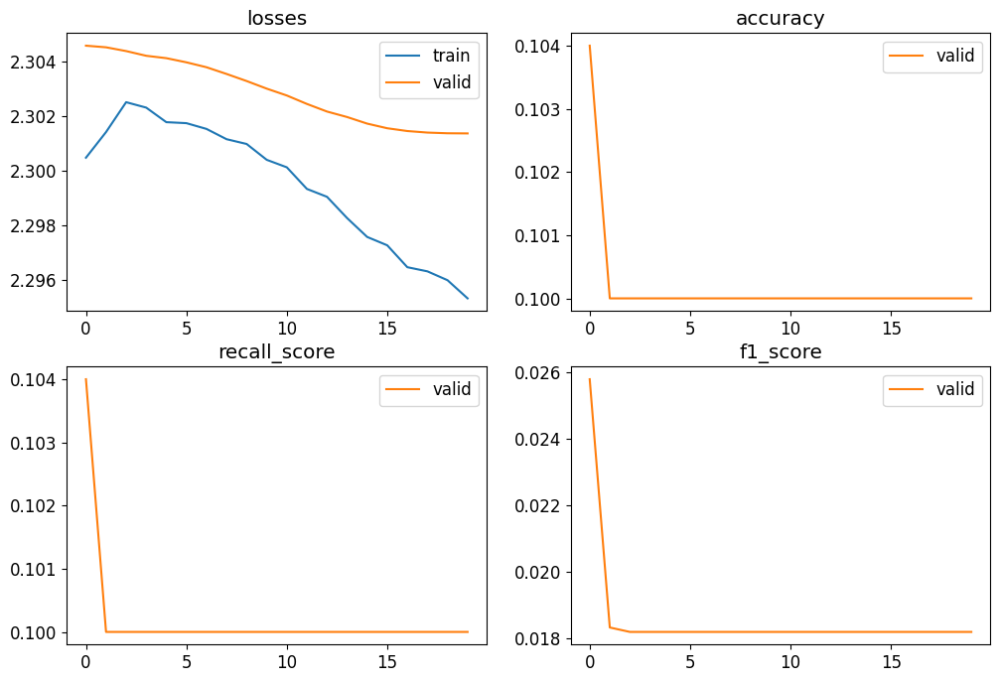

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3014
Accuracy: 0.1000
Recall: 0.1000
F1-Score: 0.0182


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster01_v3.pkl')

Example 2

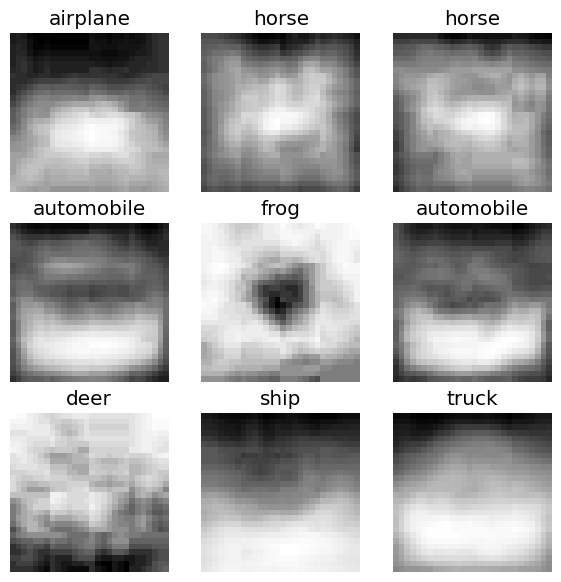

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.301139,2.304523,0.100000,0.100000,0.018182,00:01
1,2.303615,2.304420,0.100000,0.100000,0.018182,00:01
2,2.304494,2.304257,0.104000,0.104000,0.025722,00:00
3,2.303952,2.304025,0.104000,0.104000,0.025254,00:00
4,2.303770,2.303549,0.104000,0.104000,0.025039,00:00
5,2.302828,2.302870,0.104000,0.104000,0.024582,00:00
6,2.302653,2.302304,0.100000,0.100000,0.026171,00:00
7,2.302650,2.301651,0.104000,0.104000,0.025593,00:00
8,2.301529,2.300874,0.116000,0.116000,0.046825,00:00
9,2.300710,2.299886,0.120000,0.120000,0.041490,00:00



Tiempo de entrenamiento: 16.32 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.2933
Accuracy: 0.1080
Recall: 0.1080
F1-Score: 0.0369


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster02_v3.pkl')

Example 3

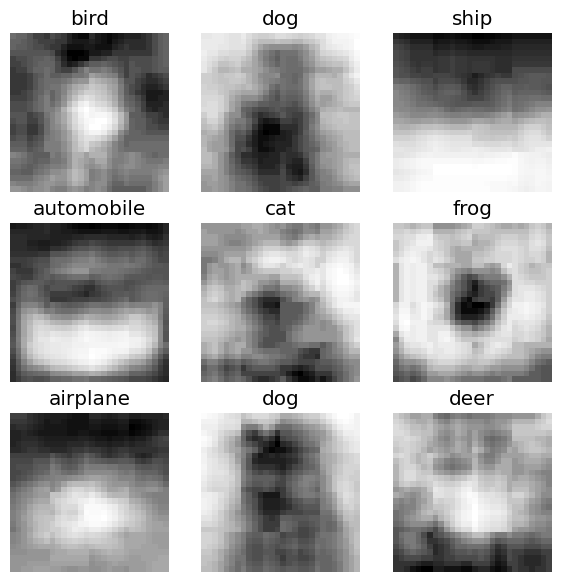

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.305244,2.305398,0.100000,0.100000,0.018182,00:00
1,2.304540,2.305328,0.100000,0.100000,0.018182,00:00
2,2.305446,2.305140,0.100000,0.100000,0.018182,00:00
3,2.302730,2.305027,0.100000,0.100000,0.018182,00:00
4,2.302701,2.304806,0.104000,0.104000,0.032675,00:01
5,2.302426,2.304456,0.132000,0.132000,0.043834,00:01
6,2.302079,2.304303,0.096000,0.096000,0.018182,00:01
7,2.302772,2.303811,0.100000,0.100000,0.018382,00:01
8,2.302324,2.303320,0.100000,0.100000,0.023462,00:01
9,2.302462,2.302743,0.104000,0.104000,0.027841,00:01



Tiempo de entrenamiento: 19.51 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.2996
Accuracy: 0.1360
Recall: 0.1360
F1-Score: 0.0627


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster03_v3.pkl')

Example 4

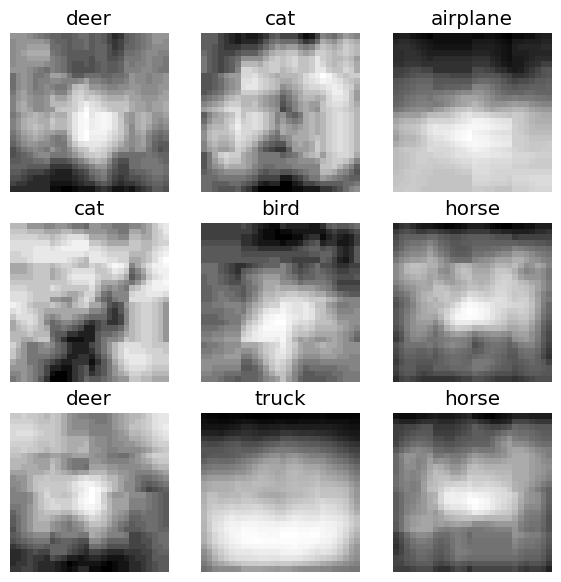

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.307423,2.303838,0.116000,0.116000,0.046316,00:01
1,2.304702,2.303701,0.108000,0.108000,0.033533,00:01
2,2.305438,2.303454,0.100000,0.100000,0.027342,00:01
3,2.306042,2.302997,0.116000,0.116000,0.048607,00:01
4,2.305272,2.302542,0.108000,0.108000,0.036426,00:01
5,2.304869,2.301996,0.108000,0.108000,0.037814,00:01
6,2.304408,2.301765,0.124000,0.124000,0.068327,00:01
7,2.304114,2.301270,0.096000,0.096000,0.037995,00:01
8,2.303523,2.300823,0.092000,0.092000,0.017037,00:01
9,2.302926,2.300570,0.096000,0.096000,0.031738,00:01


No improvement since epoch 10: early stopping

Tiempo de entrenamiento: 24.68 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3016
Accuracy: 0.1440
Recall: 0.1440
F1-Score: 0.0513


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster04_v3.pkl')

Example 5

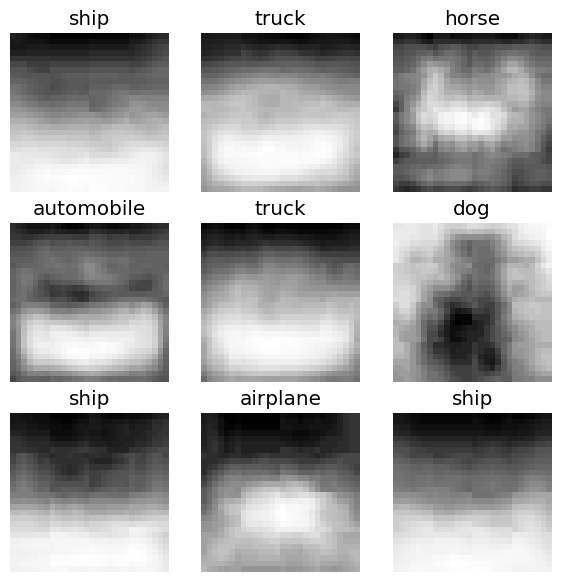

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.307605,2.304931,0.100000,0.100000,0.018182,00:02
1,2.309760,2.304802,0.100000,0.100000,0.018182,00:02
2,2.310886,2.304565,0.100000,0.100000,0.018182,00:01
3,2.310331,2.304273,0.104000,0.104000,0.034060,00:01
4,2.309701,2.303681,0.108000,0.108000,0.031157,00:01
5,2.309691,2.303222,0.100000,0.100000,0.018182,00:01
6,2.308778,2.302735,0.100000,0.100000,0.018182,00:01
7,2.307819,2.302408,0.100000,0.100000,0.018182,00:01
8,2.307629,2.302010,0.100000,0.100000,0.018182,00:01
9,2.307208,2.301738,0.100000,0.100000,0.018182,00:02



Tiempo de entrenamiento: 37.84 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.2990
Accuracy: 0.1000
Recall: 0.1000
F1-Score: 0.0182


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster05_v3.pkl')

## Lenet 0001

In [ ]:
dst = base_path / "distilled_0001"

Example 1

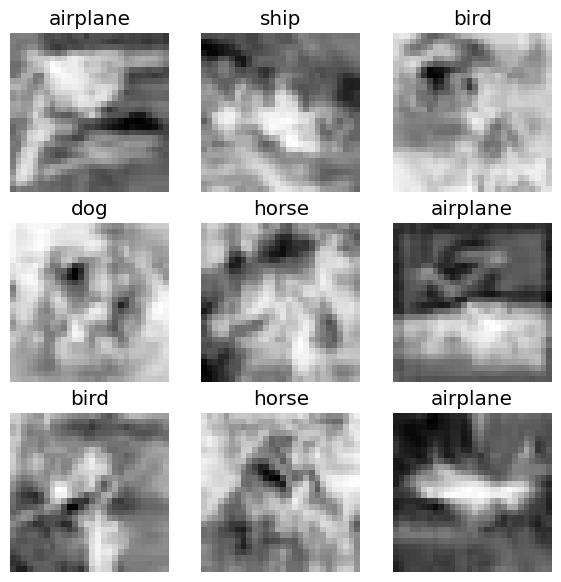

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 8974
Número total de imágenes en validación: 5000

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


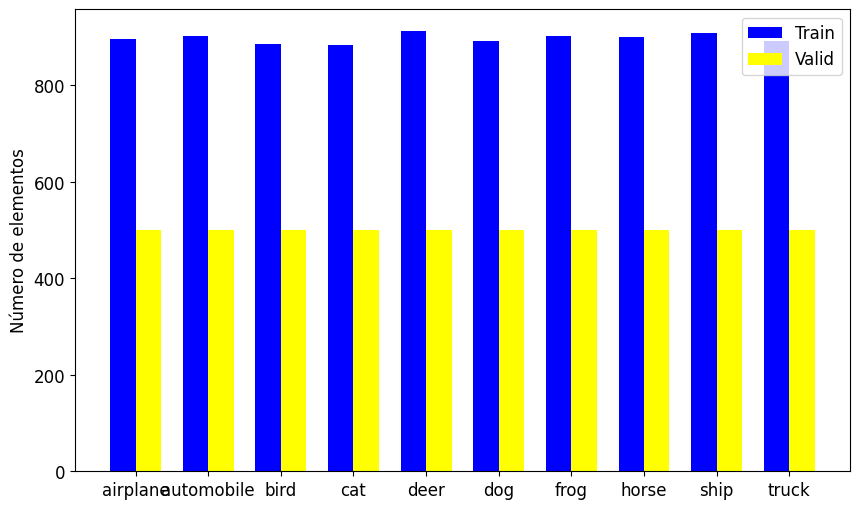

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303362,2.302684,0.107400,0.107400,0.038421,00:23
1,2.294396,2.285023,0.172400,0.172400,0.107446,00:22
2,2.115765,2.211735,0.201600,0.201600,0.168083,00:17
3,1.859620,2.397115,0.221800,0.221800,0.195895,00:16
4,1.761324,2.416301,0.237800,0.237800,0.218801,00:16
5,1.724853,2.423299,0.240200,0.240200,0.213581,00:16
6,1.671949,2.357157,0.256000,0.256000,0.233710,00:17
7,1.605169,2.362514,0.274000,0.274000,0.252372,00:17


No improvement since epoch 2: early stopping

Tiempo de entrenamiento: 146.68 segundos


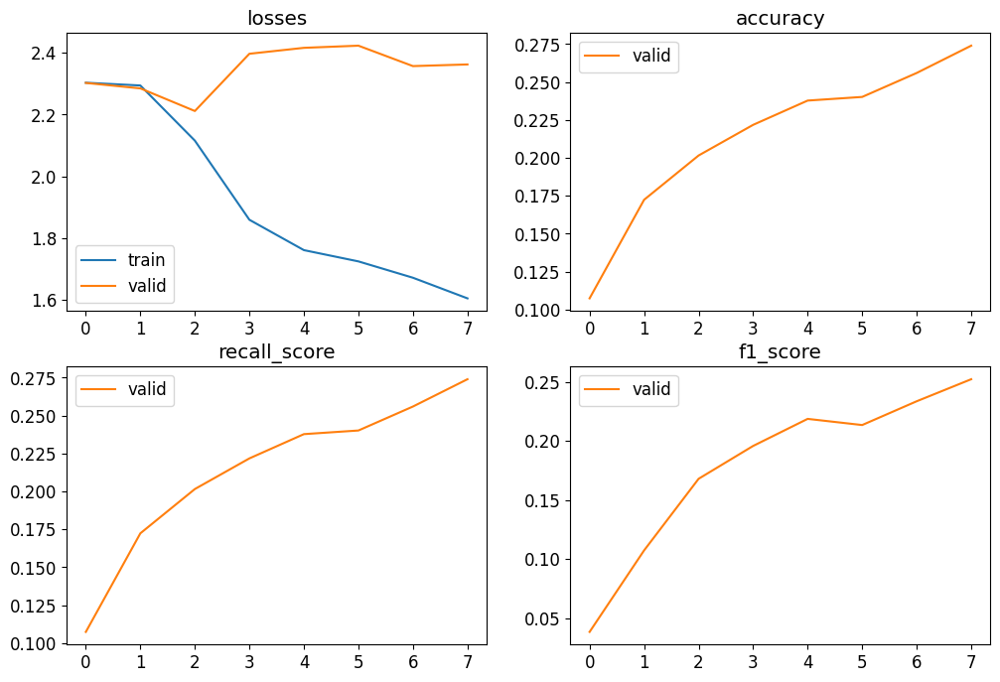

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3625
Accuracy: 0.2740
Recall: 0.2740
F1-Score: 0.2524


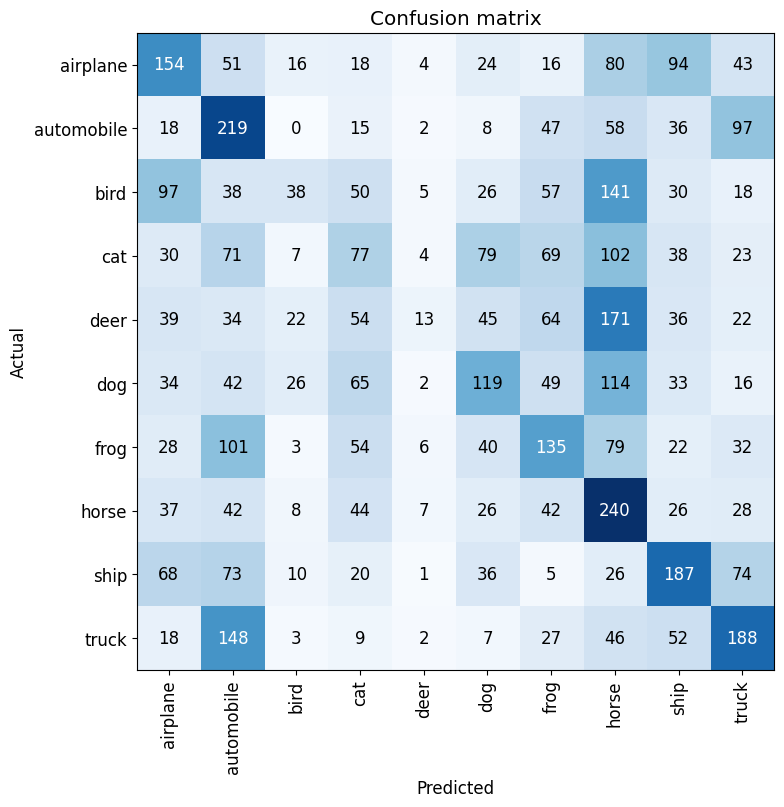

In [ ]:
#Creamos la interpretación de nuestro learner
interp = ClassificationInterpretation.from_learner(learn)

#Visualizamos la matriz de confusión
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster01_v3.pkl')

Examle 2

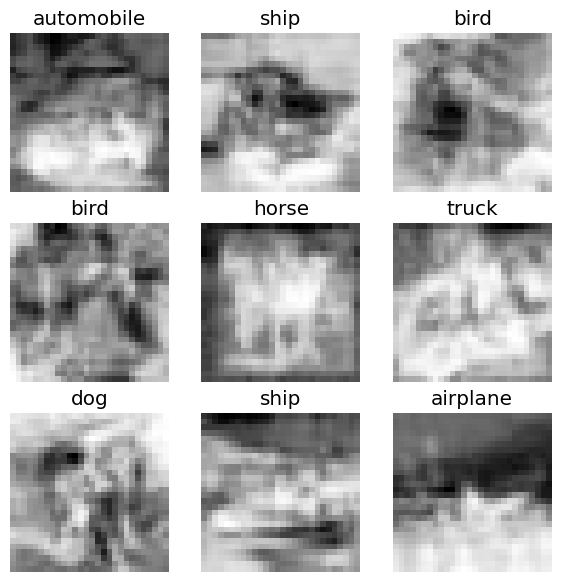

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303382,2.303189,0.100400,0.100400,0.018989,00:20
1,2.301704,2.301786,0.101000,0.101000,0.020170,00:19
2,2.294018,2.287355,0.146600,0.146600,0.074671,00:16
3,2.093213,2.236410,0.176600,0.176600,0.131640,00:16
4,1.887973,2.418375,0.197400,0.197400,0.158093,00:17
5,1.806311,2.434038,0.222400,0.222400,0.192792,00:16
6,1.740984,2.352083,0.245600,0.245600,0.225164,00:16
7,1.692306,2.483746,0.248000,0.248000,0.208991,00:16
8,1.650920,2.617571,0.252600,0.252600,0.225405,00:16


No improvement since epoch 3: early stopping

Tiempo de entrenamiento: 155.57 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.6176
Accuracy: 0.2526
Recall: 0.2526
F1-Score: 0.2254


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster02_v3.pkl')

Example 3

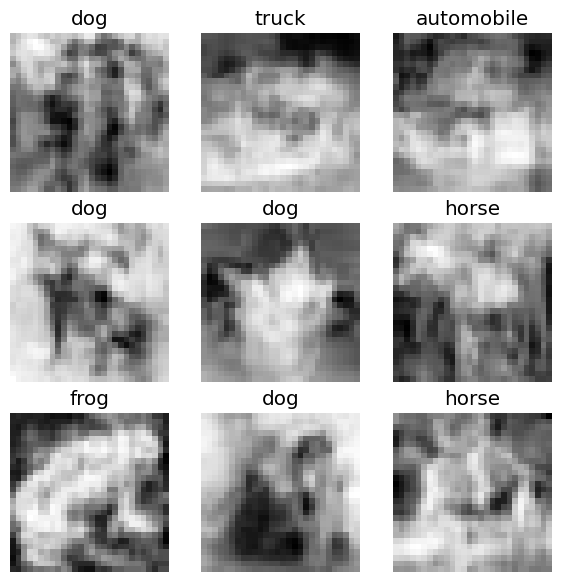

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.302577,2.301406,0.100000,0.100000,0.018182,00:16
1,2.286713,2.271472,0.162400,0.162400,0.079570,00:16
2,2.039191,2.291118,0.194400,0.194400,0.154519,00:24
3,1.795808,2.475015,0.219800,0.219800,0.192321,00:22
4,1.705803,2.509353,0.244200,0.244200,0.208599,00:25
5,1.679738,2.420446,0.249000,0.249000,0.226370,00:23
6,1.640137,2.440039,0.261800,0.261800,0.239906,00:17


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 145.46 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4400
Accuracy: 0.2618
Recall: 0.2618
F1-Score: 0.2399


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster03_v3.pkl')

Example 4

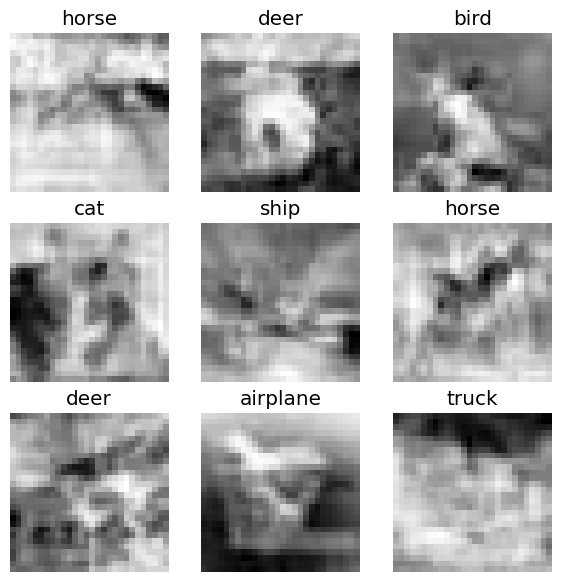

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.302955,2.302404,0.100000,0.100000,0.018185,00:21
1,2.293524,2.287227,0.168000,0.168000,0.111356,00:22
2,2.135711,2.249747,0.200800,0.200800,0.154443,00:20
3,1.924859,2.417871,0.207200,0.207200,0.188418,00:24
4,1.842585,2.453164,0.217000,0.217000,0.188101,00:21
5,1.760528,2.440546,0.234800,0.234800,0.213431,00:22
6,1.723736,2.486710,0.241800,0.241800,0.215055,00:27
7,1.674594,2.432617,0.252200,0.252200,0.231855,00:22


No improvement since epoch 2: early stopping

Tiempo de entrenamiento: 184.38 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4326
Accuracy: 0.2522
Recall: 0.2522
F1-Score: 0.2319


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster04_v3.pkl')

Example 5

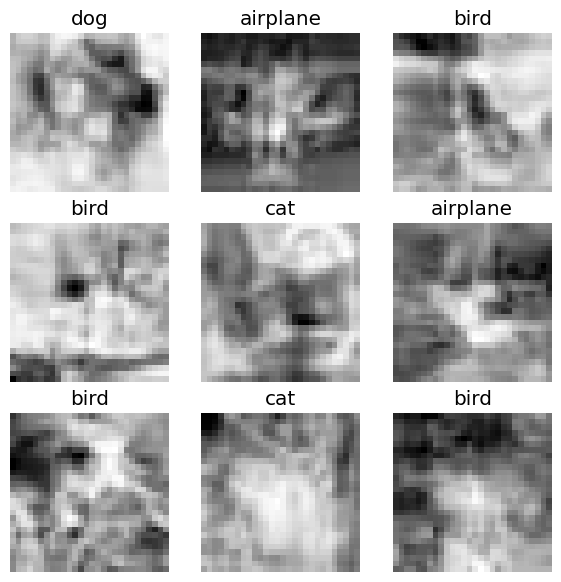

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303785,2.302671,0.108000,0.108000,0.030162,00:25
1,2.297288,2.291377,0.149800,0.149800,0.051924,00:16
2,2.160547,2.135864,0.202000,0.202000,0.166805,00:25
3,1.793822,2.371958,0.240200,0.240200,0.220753,00:22
4,1.696224,2.606997,0.243800,0.243800,0.217928,00:27
5,1.655936,2.613051,0.247400,0.247400,0.213563,00:28
6,1.601045,2.694934,0.250000,0.250000,0.217278,00:21
7,1.545083,2.490652,0.277000,0.277000,0.247954,00:21


No improvement since epoch 2: early stopping

Tiempo de entrenamiento: 189.38 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4907
Accuracy: 0.2770
Recall: 0.2770
F1-Score: 0.2480


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster05_v3.pkl')

## Base - Resnet

Example 1

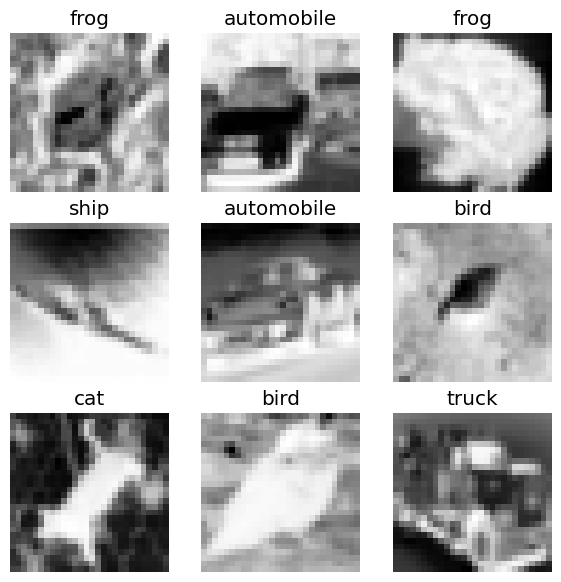

In [16]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction2(p, train_fraction=0.8),
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = blocks.dataloaders(original_path/'cifar10'/'train', bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [17]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 31954
Número total de imágenes en validación: 7988

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.029171,1.663229,0.425500,0.426943,0.416167,03:18
1,1.501225,1.262409,0.554333,0.555009,0.550195,03:19
2,1.035182,1.021055,0.638000,0.638427,0.632351,03:18
3,0.771554,0.819978,0.716833,0.717381,0.722380,03:19
4,0.630550,0.687733,0.763583,0.763863,0.765893,03:19
5,0.508110,0.548902,0.812000,0.812779,0.811294,03:20
6,0.429188,0.455321,0.845500,0.845659,0.845061,03:18
7,0.334930,0.461882,0.846250,0.846788,0.848039,03:19
8,0.265510,0.443555,0.856333,0.856580,0.856862,03:18
9,0.171049,0.448891,0.863333,0.863752,0.863858,03:18


No improvement since epoch 8: early stopping

Tiempo de entrenamiento: 2389.45 segundos


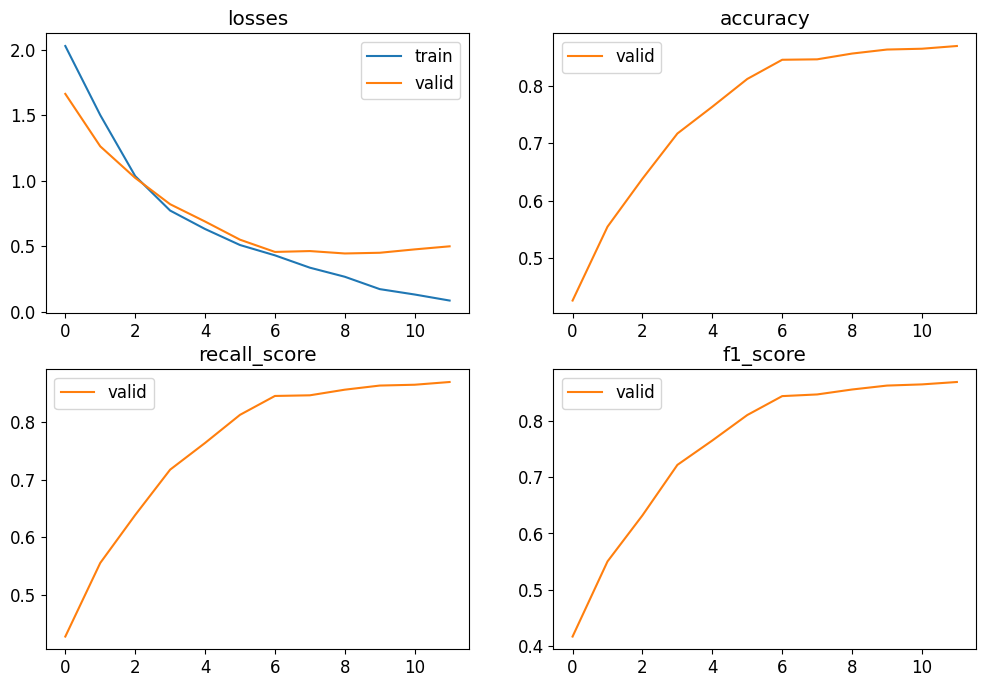

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 0.4982
Accuracy: 0.8695
Recall: 0.8699
F1-Score: 0.8702


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_5cluster01_v3.pkl')

## Resnet 001

In [ ]:
dst = base_path / "distilled_001"

Example 1

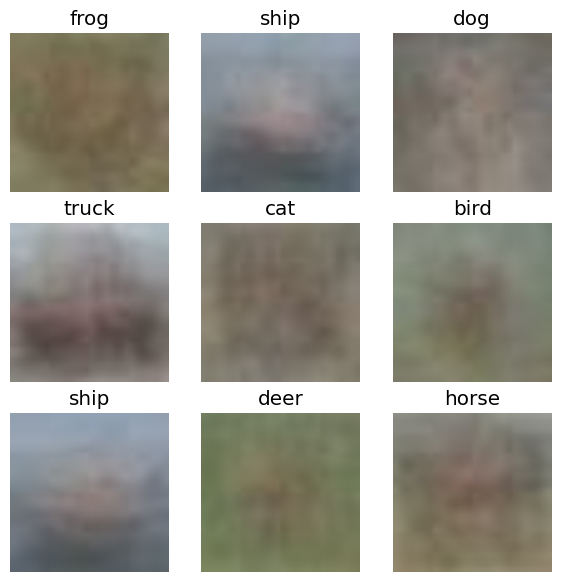

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 808
Número total de imágenes en validación: 500

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.816000,2.817504,0.114000,0.114000,0.036932,00:04
1,1.103539,7.427932,0.102000,0.102000,0.021852,00:05
2,0.767786,11.212836,0.106000,0.106000,0.034999,00:04
3,0.617329,7.189963,0.118000,0.118000,0.061535,00:04
4,0.513198,6.643893,0.128000,0.128000,0.081053,00:04
5,0.453313,6.212181,0.188000,0.188000,0.136397,00:04


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 28.16 segundos


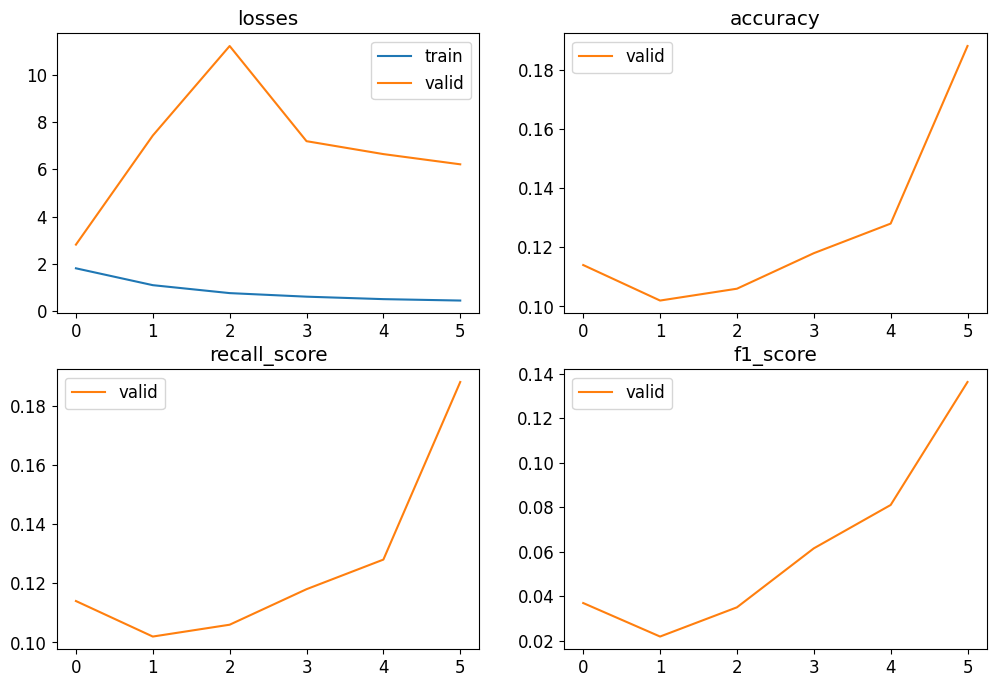

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 6.2122
Accuracy: 0.1880
Recall: 0.1880
F1-Score: 0.1364


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_5cluster01_v3.pkl')

Example 2

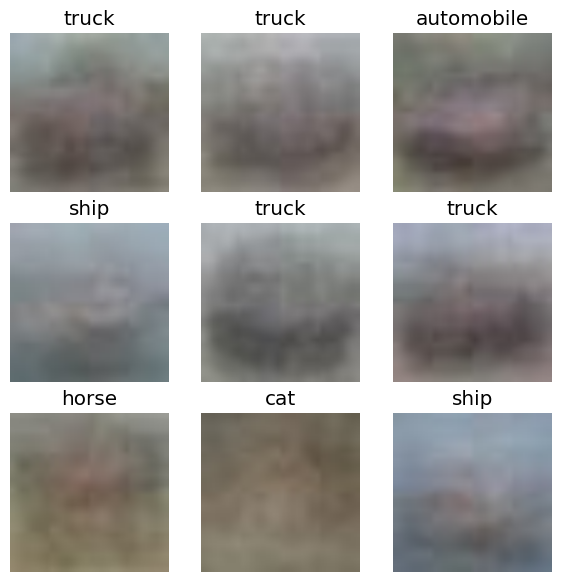

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.641866,3.413963,0.100000,0.100000,0.018182,00:04
1,0.925763,6.022150,0.100000,0.100000,0.043049,00:04
2,0.653510,8.928604,0.114000,0.114000,0.052038,00:04
3,0.526048,5.646728,0.162000,0.162000,0.124185,00:04
4,0.436006,7.144506,0.172000,0.172000,0.142670,00:04
5,0.387610,7.473207,0.168000,0.168000,0.111240,00:04


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 27.55 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 7.4732
Accuracy: 0.1680
Recall: 0.1680
F1-Score: 0.1112


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_5cluster02_v3.pkl')

Example 3

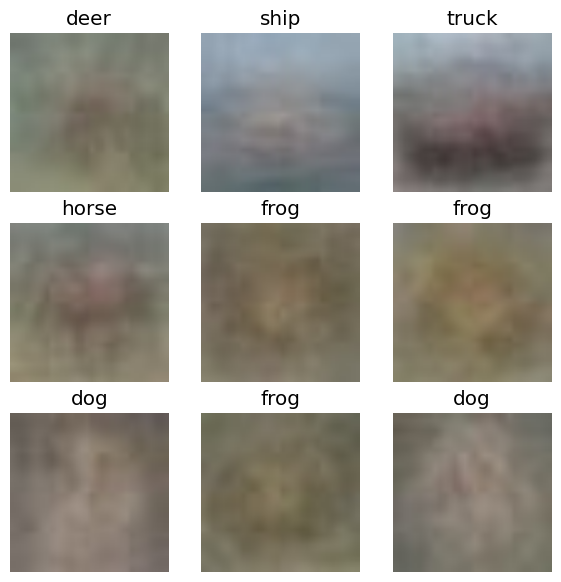

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.737211,3.723892,0.100000,0.100000,0.018182,00:04
1,1.016598,6.724119,0.110000,0.110000,0.048372,00:04
2,0.716550,11.282595,0.102000,0.102000,0.032639,00:04
3,0.584939,9.356390,0.120000,0.120000,0.060893,00:04
4,0.508565,5.655837,0.178000,0.178000,0.124392,00:04
5,0.433238,8.031651,0.136000,0.136000,0.078901,00:04


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 26.69 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 8.0317
Accuracy: 0.1360
Recall: 0.1360
F1-Score: 0.0789


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_5cluster03_v3.pkl')

## Resnet 005

In [ ]:
dst = base_path / "distilled_005"

Example 1

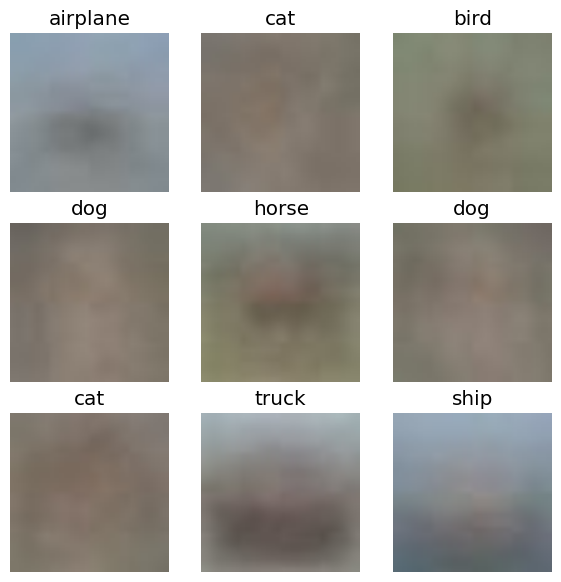

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 161
Número total de imágenes en validación: 250

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,3.689333,2.328828,0.104000,0.104000,0.026142,00:02
1,2.262444,2.467974,0.104000,0.104000,0.033752,00:01
2,1.555316,2.988181,0.100000,0.100000,0.018450,00:01
3,1.191334,3.936560,0.100000,0.100000,0.018519,00:01
4,0.958502,5.081127,0.128000,0.128000,0.044608,00:01
5,0.815200,6.873654,0.100000,0.100000,0.023200,00:01


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 10.12 segundos


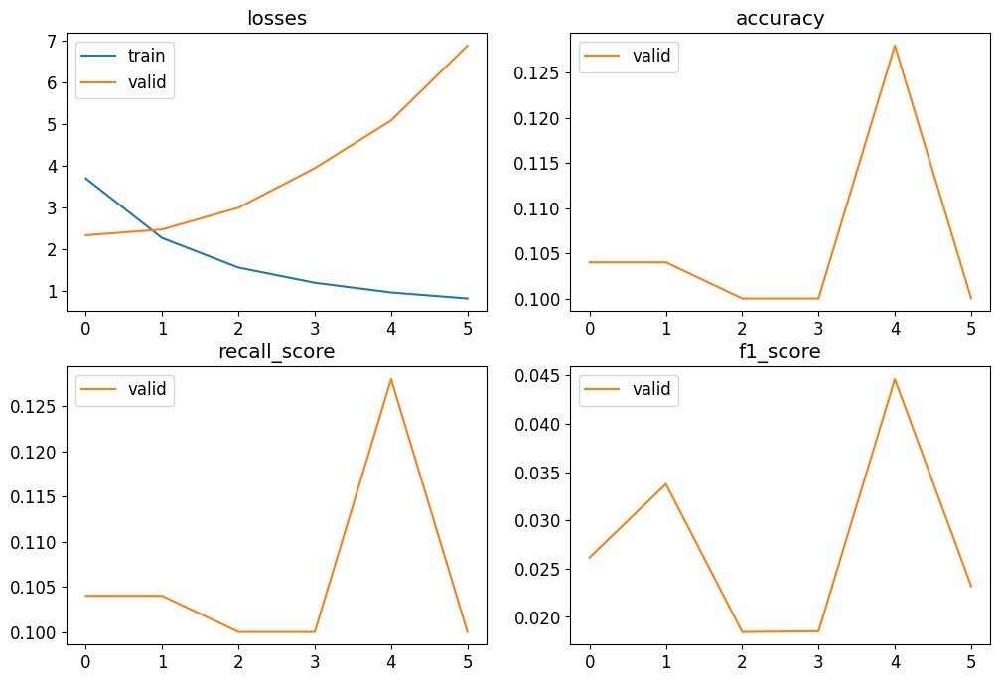

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 6.8737
Accuracy: 0.1000
Recall: 0.1000
F1-Score: 0.0232


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_5cluster01_v3.pkl')

Example 2

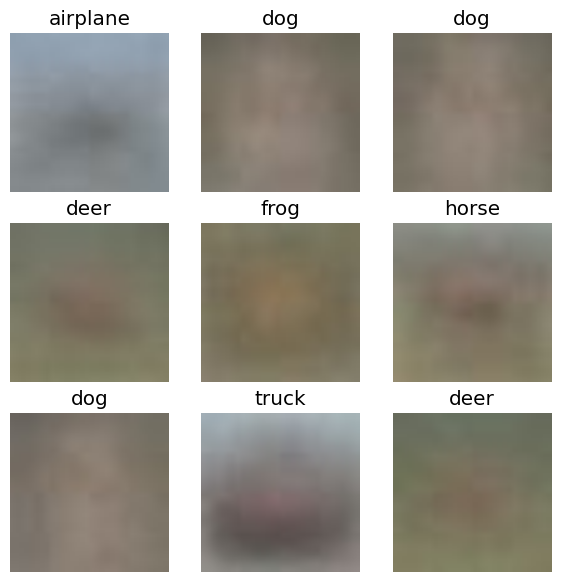

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,3.505333,2.337982,0.100000,0.100000,0.028278,00:01
1,2.174235,2.410473,0.096000,0.096000,0.027952,00:01
2,1.520422,2.579943,0.112000,0.112000,0.044105,00:01
3,1.220778,3.103841,0.080000,0.080000,0.026973,00:01
4,1.017061,4.022502,0.104000,0.104000,0.032144,00:01
5,0.935334,4.477075,0.084000,0.084000,0.027341,00:01


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 10.49 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 4.4771
Accuracy: 0.0840
Recall: 0.0840
F1-Score: 0.0273


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_5cluster02_v3.pkl')

Example 3

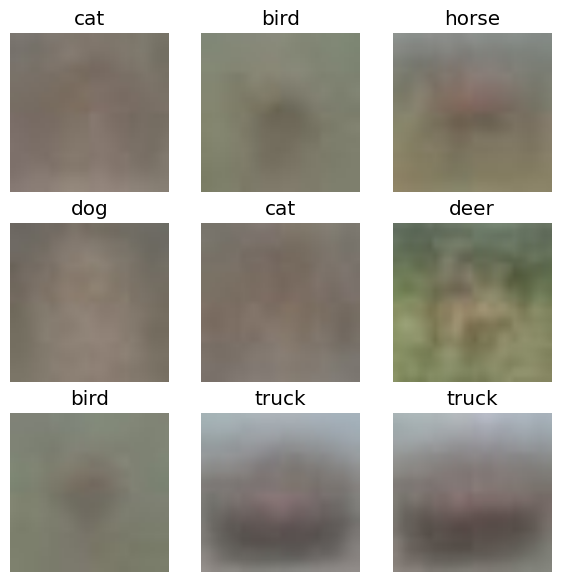

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=5)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,3.102962,2.382933,0.096000,0.096000,0.022969,00:01
1,1.843674,2.860818,0.100000,0.100000,0.018182,00:01
2,1.276973,3.539217,0.100000,0.100000,0.018182,00:01
3,0.982255,4.326324,0.100000,0.100000,0.018182,00:02
4,0.788376,5.107385,0.100000,0.100000,0.018315,00:02
5,0.650697,5.868222,0.096000,0.096000,0.024864,00:01


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 11.65 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 5.8682
Accuracy: 0.0960
Recall: 0.0960
F1-Score: 0.0249


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_5cluster03_v3.pkl')

## Resnet 0001

In [ ]:
dst = base_path / "distilled_0001"

Example 1

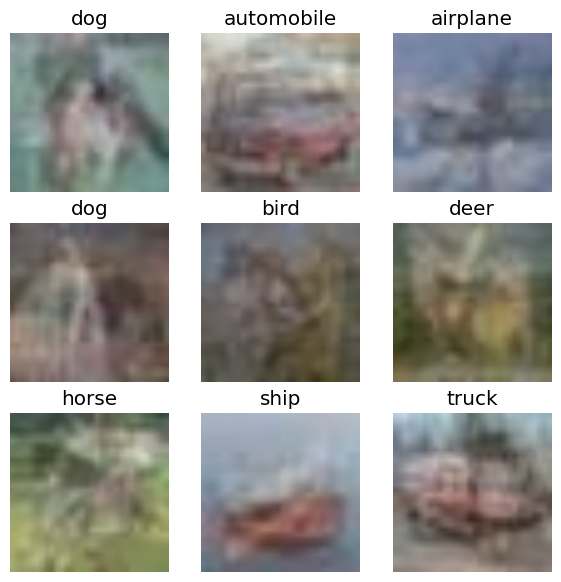

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 8918
Número total de imágenes en validación: 5000

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(50)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.915539,4.960350,0.212800,0.212800,0.167804,00:53
1,1.531784,5.775934,0.219000,0.219000,0.168786,00:53
2,1.364727,3.900023,0.272600,0.272600,0.233457,00:55
3,1.230600,3.612074,0.307800,0.307800,0.259484,00:44
4,1.171188,3.102630,0.356000,0.356000,0.340894,00:43
5,1.068822,3.887358,0.254800,0.254800,0.212679,00:42
6,0.928475,3.357786,0.371200,0.371200,0.344067,00:42
7,0.853069,5.373252,0.289400,0.289400,0.273972,00:42
8,0.731137,4.928166,0.309400,0.309400,0.280157,00:43
9,0.651108,4.784705,0.343400,0.343400,0.277692,00:43


No improvement since epoch 4: early stopping

Tiempo de entrenamiento: 593.71 segundos


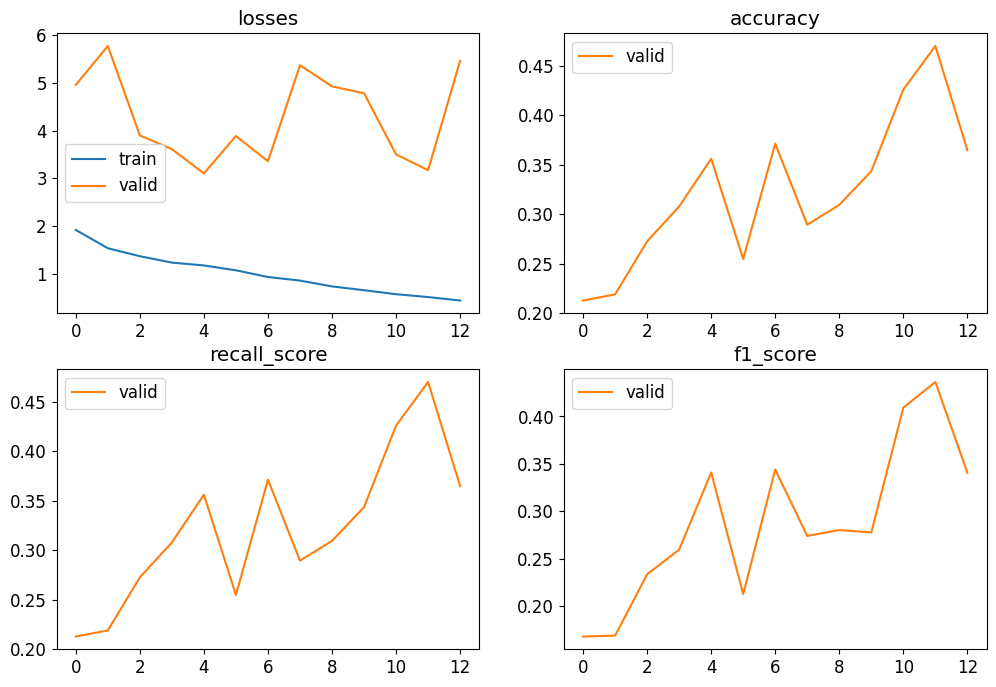

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 5.4635
Accuracy: 0.3648
Recall: 0.3648
F1-Score: 0.3406


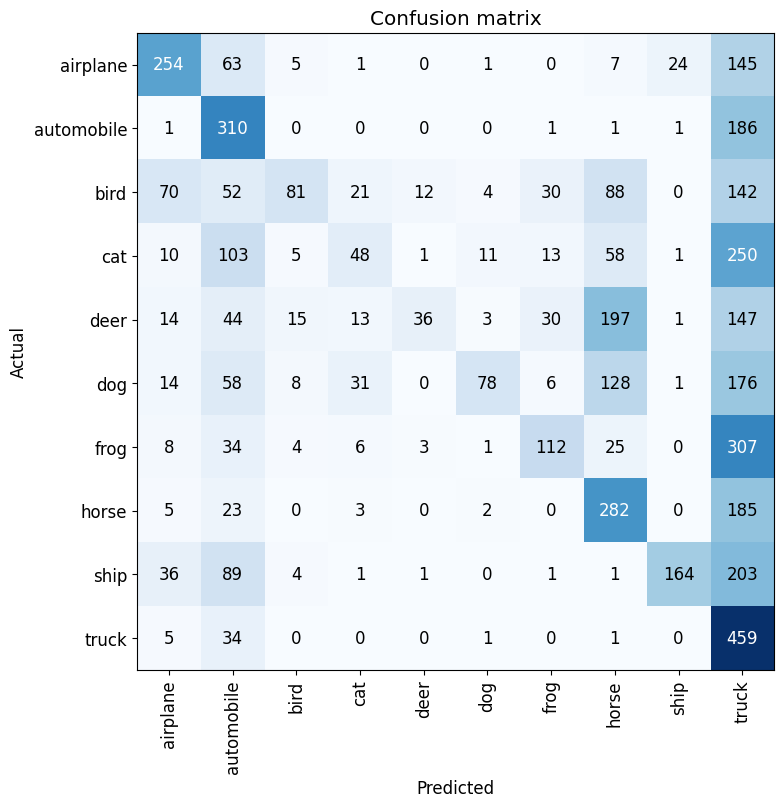

In [ ]:
#Creamos la interpretación de nuestro learner
interp = ClassificationInterpretation.from_learner(learn)

#Visualizamos la matriz de confusión
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster01_v3.pkl')

Example 2

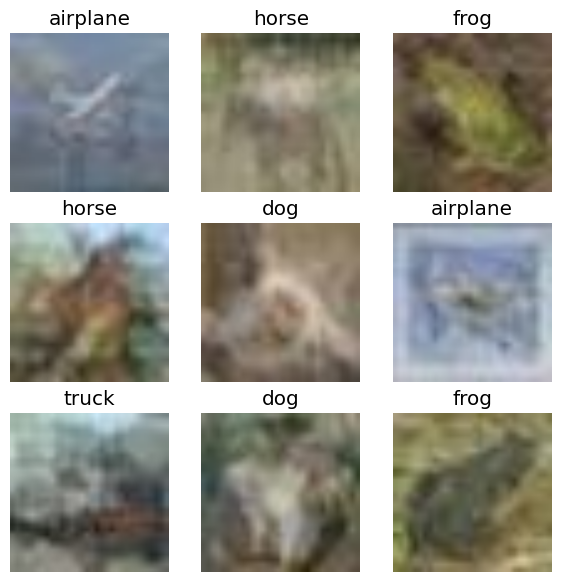

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(50)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.048525,5.482624,0.204400,0.204400,0.158186,00:42
1,1.635833,5.640571,0.183000,0.183000,0.133639,00:41
2,1.457849,6.397447,0.224400,0.224400,0.180109,00:42
3,1.277078,4.431143,0.255600,0.255600,0.224899,00:43
4,1.140731,5.109386,0.251800,0.251800,0.219948,00:43
5,1.065866,2.869158,0.355000,0.355000,0.320238,00:43
6,0.955221,4.531283,0.330800,0.330800,0.308364,00:43
7,0.845354,2.734942,0.448200,0.448200,0.423719,00:43
8,0.746970,3.999339,0.363600,0.363600,0.305059,00:43
9,0.658976,3.803677,0.410400,0.410400,0.376964,00:43


No improvement since epoch 7: early stopping

Tiempo de entrenamiento: 688.25 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.2473
Accuracy: 0.5054
Recall: 0.5054
F1-Score: 0.4930


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster02_v3.pkl')

Example 3

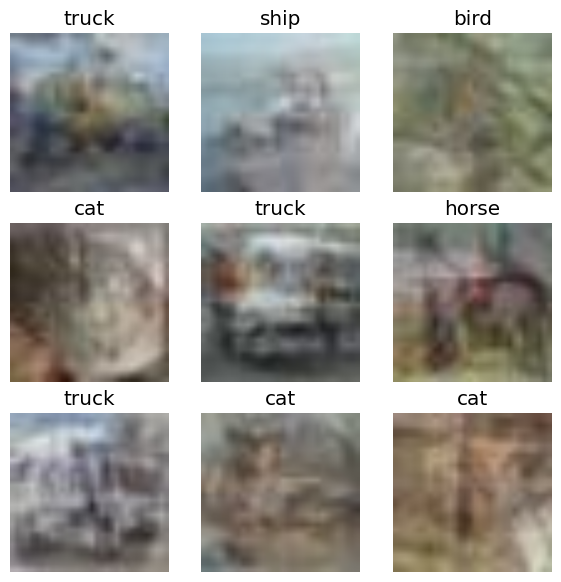

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(50)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.010945,6.089856,0.200400,0.200400,0.150120,00:44
1,1.613166,7.198396,0.189000,0.189000,0.141359,00:43
2,1.402746,5.556840,0.248000,0.248000,0.203797,00:43
3,1.299936,7.118284,0.209400,0.209400,0.140532,00:42
4,1.197632,6.969678,0.211000,0.211000,0.155963,00:43
5,1.053650,13.454112,0.145200,0.145200,0.092335,00:43
6,0.941802,3.446882,0.358600,0.358600,0.313194,00:43
7,0.874843,6.548367,0.252800,0.252800,0.177992,00:43
8,0.752921,3.482563,0.436600,0.436600,0.390887,00:43
9,0.674072,11.958292,0.162000,0.162000,0.127376,00:43


No improvement since epoch 12: early stopping

Tiempo de entrenamiento: 913.22 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.7094
Accuracy: 0.5282
Recall: 0.5282
F1-Score: 0.5035


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster03_v3.pkl')

Example 4

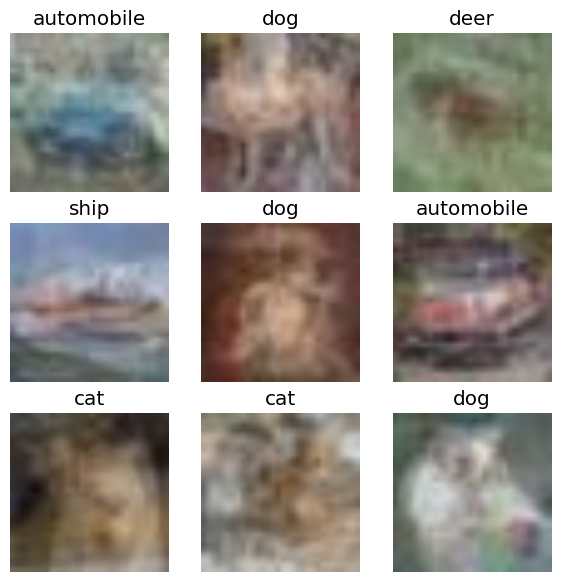

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(50)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.987914,4.684162,0.215400,0.215400,0.168858,00:43
1,1.625567,5.456070,0.193200,0.193200,0.145373,00:43
2,1.394852,6.511375,0.200200,0.200200,0.149792,00:43
3,1.275381,5.439833,0.236000,0.236000,0.203581,00:43
4,1.152704,6.076769,0.225000,0.225000,0.183192,00:42
5,1.047928,6.220860,0.216200,0.216200,0.168015,00:42
6,0.961675,9.927799,0.212400,0.212400,0.151893,00:42
7,0.842914,6.837674,0.300600,0.300600,0.243401,00:43
8,0.726556,3.612928,0.402600,0.402600,0.380741,00:43
9,0.622731,4.137253,0.414600,0.414600,0.389629,00:43


No improvement since epoch 12: early stopping

Tiempo de entrenamiento: 911.49 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.9713
Accuracy: 0.5188
Recall: 0.5188
F1-Score: 0.4941


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster04_v3.pkl')

Example 5

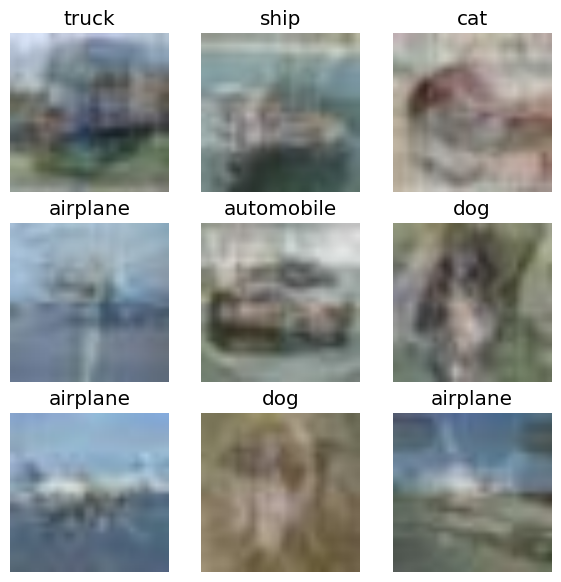

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.8),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(50)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.954551,6.796731,0.166000,0.166000,0.120524,00:43
1,1.582638,6.045837,0.208800,0.208800,0.168572,00:42
2,1.378126,6.859824,0.198000,0.198000,0.143272,00:42
3,1.229928,4.515329,0.276800,0.276800,0.232403,00:43
4,1.095194,4.220045,0.302000,0.302000,0.263655,00:43
5,1.038998,7.015018,0.217600,0.217600,0.158153,00:43
6,0.931525,5.975373,0.272800,0.272800,0.242569,00:43
7,0.842544,4.208303,0.356200,0.356200,0.307224,00:43
8,0.770634,3.531759,0.371800,0.371800,0.321546,00:43
9,0.646583,2.248618,0.525600,0.525600,0.505629,00:42


No improvement since epoch 9: early stopping

Tiempo de entrenamiento: 778.47 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 5.3396
Accuracy: 0.4126
Recall: 0.4126
F1-Score: 0.3854


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster05_v3.pkl')

# Apartado 4

## Base - Lenet

Example 1

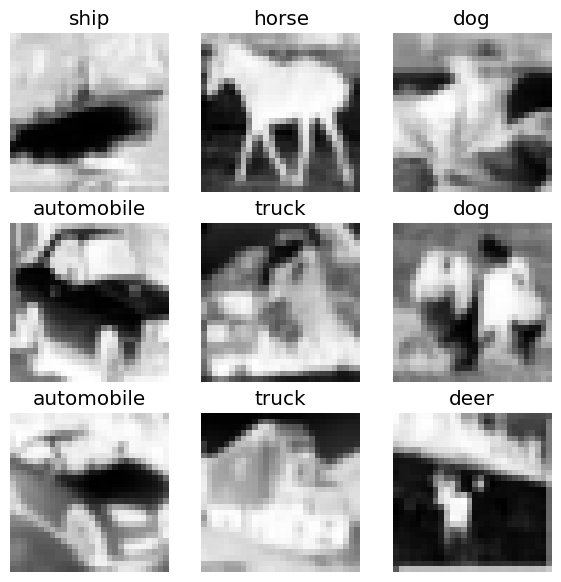

In [18]:
# Crear los DataLoaders
blocks = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction2(p, train_fraction=0.5),
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    item_tfms=Resize(28)
)

# Crear los DataLoaders
dls = blocks.dataloaders(original_path/'cifar10'/'train', bs=64)

# Mostrar una muestra de las imágenes para verificar la correcta organización
dls.show_batch(max_n=9, figsize=(7,7))


Número total de imágenes en entrenamiento: 20064
Número total de imágenes en validación: 5016

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


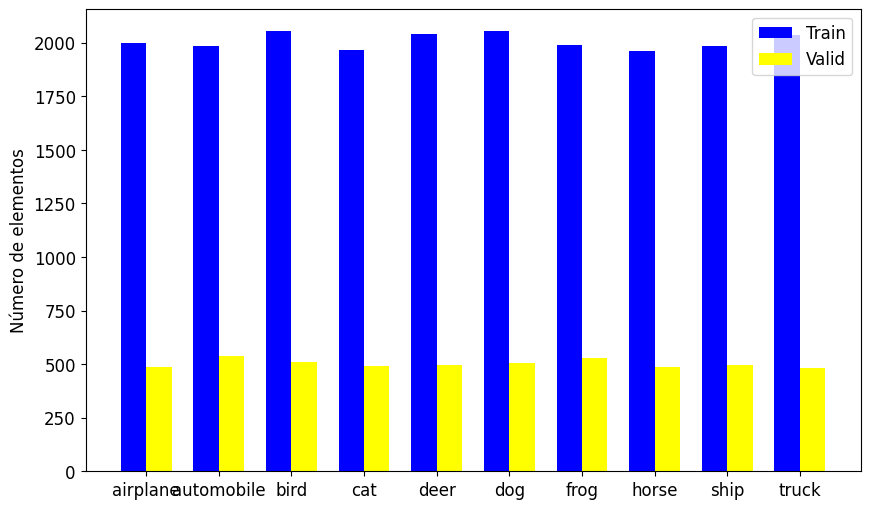

In [19]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])


In [ ]:
start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.184626,2.154198,0.212750,0.212167,0.159583,01:08
1,1.968250,2.018717,0.271750,0.272129,0.240473,01:07
2,1.796167,1.777801,0.363583,0.362828,0.364124,01:08
3,1.696755,1.656081,0.404667,0.404600,0.397352,01:08
4,1.606595,1.603602,0.417250,0.416851,0.402302,01:08
5,1.489509,1.601624,0.439083,0.437949,0.439032,01:08
6,1.449284,1.447481,0.489000,0.489534,0.494284,01:08
7,1.381225,1.418215,0.498000,0.498287,0.487629,01:07
8,1.319321,1.401692,0.505500,0.506333,0.497702,01:08
9,1.295023,1.349909,0.523333,0.523030,0.524965,01:08



Tiempo de entrenamiento: 1361.47 segundos


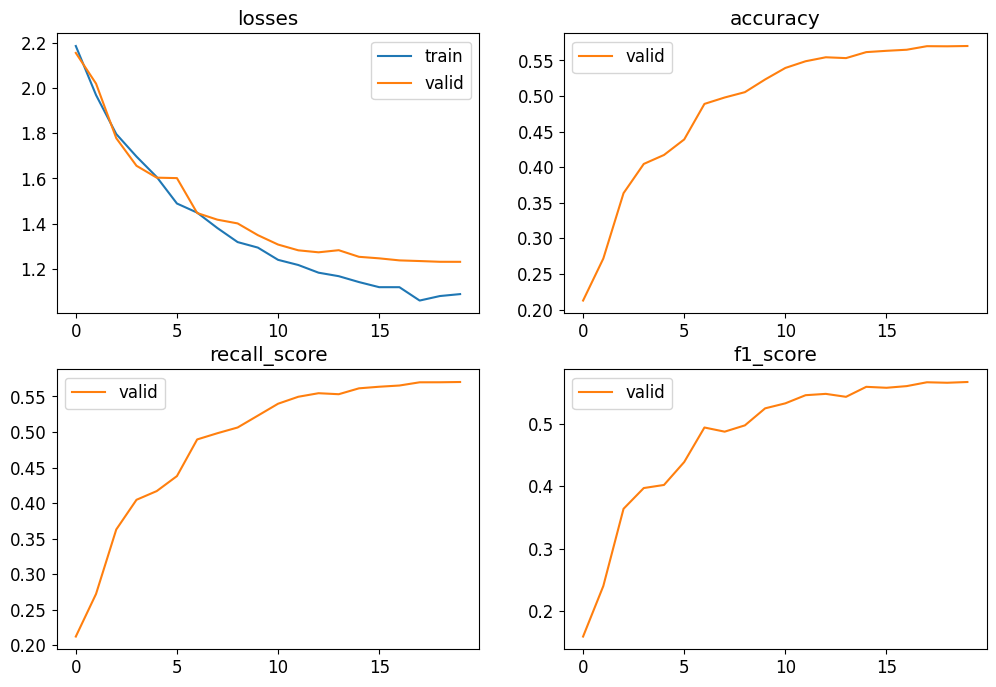

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 1.2322
Accuracy: 0.5703
Recall: 0.5703
F1-Score: 0.5671


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_2cluster01_v3.pkl')

## Lenet 001

In [ ]:
dst = base_path / "distilled_001"

Example 1

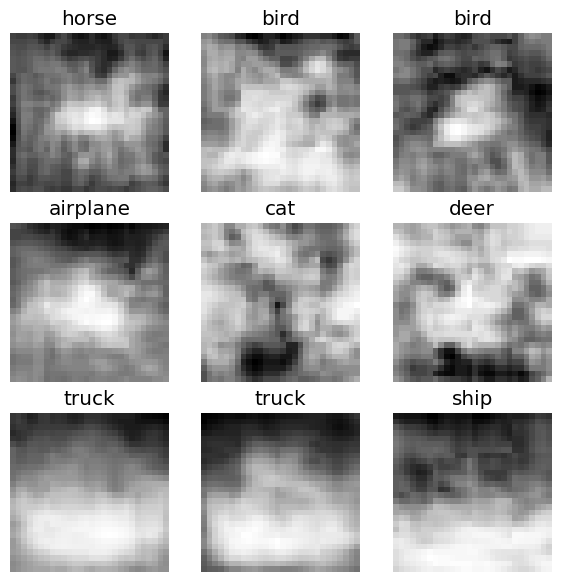

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 511
Número total de imágenes en validación: 500

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


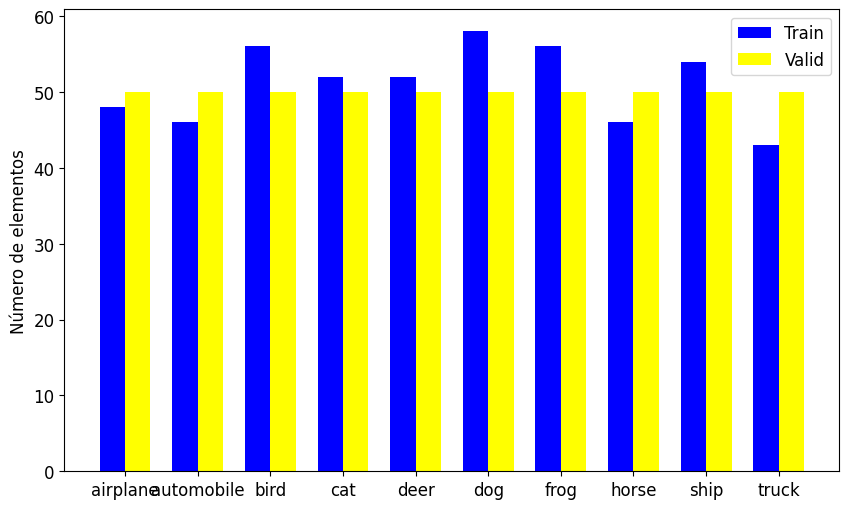

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.306736,2.304069,0.100000,0.100000,0.018182,00:02
1,2.306309,2.303459,0.100000,0.100000,0.018182,00:01
2,2.305663,2.302201,0.110000,0.110000,0.038095,00:01
3,2.304446,2.300050,0.094000,0.094000,0.022158,00:01
4,2.302046,2.296503,0.094000,0.094000,0.031619,00:01
5,2.298518,2.292648,0.100000,0.100000,0.018587,00:01
6,2.292601,2.288429,0.106000,0.106000,0.028269,00:01
7,2.283046,2.295618,0.106000,0.106000,0.029940,00:01
8,2.267284,2.299812,0.136000,0.136000,0.060489,00:02
9,2.241915,2.287049,0.146000,0.146000,0.067682,00:01


No improvement since epoch 9: early stopping

Tiempo de entrenamiento: 19.62 segundos


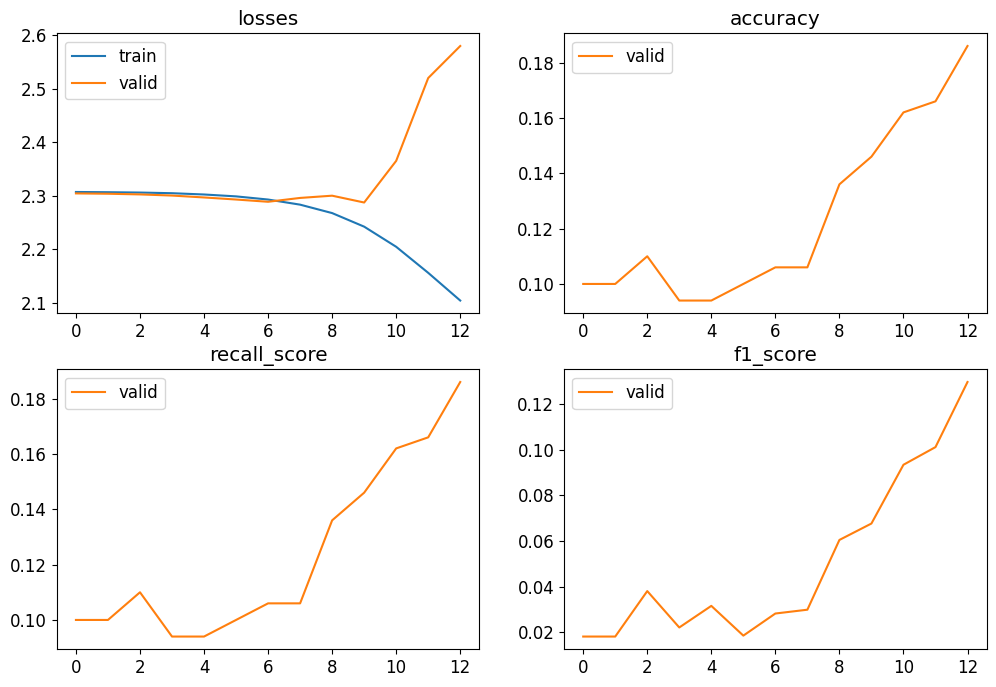

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.5796
Accuracy: 0.1860
Recall: 0.1860
F1-Score: 0.1297


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster01_v3.pkl')

Example 2

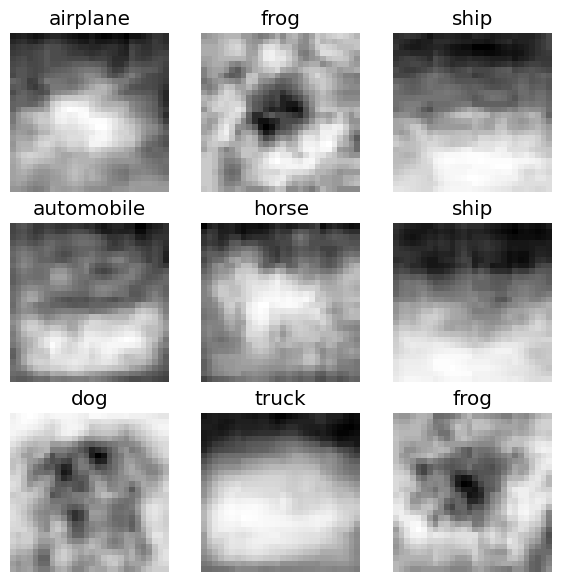

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303683,2.304114,0.100000,0.100000,0.018182,00:01
1,2.303413,2.303804,0.100000,0.100000,0.018182,00:01
2,2.303174,2.303028,0.100000,0.100000,0.018182,00:01
3,2.302688,2.301514,0.100000,0.100000,0.018182,00:02
4,2.301502,2.295665,0.144000,0.144000,0.066569,00:01
5,2.297169,2.275250,0.148000,0.148000,0.071111,00:01
6,2.281380,2.218644,0.162000,0.162000,0.093471,00:01
7,2.234082,2.262467,0.184000,0.184000,0.114992,00:01
8,2.149999,2.483127,0.162000,0.162000,0.129861,00:01
9,2.047092,2.903317,0.184000,0.184000,0.163837,00:01


No improvement since epoch 6: early stopping

Tiempo de entrenamiento: 15.09 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.9033
Accuracy: 0.1840
Recall: 0.1840
F1-Score: 0.1638


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster02_v3.pkl')

Example 3

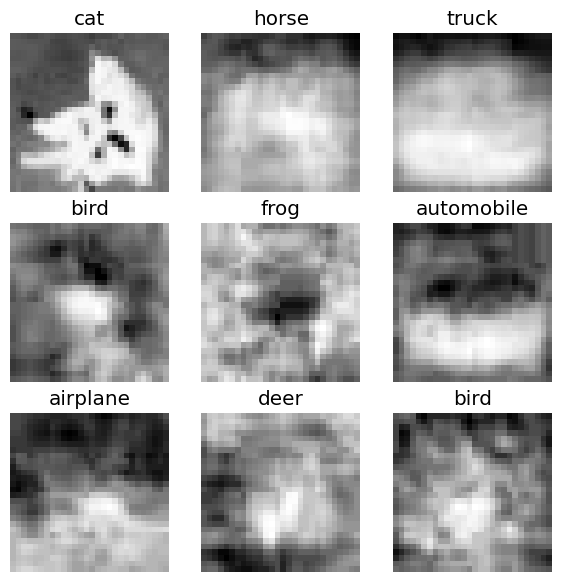

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.298908,2.303334,0.100000,0.100000,0.018182,00:01
1,2.299611,2.302796,0.100000,0.100000,0.018182,00:02
2,2.298803,2.301583,0.100000,0.100000,0.018182,00:01
3,2.297712,2.298936,0.100000,0.100000,0.018182,00:01
4,2.295568,2.289898,0.102000,0.102000,0.021985,00:01
5,2.289984,2.267660,0.136000,0.136000,0.067777,00:01
6,2.277385,2.236479,0.134000,0.134000,0.049341,00:01
7,2.248854,2.206432,0.176000,0.176000,0.110572,00:01
8,2.200053,2.294181,0.158000,0.158000,0.097902,00:01
9,2.141068,2.418230,0.162000,0.162000,0.121146,00:01


No improvement since epoch 7: early stopping

Tiempo de entrenamiento: 16.97 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.6077
Accuracy: 0.1720
Recall: 0.1720
F1-Score: 0.1255


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster03_v3.pkl')

Example 4

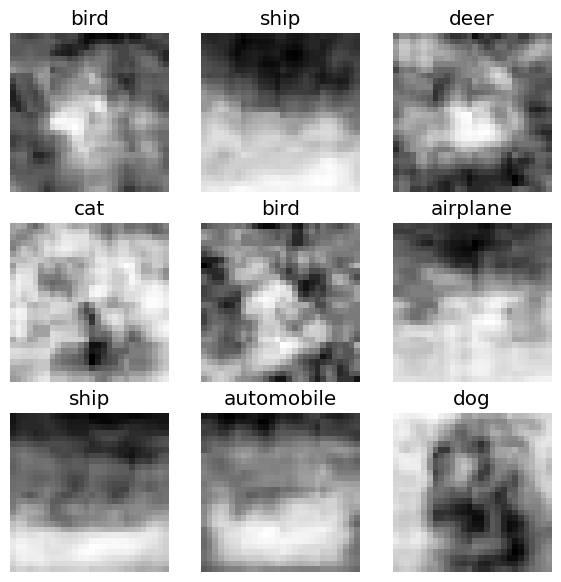

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303822,2.303674,0.100000,0.100000,0.018182,00:01
1,2.305038,2.303429,0.100000,0.100000,0.018182,00:01
2,2.304358,2.302939,0.108000,0.108000,0.035692,00:01
3,2.303519,2.302700,0.100000,0.100000,0.028633,00:01
4,2.302882,2.301638,0.100000,0.100000,0.018182,00:01
5,2.301906,2.300016,0.100000,0.100000,0.018182,00:01
6,2.300179,2.295649,0.168000,0.168000,0.097099,00:01
7,2.297090,2.288089,0.118000,0.118000,0.064846,00:02
8,2.291402,2.274321,0.132000,0.132000,0.056831,00:01
9,2.283073,2.248853,0.152000,0.152000,0.096089,00:01


No improvement since epoch 11: early stopping

Tiempo de entrenamiento: 21.43 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.2689
Accuracy: 0.1420
Recall: 0.1420
F1-Score: 0.0892


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster04_v3.pkl')

Example 5

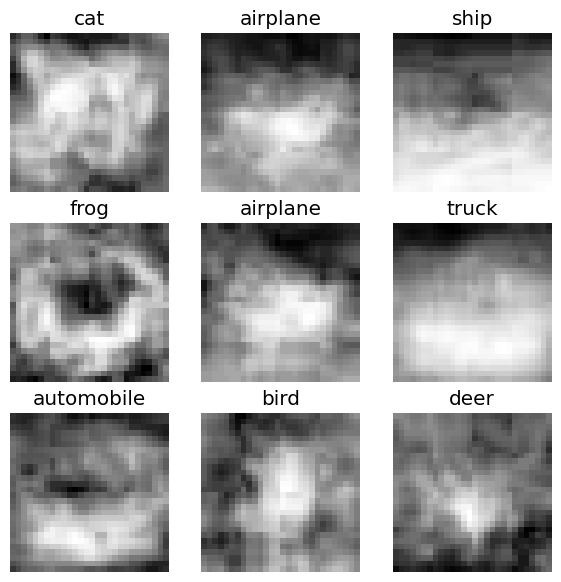

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303133,2.302888,0.100000,0.100000,0.018182,00:01
1,2.303628,2.302176,0.100000,0.100000,0.018215,00:02
2,2.302891,2.300615,0.102000,0.102000,0.021980,00:01
3,2.301355,2.296462,0.132000,0.132000,0.069422,00:01
4,2.297501,2.286962,0.128000,0.128000,0.064625,00:01
5,2.291416,2.264317,0.180000,0.180000,0.111798,00:01
6,2.279559,2.223297,0.210000,0.210000,0.127522,00:01
7,2.258582,2.181789,0.178000,0.178000,0.113437,00:01
8,2.215910,2.211161,0.168000,0.168000,0.108216,00:01
9,2.154746,2.419552,0.190000,0.190000,0.123290,00:01


No improvement since epoch 7: early stopping

Tiempo de entrenamiento: 17.15 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.5258
Accuracy: 0.1740
Recall: 0.1740
F1-Score: 0.1325


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster05_v3.pkl')

## Lenet 005

In [ ]:
dst = base_path / "distilled_005"

Example 1

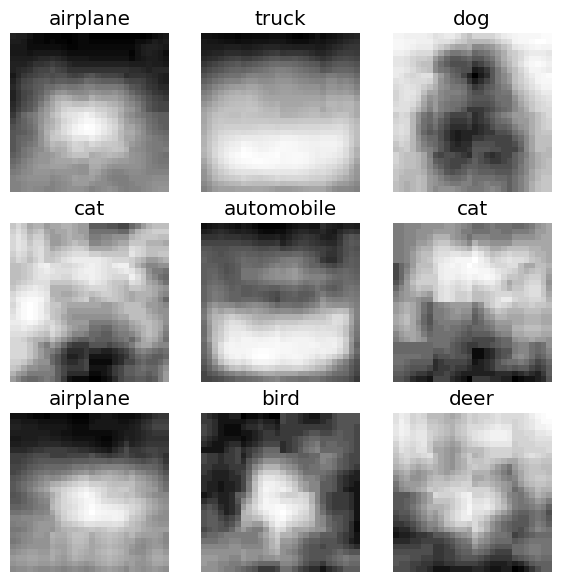

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 106
Número total de imágenes en validación: 250

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


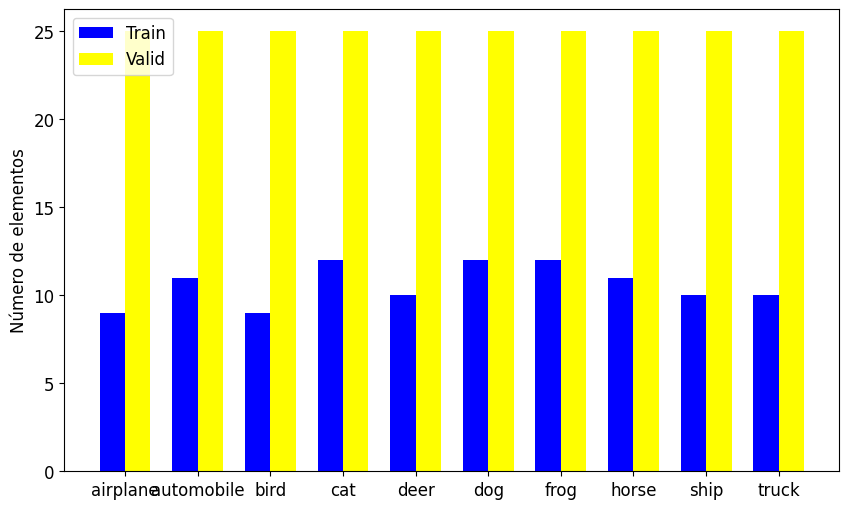

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.300784,2.304360,0.100000,0.100000,0.018182,00:00
1,2.298940,2.304342,0.100000,0.100000,0.018182,00:00
2,2.299348,2.304303,0.100000,0.100000,0.018182,00:00
3,2.300033,2.304243,0.100000,0.100000,0.018182,00:00
4,2.299788,2.304177,0.100000,0.100000,0.018182,00:00
5,2.300155,2.304064,0.100000,0.100000,0.018182,00:00
6,2.299156,2.304044,0.100000,0.100000,0.018182,00:00
7,2.299751,2.304090,0.100000,0.100000,0.018182,00:00
8,2.299183,2.304170,0.096000,0.096000,0.034748,00:00
9,2.297545,2.304322,0.096000,0.096000,0.018113,00:00


No improvement since epoch 6: early stopping

Tiempo de entrenamiento: 6.56 segundos


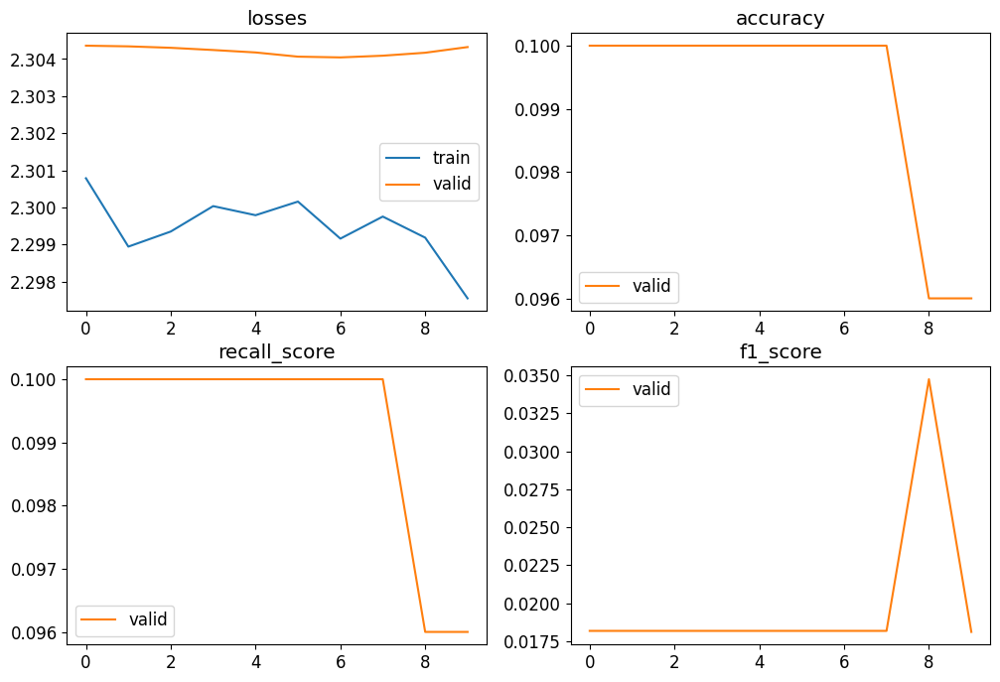

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3043
Accuracy: 0.0960
Recall: 0.0960
F1-Score: 0.0181


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster01_v3.pkl')

Example 2

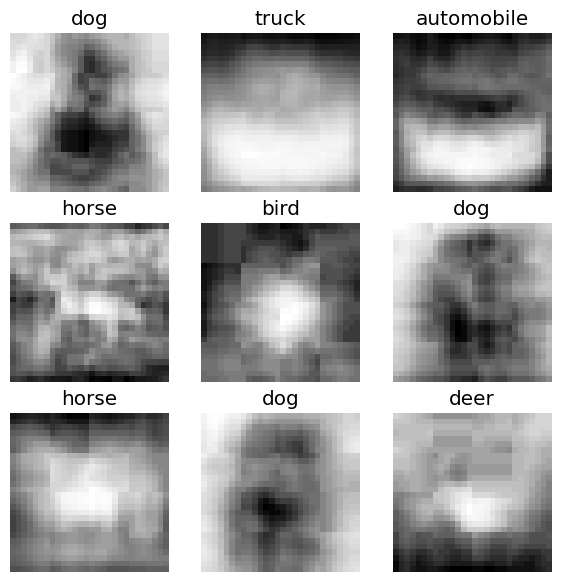

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.315424,2.304403,0.100000,0.100000,0.018182,00:00
1,2.315662,2.304366,0.100000,0.100000,0.018182,00:00
2,2.312642,2.304300,0.100000,0.100000,0.018182,00:00
3,2.313013,2.304170,0.100000,0.100000,0.018182,00:00
4,2.312574,2.303955,0.100000,0.100000,0.018182,00:00
5,2.311065,2.303698,0.100000,0.100000,0.018182,00:00
6,2.310489,2.303438,0.100000,0.100000,0.018182,00:00
7,2.310687,2.303156,0.100000,0.100000,0.018182,00:00
8,2.310873,2.303022,0.100000,0.100000,0.018182,00:00
9,2.309493,2.302928,0.100000,0.100000,0.018182,00:00



Tiempo de entrenamiento: 14.39 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3024
Accuracy: 0.0960
Recall: 0.0960
F1-Score: 0.0178


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster02_v3.pkl')

Example 3

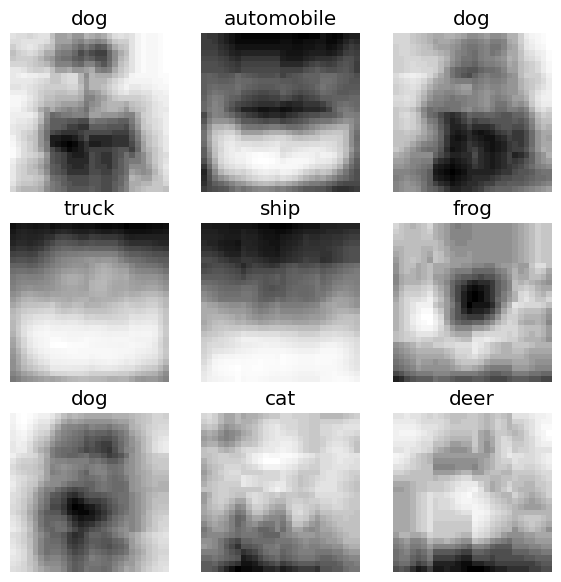

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.302369,2.303360,0.100000,0.100000,0.018182,00:01
1,2.299342,2.303350,0.100000,0.100000,0.018182,00:00
2,2.299604,2.303341,0.100000,0.100000,0.018182,00:00
3,2.300232,2.303353,0.100000,0.100000,0.018182,00:00
4,2.300905,2.303393,0.100000,0.100000,0.018182,00:00
5,2.300694,2.303510,0.100000,0.100000,0.018182,00:00


No improvement since epoch 2: early stopping

Tiempo de entrenamiento: 4.39 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3035
Accuracy: 0.1000
Recall: 0.1000
F1-Score: 0.0182


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster03_v3.pkl')

Example 4

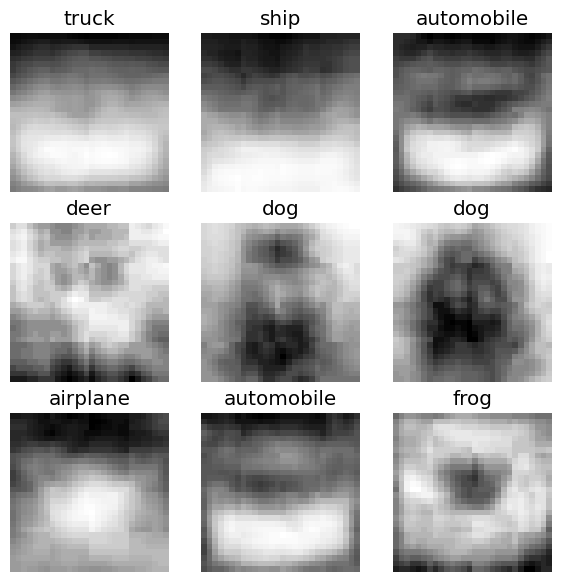

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.290090,2.304403,0.100000,0.100000,0.018182,00:00
1,2.296538,2.304368,0.100000,0.100000,0.018182,00:00
2,2.296628,2.304308,0.100000,0.100000,0.018182,00:00
3,2.297856,2.304256,0.100000,0.100000,0.018182,00:00
4,2.298039,2.304151,0.100000,0.100000,0.018182,00:00
5,2.298134,2.304085,0.100000,0.100000,0.018182,00:00
6,2.297187,2.304105,0.100000,0.100000,0.018182,00:00
7,2.297419,2.304247,0.104000,0.104000,0.029542,00:00
8,2.296252,2.304659,0.120000,0.120000,0.038343,00:01


No improvement since epoch 5: early stopping

Tiempo de entrenamiento: 6.45 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3047
Accuracy: 0.1200
Recall: 0.1200
F1-Score: 0.0383


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster04_v3.pkl')

Example 5

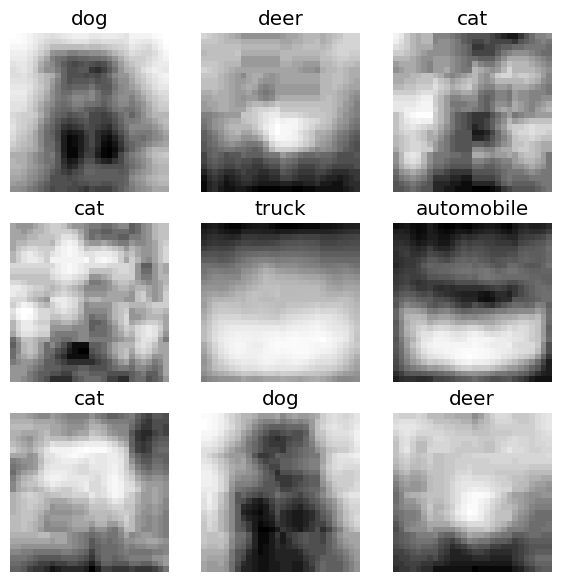

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.307025,2.304734,0.100000,0.100000,0.018182,00:01
1,2.304164,2.304708,0.100000,0.100000,0.018182,00:01
2,2.302846,2.304676,0.100000,0.100000,0.018182,00:01
3,2.305721,2.304604,0.100000,0.100000,0.018182,00:02
4,2.307252,2.304508,0.100000,0.100000,0.018182,00:01
5,2.307765,2.304360,0.100000,0.100000,0.018182,00:01
6,2.306922,2.304294,0.100000,0.100000,0.018182,00:01
7,2.306849,2.304271,0.100000,0.100000,0.018182,00:01
8,2.306684,2.304227,0.100000,0.100000,0.018450,00:01
9,2.306890,2.304142,0.116000,0.116000,0.038379,00:01


No improvement since epoch 11: early stopping

Tiempo de entrenamiento: 23.41 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3041
Accuracy: 0.1000
Recall: 0.1000
F1-Score: 0.0182


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster05_v3.pkl')

## Lenet 0001

In [ ]:
dst = base_path / "distilled_0001"

Example 1

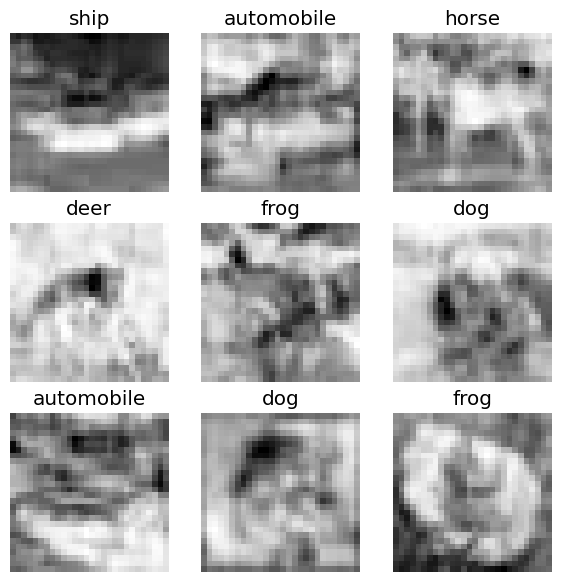

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

Número total de imágenes en entrenamiento: 5512
Número total de imágenes en validación: 5000

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


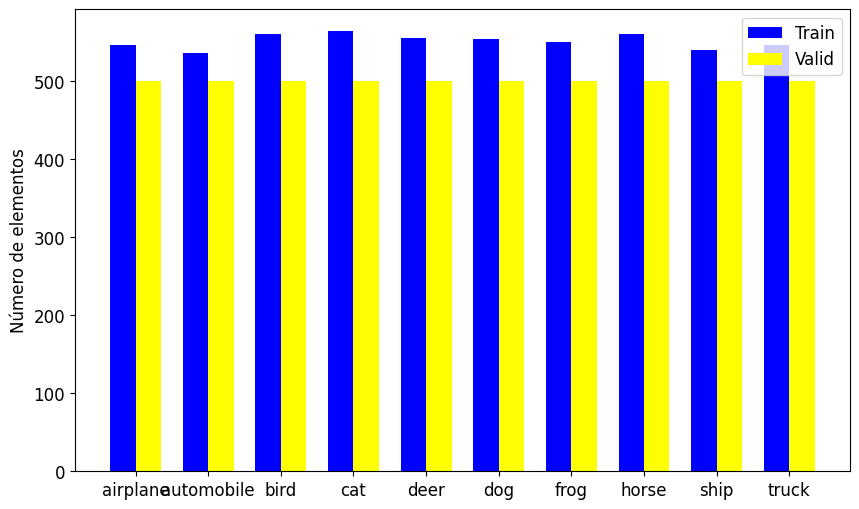

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

plot_label_counts(dls)

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.302872,2.302778,0.100000,0.100000,0.018182,00:25
1,2.295435,2.289567,0.141600,0.141600,0.064396,00:24
2,2.148843,2.315301,0.182000,0.182000,0.145123,00:17
3,1.948949,2.349997,0.206600,0.206600,0.176406,00:12
4,1.823819,2.488446,0.228000,0.228000,0.204092,00:18


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 98.27 segundos


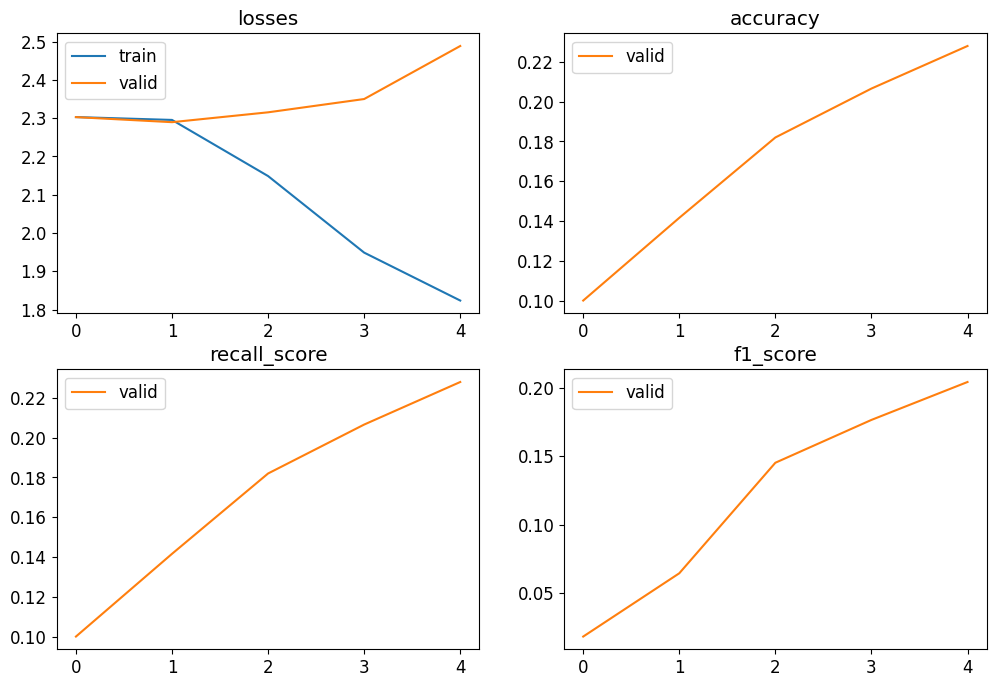

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4884
Accuracy: 0.2280
Recall: 0.2280
F1-Score: 0.2041


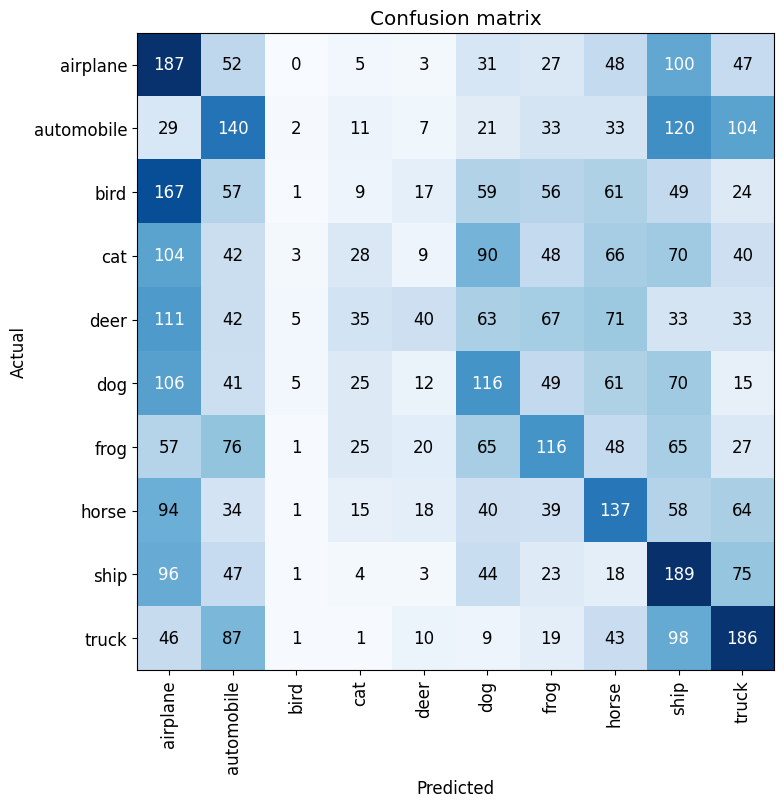

In [ ]:
#Creamos la interpretación de nuestro learner
interp = ClassificationInterpretation.from_learner(learn)

#Visualizamos la matriz de confusión
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster01_v3.pkl')

Example 2

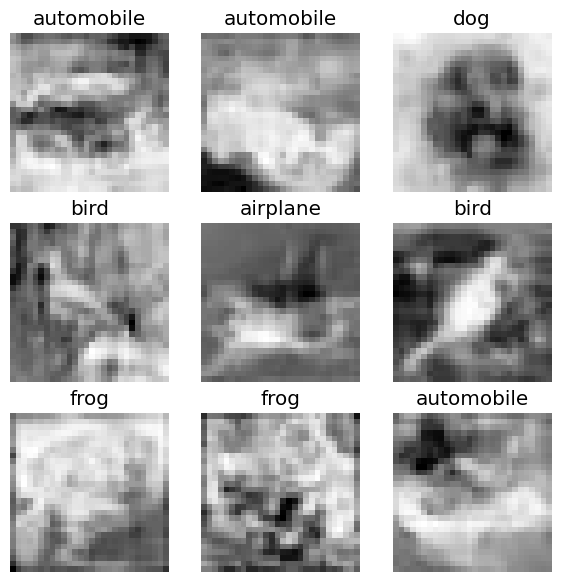

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.302604,2.302650,0.116000,0.116000,0.038013,00:12
1,2.292123,2.274039,0.183400,0.183400,0.112018,00:12
2,2.087722,2.299796,0.195200,0.195200,0.169070,00:11
3,1.899856,2.358546,0.205000,0.205000,0.176293,00:12
4,1.783438,2.376915,0.237800,0.237800,0.198937,00:12


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 62.10 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3769
Accuracy: 0.2378
Recall: 0.2378
F1-Score: 0.1989


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster02_v3.pkl')

Example 3

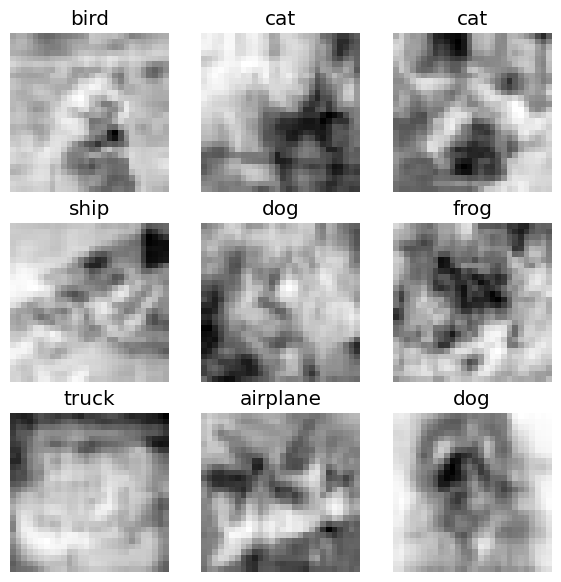

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303581,2.301832,0.103400,0.103400,0.030059,00:12
1,2.293394,2.275273,0.143000,0.143000,0.061761,00:12
2,2.061893,2.421498,0.174600,0.174600,0.099011,00:11
3,1.861934,2.328884,0.231800,0.231800,0.211748,00:12
4,1.756411,2.392216,0.244000,0.244000,0.221421,00:12


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 61.94 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.3922
Accuracy: 0.2440
Recall: 0.2440
F1-Score: 0.2214


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster03_v3.pkl')

Example 4

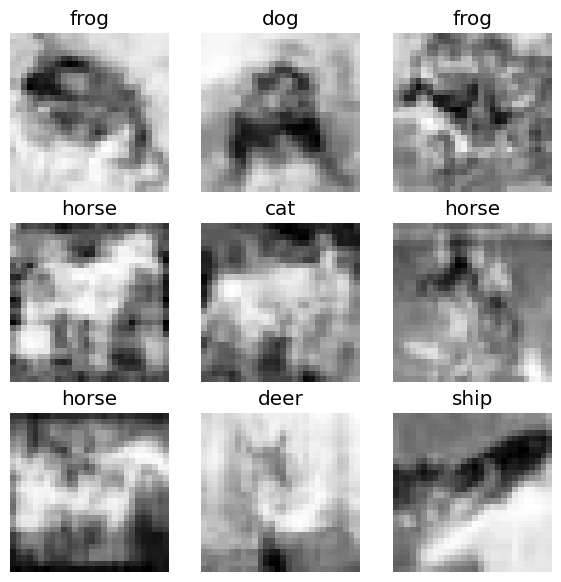

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.303987,2.302992,0.099600,0.099600,0.018892,00:12
1,2.293341,2.272639,0.178000,0.178000,0.113155,00:12
2,2.002493,2.394077,0.216000,0.216000,0.199327,00:11
3,1.801997,2.531445,0.221200,0.221200,0.192641,00:12
4,1.715751,2.429182,0.234200,0.234200,0.208418,00:12


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 62.12 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4292
Accuracy: 0.2342
Recall: 0.2342
F1-Score: 0.2084


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster04_v3.pkl')

Example 5

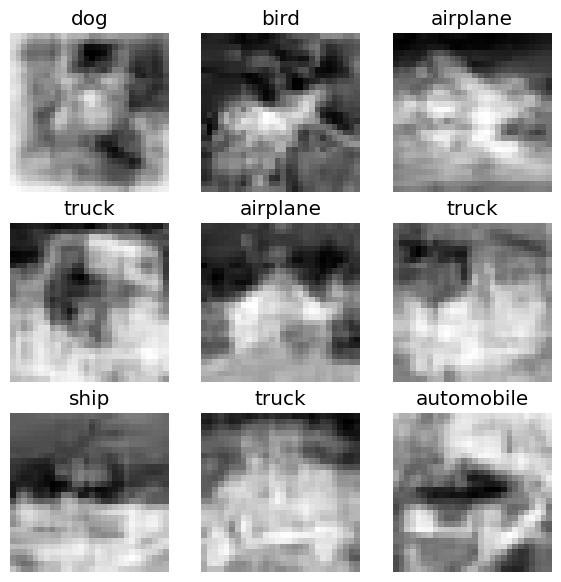

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(28)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
model = LeNet(num_classes=10)
# Crear el objeto learn
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.304039,2.302728,0.100000,0.100000,0.018182,00:12
1,2.299100,2.290062,0.139400,0.139400,0.074081,00:12
2,2.138139,2.550359,0.162000,0.162000,0.105955,00:12
3,1.948543,2.437228,0.185800,0.185800,0.155798,00:12
4,1.891739,2.489269,0.209000,0.209000,0.187462,00:12


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 62.30 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4893
Accuracy: 0.2090
Recall: 0.2090
F1-Score: 0.1875


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster05_v3.pkl')

## Base - Resnet

Example 1

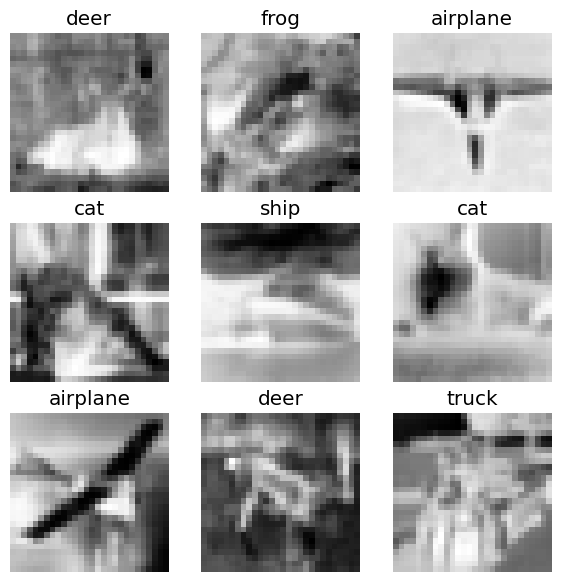

In [20]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction2(p, train_fraction=0.5),
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = blocks.dataloaders(original_path/'cifar10'/'train', bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [21]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 19812
Número total de imágenes en validación: 4953

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.006864,1.606176,0.432667,0.432676,0.410389,03:18
1,1.469911,1.357940,0.516583,0.517359,0.520686,03:16
2,0.978094,0.990563,0.653750,0.654879,0.650677,03:18
3,0.769965,0.707193,0.752083,0.752041,0.754396,03:18
4,0.615198,0.650018,0.775667,0.775583,0.778634,03:17
5,0.521867,0.556714,0.808167,0.808597,0.807185,03:18
6,0.410672,0.515107,0.827167,0.827778,0.825223,03:18
7,0.334085,0.465383,0.846500,0.846954,0.846865,03:16
8,0.277908,0.428246,0.862250,0.862496,0.863871,03:19
9,0.191409,0.465605,0.859833,0.860035,0.859871,03:17


No improvement since epoch 8: early stopping

Tiempo de entrenamiento: 2376.98 segundos


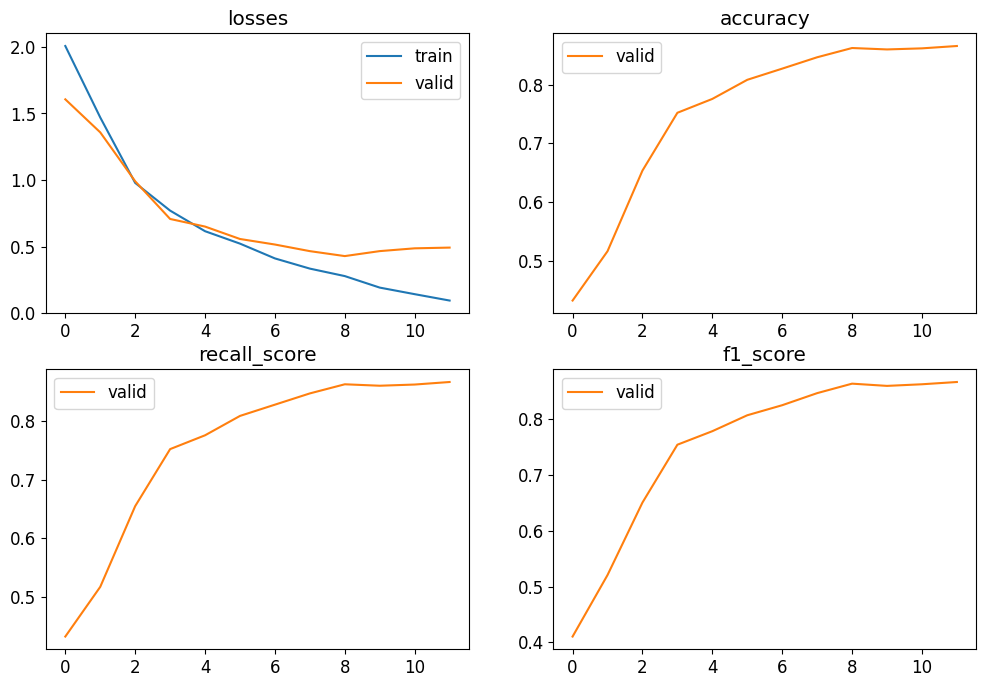

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 0.4920
Accuracy: 0.8657
Recall: 0.8664
F1-Score: 0.8668


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_2cluster01_v3.pkl')

## Resnet 001

In [ ]:
dst = base_path / "distilled_001"

Example 1

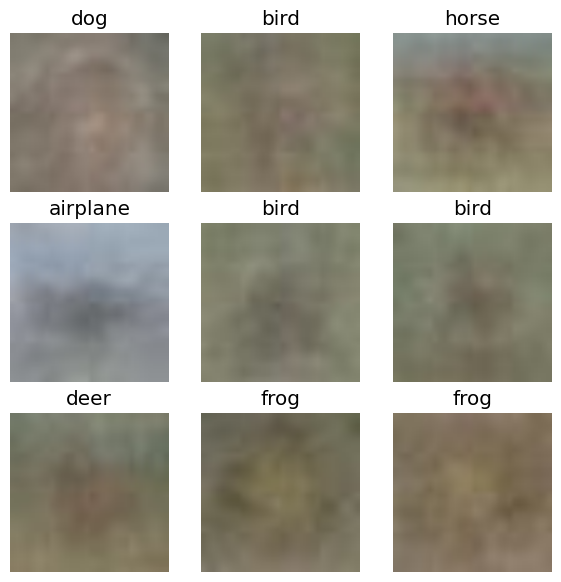

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 512
Número total de imágenes en validación: 500

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,1.908128,2.646609,0.100000,0.100000,0.018182,00:04
1,1.175623,4.368081,0.122000,0.122000,0.041348,00:05
2,0.889256,7.526476,0.102000,0.102000,0.033775,00:04
3,0.713879,9.505116,0.140000,0.140000,0.051406,00:04


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 18.43 segundos


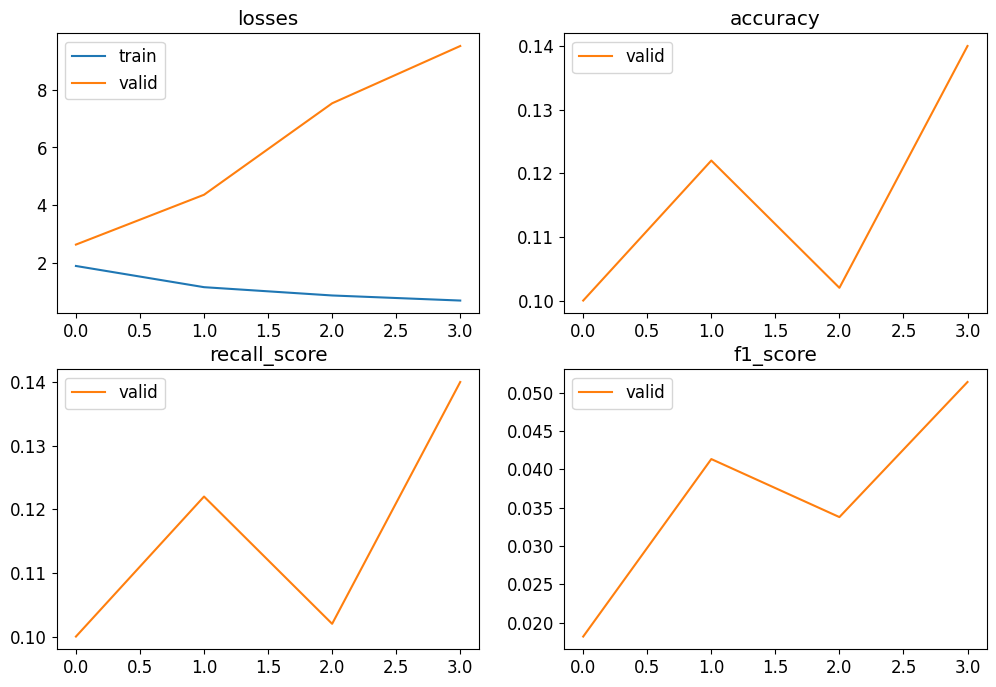

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 9.5051
Accuracy: 0.1400
Recall: 0.1400
F1-Score: 0.0514


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_2cluster01_v3.pkl')

Example 2

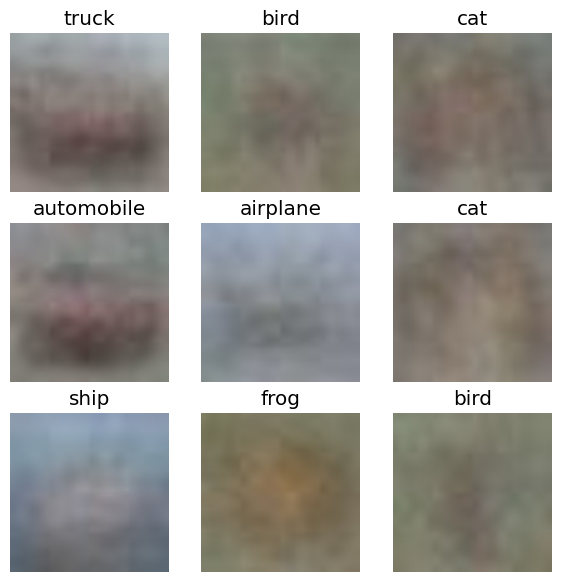

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.298364,2.862350,0.126000,0.126000,0.052939,00:05
1,1.376660,4.998593,0.100000,0.100000,0.018248,00:04
2,0.986976,8.420273,0.106000,0.106000,0.028299,00:06
3,0.810758,11.144992,0.128000,0.128000,0.061905,00:04


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 20.29 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 11.1450
Accuracy: 0.1280
Recall: 0.1280
F1-Score: 0.0619


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_2cluster02_v3.pkl')

Example 3

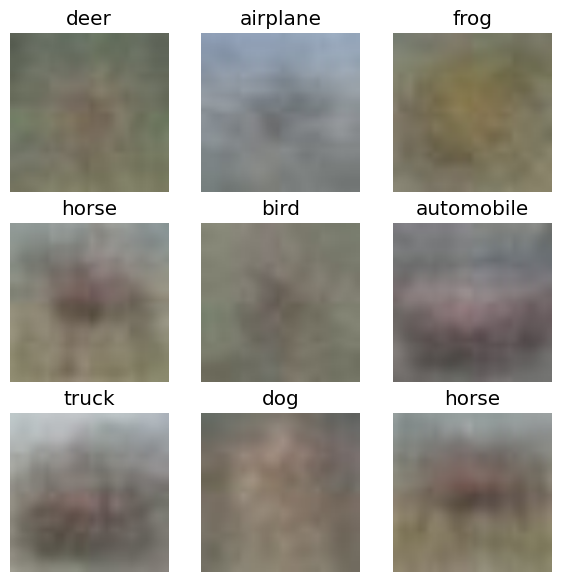

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.148922,2.690292,0.100000,0.100000,0.018182,00:04
1,1.349857,4.560612,0.100000,0.100000,0.018282,00:04
2,0.998904,6.289353,0.102000,0.102000,0.024811,00:03
3,0.806313,7.953312,0.108000,0.108000,0.045645,00:03


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 16.68 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 7.9533
Accuracy: 0.1080
Recall: 0.1080
F1-Score: 0.0456


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_2cluster03_v3.pkl')

## Resnet 005

In [ ]:
dst = base_path / "distilled_005"

Example 1

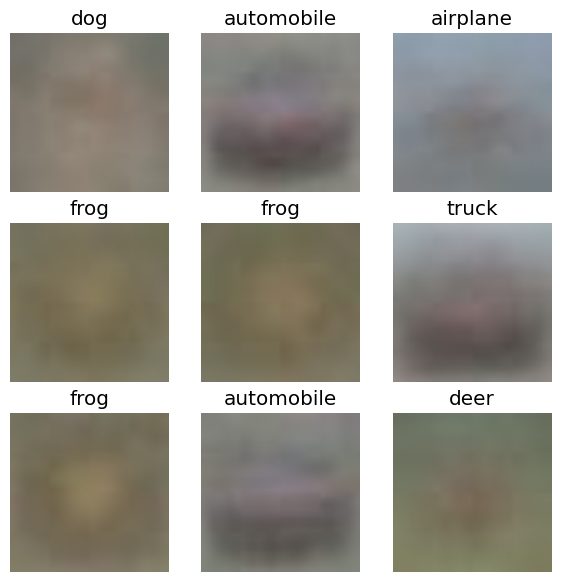

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 94
Número total de imágenes en validación: 250

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,4.330393,2.300073,0.124000,0.124000,0.079295,00:01
1,3.166764,2.373516,0.108000,0.108000,0.040990,00:01
2,2.263135,2.426335,0.108000,0.108000,0.032243,00:01
3,1.760284,2.461674,0.100000,0.100000,0.018182,00:01


No improvement since epoch 0: early stopping

Tiempo de entrenamiento: 5.06 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4617
Accuracy: 0.1000
Recall: 0.1000
F1-Score: 0.0182


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_2cluster01_v3.pkl')

Example 2

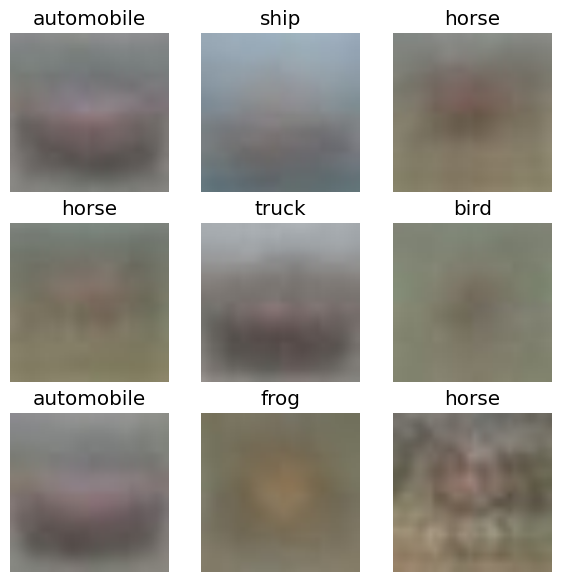

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,4.278312,2.420765,0.092000,0.092000,0.038853,00:01
1,3.284421,2.338996,0.100000,0.100000,0.066763,00:01
2,2.394150,2.352491,0.084000,0.084000,0.028113,00:01
3,1.877921,2.393189,0.108000,0.108000,0.037998,00:01
4,1.531176,2.464065,0.124000,0.124000,0.053849,00:01


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 7.87 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.4641
Accuracy: 0.1240
Recall: 0.1240
F1-Score: 0.0538


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_2cluster02_v3.pkl')

Example 3

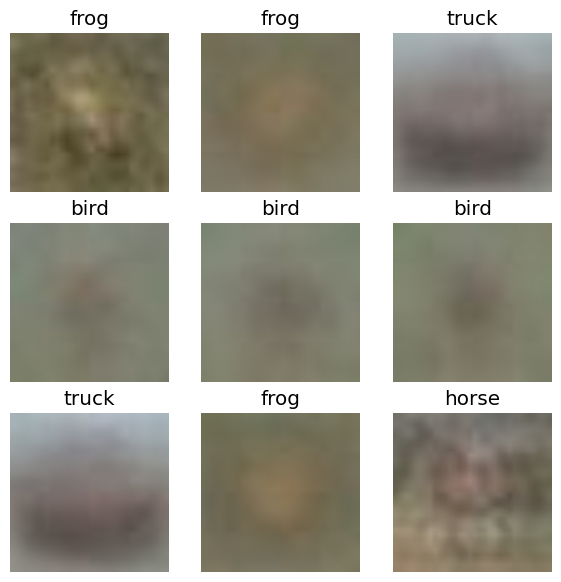

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)
)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=3)])

start_time = time.time()
learn.fit_one_cycle(20)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,3.538103,2.334972,0.092000,0.092000,0.056664,00:02
1,2.792936,2.327623,0.092000,0.092000,0.034200,00:02
2,2.081180,2.424316,0.104000,0.104000,0.025790,00:01
3,1.656085,2.650377,0.100000,0.100000,0.023827,00:01
4,1.350565,2.926260,0.092000,0.092000,0.017424,00:02


No improvement since epoch 1: early stopping

Tiempo de entrenamiento: 10.75 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 2.9263
Accuracy: 0.0920
Recall: 0.0920
F1-Score: 0.0174


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_2cluster03_v3.pkl')

## Resnet 0001

In [ ]:
dst = base_path / "distilled_0001"

Example 1

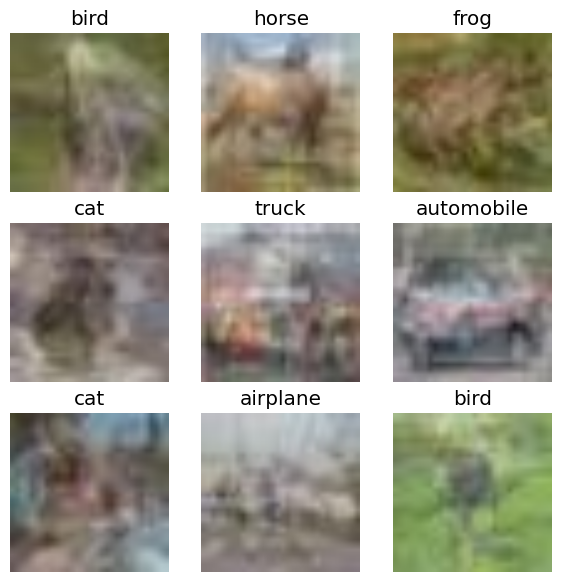

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Obtener el número total de imágenes
num_train = len(dls.train_ds)
num_valid = len(dls.valid_ds)

print(f"Número total de imágenes en entrenamiento: {num_train}")
print(f"Número total de imágenes en validación: {num_valid}")

# Obtener la distribución de clases
class_counts = dls.train_ds.vocab  # Obtiene las clases
print("\nClases:", class_counts)

Número total de imágenes en entrenamiento: 5642
Número total de imágenes en validación: 5000

Clases: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.177453,4.800984,0.198400,0.198400,0.154430,00:40
1,1.820461,9.101157,0.133400,0.133400,0.084009,00:39
2,1.621187,7.046339,0.193400,0.193400,0.136550,00:38
3,1.465563,4.517859,0.251000,0.251000,0.217175,00:37
4,1.323033,7.815624,0.176000,0.176000,0.129923,00:32
5,1.178063,5.730831,0.232800,0.232800,0.188765,00:31
6,1.108534,5.362916,0.272000,0.272000,0.235200,00:33
7,1.029135,6.830094,0.219600,0.219600,0.170710,00:32
8,0.955176,5.148783,0.279600,0.279600,0.222587,00:31
9,0.800716,3.771613,0.381000,0.381000,0.361459,00:38


No improvement since epoch 19: early stopping

Tiempo de entrenamiento: 935.08 segundos


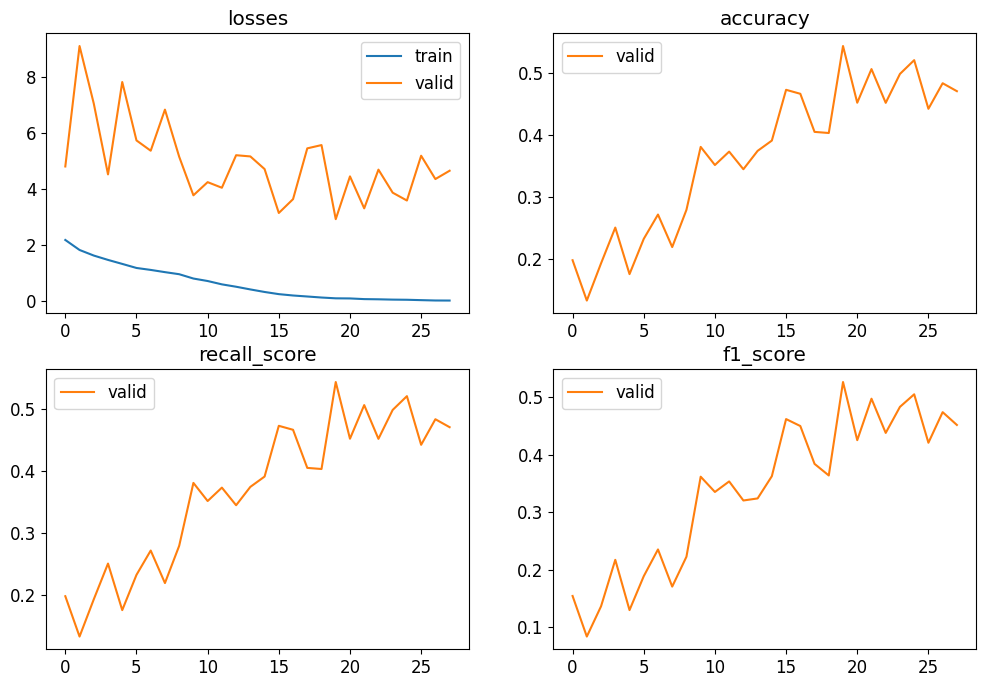

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 4.6488
Accuracy: 0.4708
Recall: 0.4708
F1-Score: 0.4513


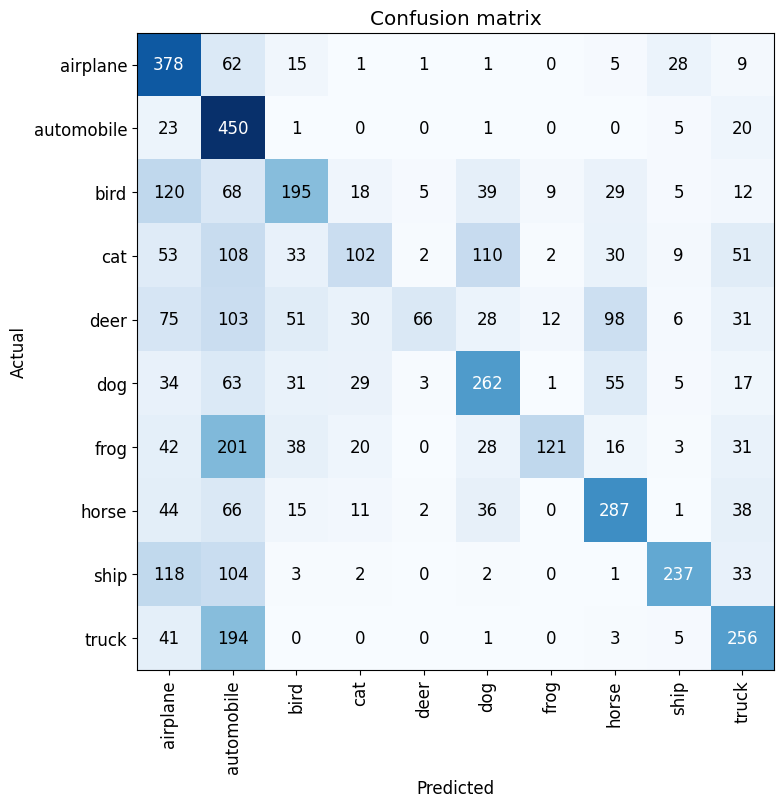

In [ ]:
#Creamos la interpretación de nuestro learner
interp = ClassificationInterpretation.from_learner(learn)

#Visualizamos la matriz de confusión
interp.plot_confusion_matrix(figsize=(8,8), dpi=100)

In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster01_v3.pkl')

Example 2

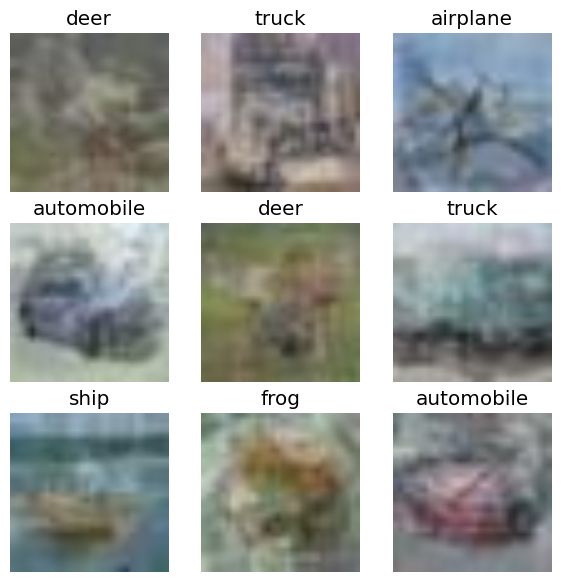

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.312994,4.056218,0.227400,0.227400,0.177536,00:32
1,1.774896,4.668476,0.248800,0.248800,0.207581,00:31
2,1.572151,4.882865,0.253400,0.253400,0.201124,00:32
3,1.432084,4.162304,0.286400,0.286400,0.260409,00:31
4,1.307709,6.898356,0.194800,0.194800,0.155746,00:31
5,1.231900,9.154642,0.174400,0.174400,0.130354,00:30
6,1.131887,10.680102,0.258200,0.258200,0.173260,00:32
7,1.012568,3.855645,0.364000,0.364000,0.331354,00:31
8,0.908951,3.986757,0.341800,0.341800,0.291852,00:31
9,0.803437,8.908229,0.258800,0.258800,0.216958,00:31


No improvement since epoch 10: early stopping

Tiempo de entrenamiento: 605.07 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 4.4657
Accuracy: 0.4332
Recall: 0.4332
F1-Score: 0.4052


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster02_v3.pkl')

Example 3

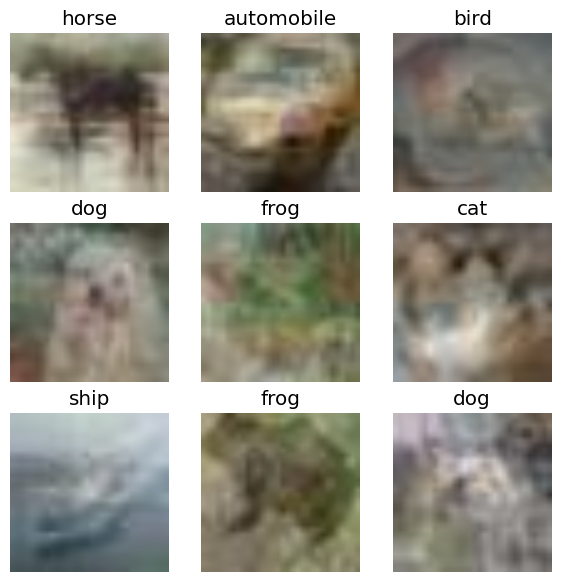

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.232658,7.294694,0.169600,0.169600,0.130244,00:33
1,1.813597,7.217902,0.183600,0.183600,0.135157,00:31
2,1.581010,3.635674,0.265400,0.265400,0.231505,00:32
3,1.395192,4.819180,0.259200,0.259200,0.204322,00:32
4,1.274268,6.732766,0.176400,0.176400,0.133140,00:32
5,1.168702,5.693344,0.216600,0.216600,0.156556,00:31
6,1.070918,3.785969,0.302600,0.302600,0.253296,00:32
7,0.975798,6.165820,0.290000,0.290000,0.238876,00:32
8,0.863656,6.399005,0.235800,0.235800,0.179575,00:32
9,0.769152,4.557249,0.356400,0.356400,0.331915,00:31


No improvement since epoch 10: early stopping

Tiempo de entrenamiento: 614.75 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 5.4570
Accuracy: 0.4232
Recall: 0.4232
F1-Score: 0.3797


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster03_v3.pkl')

Example 4

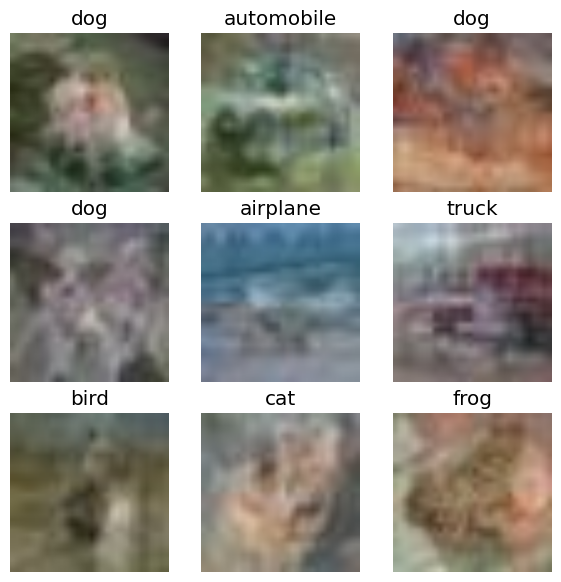

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.215535,5.722795,0.192200,0.192200,0.129311,00:32
1,1.799734,7.684727,0.151600,0.151600,0.105677,00:33
2,1.595096,7.937583,0.156600,0.156600,0.091139,00:32
3,1.421744,4.639911,0.229600,0.229600,0.185137,00:31
4,1.289866,7.642022,0.158800,0.158800,0.101635,00:33
5,1.189583,5.859307,0.202400,0.202400,0.146607,00:32
6,1.113217,5.837623,0.207000,0.207000,0.154642,00:32
7,0.988264,3.715347,0.326600,0.326600,0.293070,00:33
8,0.899842,6.656712,0.246600,0.246600,0.179248,00:32
9,0.776868,3.302137,0.387600,0.387600,0.359939,00:32


No improvement since epoch 10: early stopping

Tiempo de entrenamiento: 617.39 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 7.3858
Accuracy: 0.3388
Recall: 0.3388
F1-Score: 0.2964


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster04_v3.pkl')

Example 5

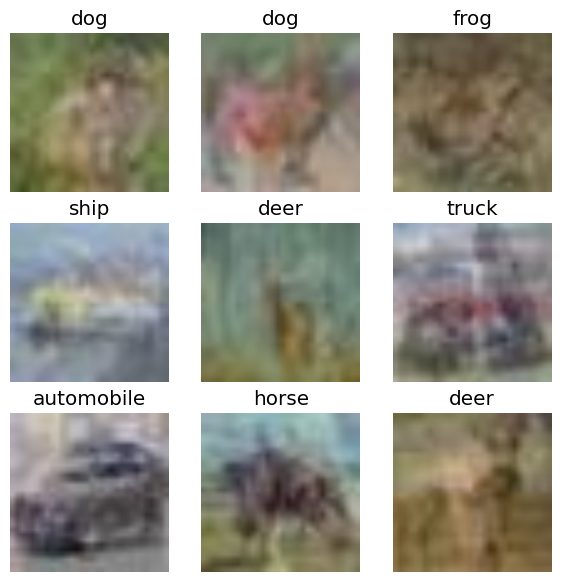

In [ ]:
#random.seed(42)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=lambda p: get_items_fraction(p, train_fraction=0.5),
    splitter=GrandparentSplitter(train_name='training', valid_name='valid'),
    get_y=parent_label,
    item_tfms=Resize(224)

)

dls = dblock.dataloaders(dst, bs=64)

dls.show_batch(max_n=9, figsize=(7,7))

In [ ]:
# Crear el objeto learn
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, Recall(average='macro'), F1Score(average='macro')], pretrained=False, cbs=[EarlyStoppingCallback(monitor='valid_loss', patience=8)])

start_time = time.time()
learn.fit_one_cycle(40)
end_time = time.time()

print(f"\nTiempo de entrenamiento: {end_time - start_time:.2f} segundos")

epoch,train_loss,valid_loss,accuracy,recall_score,f1_score,time
0,2.105425,5.254036,0.202200,0.202200,0.160406,00:32
1,1.715439,5.670704,0.194600,0.194600,0.139970,00:32
2,1.542882,4.282848,0.255400,0.255400,0.210589,00:31
3,1.434589,4.723100,0.257600,0.257600,0.222704,00:32
4,1.291353,4.785499,0.266000,0.266000,0.225908,00:32
5,1.178874,7.032787,0.209200,0.209200,0.166943,00:31
6,1.079236,3.110745,0.350200,0.350200,0.328688,00:33
7,0.975213,10.951133,0.159400,0.159400,0.089257,00:32
8,0.887313,3.969821,0.329400,0.329400,0.309512,00:32
9,0.797626,4.864131,0.313800,0.313800,0.282117,00:33


No improvement since epoch 11: early stopping

Tiempo de entrenamiento: 652.25 segundos


In [ ]:
loss, acc, recall, f1 = learn.validate()

print(f'Loss: {loss:.4f}')
print(f'Accuracy: {acc:.4f}')
print(f"Recall: {recall:.4f}")
print(f'F1-Score: {f1:.4f}')

Loss: 3.7029
Accuracy: 0.4980
Recall: 0.4980
F1-Score: 0.4907


In [ ]:
learn.export('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster05_v3.pkl')

# TEST

In [ ]:
test_path = Path('/content/dataset/original/cifar10/test')

## Original - Lenet

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_original_v2.pkl')

In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)

)

In [ ]:
learn.remove_cb(EarlyStoppingCallback)

test_dls = test_block.dataloaders(test_path)
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)

print(f'Loss: {loss}')
print(f'Accuracy: {acc}')
print(f"Recall: {recall}")
print(f'F1-Score: {f1}')

Loss: 1.3248788118362427
Accuracy: 0.5368589758872986
Recall: 0.5369069581489961
F1-Score: 0.5325407701447686


## Original RESNET18

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_original_v2.pkl')

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

In [ ]:
#learn.remove_cb(EarlyStoppingCallback)

test_dls = dblock.dataloaders(test_path)
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)

print(f'Loss: {loss}')
print(f'Accuracy: {acc}')
print(f"Recall: {recall}")
print(f'F1-Score: {f1}')

Loss: 0.5704317688941956
Accuracy: 0.8512620329856873
Recall: 0.8512511773110228
F1-Score: 0.8509147011067959


## lENET - 001

In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_v2.pkl')


In [ ]:
learn.remove_cb(EarlyStoppingCallback)

loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 5.927553176879883
Accuracy: 0.17347756028175354
Recall (macro): 0.17347064108558904
F1 Score (macro): 0.1499281637371561


## Lenet 005

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_v2.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.71325421333313
Accuracy: 0.17377804219722748
Recall (macro): 0.17371216328056024
F1 Score (macro): 0.1316009546350739


## Lenet 0001

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_v2.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.50449538230896
Accuracy: 0.2810496687889099
Recall (macro): 0.28105821645033296
F1 Score (macro): 0.2631887221256698


## Resnet 001

In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_v2.pkl')
#learn.remove_cb(EarlyStoppingCallback)

In [ ]:

test_dls = dblock.dataloaders(test_path)
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)

print(f'Loss: {loss}')
print(f'Accuracy: {acc}')
print(f"Recall: {recall}")
print(f'F1-Score: {f1}')

Loss: 6.417395114898682
Accuracy: 0.17808493971824646
Recall: 0.1780479919712035
F1-Score: 0.14321403009087144


## Resnet 005

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_002_v3.pkl')
#learn.remove_cb(EarlyStoppingCallback)

In [ ]:

test_dls = dblock.dataloaders(test_path)
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)

print(f'Loss: {loss}')
print(f'Accuracy: {acc}')
print(f"Recall: {recall}")
print(f'F1-Score: {f1}')

Loss: 7.256735801696777
Accuracy: 0.1015625
Recall: 0.10169858573717143
F1-Score: 0.02602419881564927


## Resnet 0001

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_v2.pkl')
#learn.remove_cb(EarlyStoppingCallback)

In [ ]:
test_dls = dblock.dataloaders(test_path)
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)

print(f'Loss: {loss}')
print(f'Accuracy: {acc}')
print(f"Recall: {recall}")
print(f'F1-Score: {f1}')

Loss: 3.684063196182251
Accuracy: 0.5005007982254028
Recall: 0.5005606360615363
F1-Score: 0.48414562654693755


## Base & 5 cluster - Lenet

In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_5cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 1.1498992443084717
Accuracy: 0.5911458134651184
Recall (macro): 0.5911041030908356
F1 Score (macro): 0.5876750458073919


## Distilled 001 & 5 cluster - Lenet

In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 3.6325652599334717
Accuracy: 0.21404246985912323
Recall (macro): 0.21405054993647282
F1 Score (macro): 0.18328930439931362


 Distilled 001 & 5 cluster - Lenet Ex2


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster02_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.534672260284424
Accuracy: 0.18679888546466827
Recall (macro): 0.18686754856827953
F1 Score (macro): 0.14655693407189885


Distilled 001 & 5 cluster - Lenet Ex3


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster03_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 4.0008544921875
Accuracy: 0.16796875
Recall (macro): 0.16802653623366265
F1 Score (macro): 0.12414415499407942


Distilled 001 & 5 cluster - Lenet Ex4


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster04_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 3.7557857036590576
Accuracy: 0.17127403616905212
Recall (macro): 0.17129126208477324
F1 Score (macro): 0.15852849741746028


Distilled 001 & 5 cluster - Lenet Ex5


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_5cluster05_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 3.842653751373291
Accuracy: 0.1968149095773697
Recall (macro): 0.19673593656800714
F1 Score (macro): 0.1757817980125977


## Distilled 005 & 5 cluster - Lenet


In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.3014073371887207
Accuracy: 0.10006009787321091
Recall (macro): 0.1
F1 Score (macro): 0.018191750887735593


Distilled 005 & 5 cluster - Lenet Ex2


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster02_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.2945735454559326
Accuracy: 0.11969150602817535
Recall (macro): 0.11963136647158652
F1 Score (macro): 0.04954728413490879


Distilled 005 & 5 cluster - Lenet Ex3

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster03_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.299905776977539
Accuracy: 0.12399839609861374
Recall (macro): 0.12409834975869494
F1 Score (macro): 0.05378071894828492


Distilled 005 & 5 cluster - Lenet Ex4


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster04_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.2996017932891846
Accuracy: 0.14142628014087677
Recall (macro): 0.14130741563448182
F1 Score (macro): 0.05130288007278796


Distilled 005 & 5 cluster - Lenet Ex5


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_5cluster05_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.2986090183258057
Accuracy: 0.09975961595773697
Recall (macro): 0.09979949929950171
F1 Score (macro): 0.01855666216164136


## Distilled 0001 & 5 cluster - Lenet


In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.3811378479003906
Accuracy: 0.27263620495796204
Recall (macro): 0.27262729596294516
F1 Score (macro): 0.24982818724744987


Distilled 0001 & 5 cluster - Lenet Ex2


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster02_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.637408971786499
Accuracy: 0.24819710850715637
Recall (macro): 0.24807637518726927
F1 Score (macro): 0.22014044354328752


Distilled 0001 & 5 cluster - Lenet Ex3


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster03_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.4553892612457275
Accuracy: 0.26201921701431274
Recall (macro): 0.2619439839623591
F1 Score (macro): 0.23928650692202513


Distilled 0001 & 5 cluster - Lenet Ex4


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster04_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.4628827571868896
Accuracy: 0.25380608439445496
Recall (macro): 0.2537819611240759
F1 Score (macro): 0.23360495347327298


Distilled 0001 & 5 cluster - Lenet Ex5


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_5cluster05_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.509495258331299
Accuracy: 0.2816506326198578
Recall (macro): 0.28161801988781626
F1 Score (macro): 0.25298658244033256


## Base & 5 cluster - Resnet

In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    item_tfms=Resize(224),
    splitter=IndexSplitter([])
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_5cluster01_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 0.11747819930315018
Accuracy: 0.9690504670143127
Recall (macro): 0.9690490500482596
F1 Score (macro): 0.9690565114387658


## Distilled 001 & 5 cluster - Resnet




In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

test_dls = dblock.dataloaders(test_path)


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_5cluster01_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 6.230086326599121
Accuracy: 0.1925080120563507
Recall (macro): 0.19260177649503946
F1 Score (macro): 0.14573284517279617


 Distilled 001 & 5 cluster - Resnet Ex2


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_5cluster02_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 7.832684516906738
Accuracy: 0.15745192766189575
Recall (macro): 0.15749018983425853
F1 Score (macro): 0.09700670173677642


 Distilled 001 & 5 cluster - Resnet Ex3


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_5cluster03_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 7.94047737121582
Accuracy: 0.1393229216337204
Recall (macro): 0.13931827989884313
F1 Score (macro): 0.08730246408431827


## Distilled 005 & 5 cluster - Resnet


In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

test_dls = dblock.dataloaders(test_path)


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_5cluster01_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 6.851982116699219
Accuracy: 0.10576923191547394
Recall (macro): 0.10561151151151152
F1 Score (macro): 0.030454546328770166


Distilled 005 & 5 cluster - Resnet Ex2


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_5cluster02_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 4.478379249572754
Accuracy: 0.10076121985912323
Recall (macro): 0.1007183542277803
F1 Score (macro): 0.03268304730149949


Distilled 005 & 5 cluster - Resnet Ex3


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_5cluster03_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 5.814696311950684
Accuracy: 0.11117788404226303
Recall (macro): 0.11122244488977957
F1 Score (macro): 0.03616397864336597


## Distilled 0001 & 5 cluster - Resnet


In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

test_dls = dblock.dataloaders(test_path)


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster01_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 5.45405387878418
Accuracy: 0.3638822138309479
Recall (macro): 0.3637848249652257
F1 Score (macro): 0.3373952826483809


Distilled 0001 & 5 cluster - Resnet Ex2


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster02_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 3.3290417194366455
Accuracy: 0.4986979067325592
Recall (macro): 0.49861454530484084
F1 Score (macro): 0.4834448661677374


Distilled 0001 & 5 cluster - Resnet Ex3


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster03_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 3.713435173034668
Accuracy: 0.5272436141967773
Recall (macro): 0.5272531081568702
F1 Score (macro): 0.5041960848533412


Distilled 0001 & 5 cluster - Resnet Ex4


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster04_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 4.105567932128906
Accuracy: 0.5036057829856873
Recall (macro): 0.5035762236774617
F1 Score (macro): 0.478509177986695


Distilled 0001 & 5 cluster - Resnet Ex5

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_5cluster05_v3.pkl')


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 5.378940105438232
Accuracy: 0.41225960850715637
Recall (macro): 0.4123511711187372
F1 Score (macro): 0.3886522726894742


## Base & 2 cluster - Lenet

In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_2cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

/usr/local/lib/python3.11/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 1.1093695163726807
Accuracy: 0.6131811141967773
Recall (macro): 0.6132450017393009
F1 Score (macro): 0.6107061906032218


## Distilled 001 & 2 cluster - Lenet


In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.685424327850342
Accuracy: 0.14513221383094788
Recall (macro): 0.14510879534597984
F1 Score (macro): 0.08837089877133478


Distilled 001 & 2 cluster - Lenet Ex 2

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster02_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 3.1105730533599854
Accuracy: 0.1877003163099289
Recall (macro): 0.18774103102103118
F1 Score (macro): 0.16398564014604872


Distilled 001 & 2 cluster - Lenet Ex 3

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster03_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.7874019145965576
Accuracy: 0.15134215354919434
Recall (macro): 0.15138317556381808
F1 Score (macro): 0.11449953745760852


Distilled 001 & 2 cluster - Lenet Ex 4

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster04_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.30041766166687
Accuracy: 0.15554888546466827
Recall (macro): 0.1556577055811416
F1 Score (macro): 0.10910206642037146


Distilled 001 & 2 cluster - Lenet Ex 5

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_001_2cluster05_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.7093677520751953
Accuracy: 0.17257611453533173
Recall (macro): 0.17259302796772677
F1 Score (macro): 0.1288851202337255


## Distilled 005 & 2 cluster - Lenet


In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.3044886589050293
Accuracy: 0.10106170177459717
Recall (macro): 0.10110020040080159
F1 Score (macro): 0.02203564348527736


Distilled 005 & 2 cluster - Lenet Ex 2

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster02_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.3021955490112305
Accuracy: 0.1041666641831398
Recall (macro): 0.10410410410410412
F1 Score (macro): 0.026926778626974013


Distilled 005 & 2 cluster - Lenet Ex 3

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster03_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.30361270904541
Accuracy: 0.10016025602817535
Recall (macro): 0.1
F1 Score (macro): 0.01820830298616169


Distilled 005 & 2 cluster - Lenet Ex 4

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster04_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.303986072540283
Accuracy: 0.11999198794364929
Recall (macro): 0.11999060243794446
F1 Score (macro): 0.03858781960219941


Distilled 005 & 2 cluster - Lenet Ex 5

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_005_2cluster05_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.3039424419403076
Accuracy: 0.10016025602817535
Recall (macro): 0.1
F1 Score (macro): 0.01820830298616169


## Distilled 0001 & 2 cluster - Lenet


In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=IndexSplitter([]),
    item_tfms=Resize(28)
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.482687473297119
Accuracy: 0.22956730425357819
Recall (macro): 0.22951273531827104
F1 Score (macro): 0.2059133335638327


Distilled 0001 & 2 cluster - Lenet Ex 2

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster02_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.3567416667938232
Accuracy: 0.23828125
Recall (macro): 0.23832862705014132
F1 Score (macro): 0.20357192857694278


Distilled 0001 & 2 cluster - Lenet Ex 3

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster02_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.3579518795013428
Accuracy: 0.2380809336900711
Recall (macro): 0.23800340170081155
F1 Score (macro): 0.2032171326492652


Distilled 0001 & 2 cluster - Lenet Ex 4

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster04_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.465743064880371
Accuracy: 0.2111378163099289
Recall (macro): 0.2110104171214026
F1 Score (macro): 0.19082252874459385


Distilled 0001 & 2 cluster - Lenet Ex 5

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster05_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TFG/modelos/lenet_distilled_0001_2cluster05_v3.pkl'

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

## Base & 2 cluster - Resnet

In [ ]:
test_block = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    item_tfms=Resize(224),
    splitter=IndexSplitter([])
)

test_dls = test_block.dataloaders(test_path)

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_2cluster01_v3.pkl')
learn.remove_cb(EarlyStoppingCallback)

/usr/local/lib/python3.11/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 0.12827061116695404
Accuracy: 0.9665464758872986
Recall (macro): 0.9665371265945331
F1 Score (macro): 0.9666514665215491


## Distilled 001 & 2 cluster - Resnet


In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

test_dls = dblock.dataloaders(test_path)


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_2cluster01_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 9.436843872070312
Accuracy: 0.13191105425357819
Recall (macro): 0.1319071679001973
F1 Score (macro): 0.05338671594384466


Distilled 001 & 2 cluster - Resnet Ex 2


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_2cluster02_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 11.122469902038574
Accuracy: 0.11398237198591232
Recall (macro): 0.11393792269223131
F1 Score (macro): 0.0532896387374918


Distilled 001 & 2 cluster - Resnet Ex 3

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_001_2cluster03_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 7.993863582611084
Accuracy: 0.10006009787321091
Recall (macro): 0.09992963401786428
F1 Score (macro): 0.03629996999622877


## Distilled 005 & 2 cluster - Resnet


In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

test_dls = dblock.dataloaders(test_path)


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_2cluster01_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.472093105316162
Accuracy: 0.10006009787321091
Recall (macro): 0.0999005005005005
F1 Score (macro): 0.01912402729518059


Distilled 005 & 2 cluster - Resnet Ex 2

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_2cluster02_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.4750454425811768
Accuracy: 0.11949118226766586
Recall (macro): 0.11946216703514649
F1 Score (macro): 0.04840628537884904


Distilled 005 & 2 cluster - Resnet Ex 3

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_005_2cluster03_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 2.9340343475341797
Accuracy: 0.10006009787321091
Recall (macro): 0.0999007007007007
F1 Score (macro): 0.01979261745399149


## Distilled 0001 & 2 cluster - Resnet


In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.0, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224),
    )

test_dls = dblock.dataloaders(test_path)


In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster01_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 4.6420416831970215
Accuracy: 0.4691506326198578
Recall (macro): 0.46924094166246205
F1 Score (macro): 0.44697659148697977


Distilled 0001 & 2 cluster - Resnet Ex 2

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster02_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 4.4089035987854
Accuracy: 0.4352964758872986
Recall (macro): 0.4353238012276955
F1 Score (macro): 0.40882438855058056


Distilled 0001 & 2 cluster - Resnet Ex 3

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster03_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 5.510874271392822
Accuracy: 0.41846954822540283
Recall (macro): 0.41864441520789997
F1 Score (macro): 0.37071079524279954


Distilled 0001 & 2 cluster - Resnet Ex 4

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster04_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 7.350310325622559
Accuracy: 0.33974358439445496
Recall (macro): 0.33972750897380916
F1 Score (macro): 0.2951788004154152


Distilled 0001 & 2 cluster - Resnet Ex 5

In [ ]:
learn = load_learner('/content/drive/MyDrive/TFG/modelos/resnet_distilled_0001_2cluster05_v3.pkl')

In [ ]:
loss, acc, recall, f1 = learn.validate(dl=test_dls.train)
print(f"Loss: {loss}")
print(f"Accuracy: {acc}")
print(f"Recall (macro): {recall}")
print(f"F1 Score (macro): {f1}")

Loss: 3.70363450050354
Accuracy: 0.4891826808452606
Recall (macro): 0.48912391275550116
F1 Score (macro): 0.4777965186665005
